In [1]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>.container {width:95% !important; }</style>"))

# check environment
import os
print(f'Conda Environment: ' + os.environ['CONDA_DEFAULT_ENV'])

from platform import python_version
print(f'python version: {python_version()}')

Conda Environment: ROICaT
python version: 3.9.13


In [2]:
import pprint
from pathlib import Path
import re

import natsort
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
%load_ext autoreload
%autoreload 2
import bnpm
import bnpm.server
import bnpm.plotting_helpers
import bnpm.file_helpers
import bnpm.path_helpers
import bnpm.indexing
import bnpm.timeSeries
import bnpm.decomposition

import bnpm.parallel_helpers

In [4]:
import itertools
import datetime

import scipy.io
import pandas as pd
import numpy as np
import matplotlib as mpl

In [5]:
mouse = 'mouse_0322R'
cage = 'cage_0322'

In [6]:
# ## mouse_B

# dates_toUse = [
#     '20221021',
#     '20221022',
#     '20221023',
#     '20221024',
#     '20221025',
#     '20221026',
#     '20221028',
#     '20221029',
#     '20221030',
#     '20221031',
#     '20221101',
#     '20221102',
#     '20221103',
#     '20221104',
#     '20221105',
#     '20221106',
# ]

In [7]:
# ## mouse_g1

# dates_toUse = [
#     '20221011',
#     '20221013',
#     '20221014',
#     '20221015',
#     '20221016',
# ]

In [8]:
# ## mouse_2_6

# dates_toUse = [
#     '20210409',
#     '20210410',
#     '20210411',
#     '20210412',
#     '20210413',
#     '20210414',
#     '20210415',
#     '20210416',
#     '20210417',
# ]

In [9]:
# ## mouse_1511L

# dates_toUse = [
# #     '20230111',
#     '20230112',
#     '20230113',
#     '20230114',
#     '20230115',
#     '20230116',
#     '20230117',
#     '20230118',
#     '20230119',
#     '20230120',
#     '20230121',
#     '20230122',
#     '20230123',
#     '20230124',
#     '20230125',
#     '20230126',
#     '20230127',
#     '20230128',
#     '20230129',
#     '20230130',
# ]

In [11]:
# ## mouse_1511L

# dates_toUse = [
# #     '20230111',
#     '20230314',
#     '20230315',
#     '20230316',
#     '20230317',
#     '20230318',
# ]

In [125]:
dates_toUse = [
#     '20230425',
    '20230426',
    '20230427',
    '20230428',
    '20230429',
    '20230430',
    '20230501',
    '20230503',
    '20230504',
    '20230505',
    '20230506',
    '20230507',
    '20230508',
    '20230509',
    '20230511',
    '20230512',
    '20230513',
    '20230514',
    '20230515',
]

In [14]:
Fs = 30

In [15]:
dir_save_data = f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}'

# Get files from server

input credentials for server

In [16]:
import getpass

remote_host_transfer = "transfer.rc.hms.harvard.edu"
remote_host_compute = "o2.hms.harvard.edu"
username = input('Username: ')
pw = bnpm.server.pw_encode(getpass.getpass(prompt='Password: '))

Username: rh183
Password: ········


prepare sftp client

In [18]:
ssh_t = bnpm.server.ssh_interface()

ssh_t.o2_connect(
    hostname=remote_host_transfer,
    username=username,
    password=bnpm.server.pw_decode(pw),
    skip_passcode=False,
    key_filename=None,
    look_for_keys=False,
    passcode_method=1,
    verbose=1,
)

Duo two-factor login for rh183

Enter a passcode or select one of the following options:

 1. Duo Push to XXX-XXX-4151
 2. Phone call to XXX-XXX-4151
 3. SMS passcodes to XXX-XXX-4151

Passcode or option (1-3): 
1



Pushed a login request to your device...

Success. Logging you in...
Welcome to O2 (Orchestra 2)!

   ___    ____
  / _ \  |___ \
 | | | |   __) |
 | |_| |  / __/
  \___/  |_____|


You've landed on transfer06 which is a
4 core system with 7.64 GiB memory
running kernel 3.10.0 born on 2020-08-11

==== O2 ===================================================================

  News (Sep 8 2022)
  

  +-------------------------------------------------------------------------------+
  | ###################### Try out the new O2 Portal! ########################### |
  |                                                                               |
  | * Access O2 via the web! Just point your web browser to                       |
  |   o2portal.rc.hms.harvard.edu and login with

In [19]:
sftp_t = bnpm.server.sftp_interface(ssh_t.client)

### find logger files
Search for logger files and associated expParams files

In [20]:
paths_logger_raw = sftp_t.search_recursive(
#     path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='logger.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230515/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230430/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230512/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230511/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230514/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230504/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230507/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230513/analysis_data/logger.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230424/analysis_data/logger.mat
/n/files/Neurobio/MI

In [21]:
# paths_logger = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_logger_raw)}  ## mouse_g1
paths_logger = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_logger_raw) if Path(p).parent.name == 'analysis_data'}  ## mouse_B
# paths_logger = {Path(p).parent.name: p for p in natsort.natsorted(paths_logger_raw)}  ## mouse 2_6
display(paths_logger)

{'20230419': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230419/analysis_data/logger.mat',
 '20230420': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/analysis_data/logger.mat',
 '20230424': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230424/analysis_data/logger.mat',
 '20230425': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/analysis_data/logger.mat',
 '20230426': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230426/analysis_data/logger.mat',
 '20230427': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230427/analysis_data/logger.mat',
 '20230428': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230428/analysis_data/logger.mat',
 '20230429': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230429/analysis_data/logger.mat',
 '20230430': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230430/a

In [281]:
paths_logger_valsROIs = sftp_t.search_recursive(
#     path=f'/n/data1/hms/neurobio/sabatini/rich/analysis/logger_alignment/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
#     path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/{mouse}',
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='logger_valsROIs.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230515/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230430/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230512/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230511/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230514/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230504/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230507/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230513/analysis_data/logger_valsROIs.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_

In [282]:
paths_logger_valsROIs = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_logger_valsROIs)}
display(paths_logger_valsROIs)

{'20230419': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230419/analysis_data/logger_valsROIs.mat',
 '20230420': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/analysis_data/logger_valsROIs.mat',
 '20230424': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230424/analysis_data/logger_valsROIs.mat',
 '20230425': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/analysis_data/logger_valsROIs.mat',
 '20230426': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230426/analysis_data/logger_valsROIs.mat',
 '20230427': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230427/analysis_data/logger_valsROIs.mat',
 '20230428': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230428/analysis_data/logger_valsROIs.mat',
 '20230429': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230429/analysis_data/logger_valsROIs.mat',
 '20230430': '/n

In [22]:
paths_expParams_raw = sftp_t.search_recursive(
#     path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/BWAIN_output/mouse_g8t',
    search_pattern_re='expParams.mat',
    max_depth=5,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230515/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230430/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230512/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230511/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230514/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230504/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230507/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230513/analysis_data/expParams.mat
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230424/analysis_data/expP

In [23]:
paths_expParams = {Path(p).parent.parent.name: p for p in natsort.natsorted(paths_expParams_raw)}
# paths_expParams = {Path(p).parent.name: p for p in natsort.natsorted(paths_expParams_raw)}
display(paths_expParams)

{'20230419': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230419/analysis_data/expParams.mat',
 '20230420': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/analysis_data/expParams.mat',
 '20230424': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230424/analysis_data/expParams.mat',
 '20230425': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/analysis_data/expParams.mat',
 '20230426': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230426/analysis_data/expParams.mat',
 '20230427': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230427/analysis_data/expParams.mat',
 '20230428': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230428/analysis_data/expParams.mat',
 '20230429': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230429/analysis_data/expParams.mat',
 '20230430': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_032

In [25]:
paths_stat_raw = sftp_t.search_recursive(
#     path=f'/n/data1/hms/neurobio/sabatini/rich/analysis/suite2p_output/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/rich/data/res2p/round_5_experiments/{mouse}/scanimage',
    path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/{mouse}',
#     path=f'/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_g8t',
    search_pattern_re='stat.npy',
    max_depth=7,
    find_files=True,
    find_folders=False,
    verbose=True,
)

/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230420/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230430/scanimage_data/baseline/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230430/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230430/scanimage_data/zstack/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230504/scanimage_data/baseline/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230504/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230504/scanimage_data/zstack/jobNum_0/suite2p/plane0/stat.npy
/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/m

In [26]:
paths_stat_raw2 = natsort.natsorted([p for p in paths_stat_raw if '/exp/' in p])

In [27]:
# paths_stat = {Path(p).parent.parent.parent.parent.parent.parent.name: p for p in natsort.natsorted(paths_stat)}
# paths_stat = {Path(p).parent.parent.parent.parent.name: p for p in natsort.natsorted(paths_stat_raw)}
paths_stat = {re.search('\d{8}', p).group(): p for p in natsort.natsorted(paths_stat_raw2)}
display(paths_stat)

{'20230419': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230419/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230420': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230420/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230424': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230424/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230425': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230425/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230426': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230426/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230427': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230427/scanimage_data/exp/jobNum_0/suite2p/plane0/stat.npy',
 '20230428': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230428/scanimage_data/exp

In [28]:
paths_ops = {date: str(Path(p).parent / 'ops.npy') for date,p in paths_stat.items()}

In [29]:
paths_ops

{'20230419': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230419/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230420': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230420/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230424': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230424/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230425': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230425/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230426': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230426/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230427': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230427/scanimage_data/exp/jobNum_0/suite2p/plane0/ops.npy',
 '20230428': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230428/scanimage_data/exp/jobNu

In [30]:
paths_F = {date: str(Path(p).parent / 'F.npy') for date,p in paths_stat.items()}

In [31]:
paths_F

{'20230419': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230419/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230420': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230420/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230424': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230424/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230425': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230425/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230426': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230426/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230427': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230427/scanimage_data/exp/jobNum_0/suite2p/plane0/F.npy',
 '20230428': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230428/scanimage_data/exp/jobNum_0/suite2p/

In [32]:
paths_Fneu = {date: str(Path(p).parent / 'Fneu.npy') for date,p in paths_stat.items()}

In [33]:
paths_Fneu

{'20230419': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230419/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230420': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230420/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230424': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230424/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230425': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230425/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230426': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230426/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230427': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230427/scanimage_data/exp/jobNum_0/suite2p/plane0/Fneu.npy',
 '20230428': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230428/scanimage_data/exp

In [34]:
paths_spks = {date: str(Path(p).parent / 'spks.npy') for date,p in paths_stat.items()}

In [35]:
paths_spks

{'20230419': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230419/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230420': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230420/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230424': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230424/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230425': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230425/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230426': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230426/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230427': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230427/scanimage_data/exp/jobNum_0/suite2p/plane0/spks.npy',
 '20230428': '/n/data1/hms/neurobio/sabatini/gyu/analysis/suite2p_output/mouse_0322R/20230428/scanimage_data/exp

In [36]:
assert all([sftp_t.exists(p) for date,p in paths_ops.items()])

In [37]:
paths_local_tmp = {d: str(Path(dir_save_data) / 'statFiles' / d) for d,_ in paths_stat.items()}
[Path(p).mkdir(parents=True, exist_ok=True) for p in paths_local_tmp];

In [38]:
[sftp_t.get(
    remotepath=paths_stat[date],
    localpath=str(Path(paths_local_tmp[date]) / 'stat.npy'),
) for date in tqdm(list(paths_stat.keys()))];

  0%|                                                    | 0/18 [00:00<?, ?it/s]
0.00b [00:00, ?b/s]
  1%|▌                                      | 262k/19.3M [00:00<00:07, 2.56Mb/s]
  4%|█▋                                     | 852k/19.3M [00:00<00:04, 4.50Mb/s]
  8%|███                                   | 1.57M/19.3M [00:00<00:03, 5.58Mb/s]
 13%|█████                                 | 2.56M/19.3M [00:00<00:02, 7.11Mb/s]
 19%|███████                               | 3.60M/19.3M [00:00<00:01, 8.26Mb/s]
 26%|█████████▋                            | 4.95M/19.3M [00:00<00:01, 9.64Mb/s]
 33%|████████████▌                         | 6.39M/19.3M [00:00<00:01, 11.1Mb/s]
 41%|███████████████▋                      | 8.00M/19.3M [00:00<00:00, 12.4Mb/s]
 51%|███████████████████▎                  | 9.86M/19.3M [00:00<00:00, 14.2Mb/s]
 60%|██████████████████████▋               | 11.6M/19.3M [00:01<00:00, 15.1Mb/s]
 71%|███████████████████████████           | 13.8M/19.3M [00:01<00:00, 17.2Mb/s]
 84%|███

In [39]:
[sftp_t.get(
    remotepath=paths_ops[date],
    localpath=str(Path(paths_local_tmp[date]) / 'ops.npy'),
) for date in tqdm(list(paths_ops.keys()))];

  0%|                                                    | 0/18 [00:00<?, ?it/s]
0.00b [00:00, ?b/s]
  2%|▋                                      | 4.10M/232M [00:00<00:05, 40.2Mb/s]
  4%|█▋                                     | 10.3M/232M [00:00<00:04, 52.7Mb/s]
  7%|██▊                                    | 16.6M/232M [00:00<00:03, 57.4Mb/s]
 10%|███▊                                   | 23.0M/232M [00:00<00:03, 60.0Mb/s]
 13%|████▉                                  | 29.8M/232M [00:00<00:03, 62.9Mb/s]
 16%|██████                                 | 36.4M/232M [00:00<00:03, 63.8Mb/s]
 19%|███████▎                               | 43.5M/232M [00:00<00:02, 66.1Mb/s]
 22%|████████▌                              | 50.7M/232M [00:00<00:02, 67.9Mb/s]
 25%|█████████▊                             | 58.1M/232M [00:00<00:02, 69.8Mb/s]
 28%|██████████▉                            | 65.1M/232M [00:01<00:02, 69.3Mb/s]
 31%|████████████                           | 72.1M/232M [00:01<00:02, 69.1Mb/s]
 34%|███

 26%|██████████▏                            | 60.1M/231M [00:00<00:02, 69.0Mb/s]
 29%|███████████▎                           | 67.0M/231M [00:01<00:02, 66.9Mb/s]
 32%|████████████▍                          | 73.7M/231M [00:01<00:02, 66.9Mb/s]
 35%|█████████████▋                         | 81.2M/231M [00:01<00:02, 69.4Mb/s]
 38%|██████████████▉                        | 88.5M/231M [00:01<00:02, 70.2Mb/s]
 41%|████████████████▏                      | 95.6M/231M [00:01<00:01, 69.8Mb/s]
 44%|█████████████████▊                      | 103M/231M [00:01<00:01, 69.6Mb/s]
 47%|██████████████████▉                     | 110M/231M [00:01<00:01, 63.2Mb/s]
 51%|████████████████████▏                   | 117M/231M [00:01<00:01, 65.9Mb/s]
 54%|█████████████████████▌                  | 124M/231M [00:01<00:01, 68.2Mb/s]
 57%|██████████████████████▊                 | 132M/231M [00:01<00:01, 70.2Mb/s]
 60%|████████████████████████▏               | 139M/231M [00:02<00:01, 72.0Mb/s]
 64%|███████████████████████

 35%|█████████████▊                         | 81.9M/231M [00:01<00:01, 76.0Mb/s]
 39%|███████████████                        | 89.6M/231M [00:01<00:01, 76.0Mb/s]
 42%|████████████████▍                      | 97.7M/231M [00:01<00:01, 77.4Mb/s]
 46%|██████████████████▏                     | 105M/231M [00:01<00:01, 76.6Mb/s]
 49%|███████████████████▌                    | 113M/231M [00:01<00:01, 77.2Mb/s]
 52%|████████████████████▉                   | 121M/231M [00:01<00:01, 77.5Mb/s]
 56%|██████████████████████▎                 | 129M/231M [00:01<00:01, 77.8Mb/s]
 59%|███████████████████████▋                | 137M/231M [00:01<00:01, 76.8Mb/s]
 62%|████████████████████████▉               | 145M/231M [00:01<00:01, 76.0Mb/s]
 66%|██████████████████████████▍             | 153M/231M [00:02<00:01, 77.5Mb/s]
 70%|███████████████████████████▊            | 161M/231M [00:02<00:00, 78.5Mb/s]
 73%|█████████████████████████████▏          | 169M/231M [00:02<00:00, 76.1Mb/s]
 76%|███████████████████████

 30%|███████████▌                           | 69.1M/232M [00:01<00:02, 55.5Mb/s]
 32%|████████████▌                          | 74.6M/232M [00:01<00:02, 55.5Mb/s]
 35%|█████████████▍                         | 80.2M/232M [00:01<00:02, 54.3Mb/s]
 37%|██████████████▍                        | 85.7M/232M [00:01<00:02, 53.7Mb/s]
 39%|███████████████▍                       | 91.5M/232M [00:01<00:02, 54.9Mb/s]
 42%|████████████████▍                      | 97.8M/232M [00:01<00:02, 57.0Mb/s]
 45%|█████████████████▉                      | 104M/232M [00:02<00:02, 57.9Mb/s]
 47%|██████████████████▉                     | 110M/232M [00:02<00:02, 53.3Mb/s]
 50%|███████████████████▊                    | 115M/232M [00:02<00:02, 49.0Mb/s]
 52%|████████████████████▋                   | 120M/232M [00:02<00:02, 48.5Mb/s]
 54%|█████████████████████▌                  | 125M/232M [00:02<00:02, 48.0Mb/s]
 56%|██████████████████████▍                 | 130M/232M [00:02<00:02, 48.3Mb/s]
 58%|███████████████████████

In [40]:
[sftp_t.get(
    remotepath=paths_F[date],
    localpath=str(Path(paths_local_tmp[date]) / 'F.npy'),
) for date in tqdm(list(paths_F.keys()))];

  0%|                                                    | 0/18 [00:00<?, ?it/s]
0.00b [00:00, ?b/s]
  0%|                                      | 2.46M/1.04G [00:00<00:43, 24.1Mb/s]
  1%|▎                                     | 6.88M/1.04G [00:00<00:29, 34.7Mb/s]
  1%|▍                                     | 10.7M/1.04G [00:00<00:28, 36.1Mb/s]
  1%|▌                                     | 15.1M/1.04G [00:00<00:26, 38.9Mb/s]
  2%|▋                                     | 19.5M/1.04G [00:00<00:25, 40.7Mb/s]
  2%|▊                                     | 23.7M/1.04G [00:00<00:24, 41.1Mb/s]
  3%|█                                     | 28.0M/1.04G [00:00<00:24, 41.7Mb/s]
  3%|█▏                                    | 32.4M/1.04G [00:00<00:24, 42.0Mb/s]
  4%|█▎                                    | 37.4M/1.04G [00:00<00:22, 43.7Mb/s]
  4%|█▌                                    | 41.8M/1.04G [00:01<00:23, 43.3Mb/s]
  4%|█▋                                    | 46.1M/1.04G [00:01<00:23, 42.7Mb/s]
  5%|█▊ 

 18%|███████▏                               | 193M/1.05G [00:03<00:17, 49.2Mb/s]
 19%|███████▎                               | 198M/1.05G [00:03<00:17, 49.5Mb/s]
 19%|███████▌                               | 203M/1.05G [00:03<00:17, 49.7Mb/s]
 20%|███████▋                               | 209M/1.05G [00:03<00:16, 50.7Mb/s]
 20%|███████▉                               | 214M/1.05G [00:03<00:16, 50.0Mb/s]
 21%|████████                               | 219M/1.05G [00:03<00:17, 48.7Mb/s]
 21%|████████▎                              | 224M/1.05G [00:04<00:16, 49.1Mb/s]
 22%|████████▍                              | 229M/1.05G [00:04<00:17, 48.1Mb/s]
 22%|████████▋                              | 234M/1.05G [00:04<00:16, 50.1Mb/s]
 23%|████████▉                              | 240M/1.05G [00:04<00:15, 52.2Mb/s]
 23%|█████████▏                             | 246M/1.05G [00:04<00:14, 53.9Mb/s]
 24%|█████████▎                             | 252M/1.05G [00:04<00:14, 55.3Mb/s]
 25%|█████████▌             

 43%|████████████████▊                      | 478M/1.11G [00:07<00:09, 64.2Mb/s]
 44%|████████████████▉                      | 485M/1.11G [00:07<00:09, 63.3Mb/s]
 44%|█████████████████▏                     | 491M/1.11G [00:07<00:09, 64.9Mb/s]
 45%|█████████████████▍                     | 498M/1.11G [00:07<00:09, 64.5Mb/s]
 45%|█████████████████▋                     | 504M/1.11G [00:07<00:09, 64.3Mb/s]
 46%|█████████████████▉                     | 511M/1.11G [00:07<00:09, 64.4Mb/s]
 46%|██████████████████▏                    | 517M/1.11G [00:07<00:09, 63.6Mb/s]
 47%|██████████████████▎                    | 524M/1.11G [00:07<00:09, 64.3Mb/s]
 48%|██████████████████▌                    | 531M/1.11G [00:07<00:09, 64.6Mb/s]
 48%|██████████████████▊                    | 537M/1.11G [00:08<00:08, 64.2Mb/s]
 49%|███████████████████                    | 544M/1.11G [00:08<00:08, 64.9Mb/s]
 49%|███████████████████▎                   | 550M/1.11G [00:08<00:08, 64.4Mb/s]
 50%|███████████████████▌   

 53%|████████████████████▌                  | 560M/1.06G [00:08<00:10, 48.6Mb/s]
 53%|████████████████████▋                  | 565M/1.06G [00:08<00:09, 50.0Mb/s]
 54%|████████████████████▉                  | 570M/1.06G [00:09<00:10, 48.6Mb/s]
 54%|█████████████████████                  | 575M/1.06G [00:09<00:10, 48.7Mb/s]
 54%|█████████████████████▎                 | 580M/1.06G [00:09<00:10, 47.3Mb/s]
 55%|█████████████████████▍                 | 585M/1.06G [00:09<00:10, 46.0Mb/s]
 55%|█████████████████████▋                 | 590M/1.06G [00:09<00:09, 48.9Mb/s]
 56%|█████████████████████▊                 | 596M/1.06G [00:09<00:09, 50.3Mb/s]
 57%|██████████████████████                 | 602M/1.06G [00:09<00:08, 53.2Mb/s]
 57%|██████████████████████▎                | 607M/1.06G [00:09<00:08, 53.5Mb/s]
 58%|██████████████████████▍                | 613M/1.06G [00:09<00:08, 55.1Mb/s]
 58%|██████████████████████▋                | 619M/1.06G [00:10<00:08, 54.7Mb/s]
 59%|██████████████████████▉

 76%|██████████████████████████████▎         | 752M/992M [00:11<00:04, 48.2Mb/s]
 76%|██████████████████████████████▌         | 757M/992M [00:11<00:04, 49.3Mb/s]
 77%|██████████████████████████████▊         | 763M/992M [00:11<00:04, 51.3Mb/s]
 77%|██████████████████████████████▉         | 769M/992M [00:12<00:04, 54.2Mb/s]
 78%|███████████████████████████████▏        | 775M/992M [00:12<00:03, 54.5Mb/s]
 79%|███████████████████████████████▍        | 781M/992M [00:12<00:03, 56.3Mb/s]
 79%|███████████████████████████████▋        | 786M/992M [00:12<00:03, 55.0Mb/s]
 80%|███████████████████████████████▉        | 792M/992M [00:12<00:03, 54.5Mb/s]
 80%|████████████████████████████████▏       | 798M/992M [00:12<00:03, 56.1Mb/s]
 81%|████████████████████████████████▍       | 804M/992M [00:12<00:03, 56.8Mb/s]
 82%|████████████████████████████████▋       | 810M/992M [00:12<00:03, 58.4Mb/s]
 82%|████████████████████████████████▉       | 816M/992M [00:12<00:03, 57.3Mb/s]
 83%|███████████████████████

  3%|█▎                                    | 37.3M/1.12G [00:00<00:16, 66.9Mb/s]
  4%|█▌                                    | 44.7M/1.12G [00:00<00:15, 69.1Mb/s]
  5%|█▊                                    | 52.0M/1.12G [00:00<00:15, 70.1Mb/s]
  5%|██                                    | 59.3M/1.12G [00:00<00:14, 71.2Mb/s]
  6%|██▎                                   | 66.6M/1.12G [00:01<00:14, 71.5Mb/s]
  7%|██▍                                   | 73.8M/1.12G [00:01<00:14, 70.5Mb/s]
  7%|██▋                                   | 81.0M/1.12G [00:01<00:14, 71.0Mb/s]
  8%|██▉                                   | 88.1M/1.12G [00:01<00:14, 69.8Mb/s]
  8%|███▏                                  | 95.1M/1.12G [00:01<00:14, 68.7Mb/s]
  9%|███▌                                   | 103M/1.12G [00:01<00:14, 70.5Mb/s]
 10%|███▊                                   | 110M/1.12G [00:01<00:14, 71.1Mb/s]
 10%|████                                   | 117M/1.12G [00:01<00:15, 64.2Mb/s]
 11%|████▎                  

 31%|███████████▉                           | 369M/1.20G [00:04<00:10, 78.8Mb/s]
 31%|████████████▏                          | 377M/1.20G [00:05<00:11, 74.1Mb/s]
 32%|████████████▍                          | 384M/1.20G [00:05<00:11, 72.8Mb/s]
 33%|████████████▋                          | 392M/1.20G [00:05<00:10, 74.2Mb/s]
 33%|████████████▉                          | 400M/1.20G [00:05<00:11, 67.5Mb/s]
 34%|█████████████▏                         | 407M/1.20G [00:05<00:11, 69.9Mb/s]
 35%|█████████████▍                         | 416M/1.20G [00:05<00:10, 74.0Mb/s]
 35%|█████████████▋                         | 423M/1.20G [00:05<00:10, 72.8Mb/s]
 36%|█████████████▉                         | 431M/1.20G [00:05<00:11, 66.3Mb/s]
 36%|██████████████▏                        | 439M/1.20G [00:05<00:10, 70.6Mb/s]
 37%|██████████████▌                        | 447M/1.20G [00:06<00:10, 75.1Mb/s]
 38%|██████████████▊                        | 456M/1.20G [00:06<00:09, 77.4Mb/s]
 39%|███████████████        

 54%|█████████████████████▏                 | 625M/1.15G [00:09<00:08, 58.9Mb/s]
 55%|█████████████████████▍                 | 632M/1.15G [00:09<00:08, 59.8Mb/s]
 56%|█████████████████████▋                 | 638M/1.15G [00:09<00:08, 59.3Mb/s]
 56%|█████████████████████▊                 | 644M/1.15G [00:09<00:09, 53.1Mb/s]
 57%|██████████████████████                 | 651M/1.15G [00:09<00:08, 58.8Mb/s]
 57%|██████████████████████▎                | 658M/1.15G [00:09<00:08, 61.0Mb/s]
 58%|██████████████████████▌                | 664M/1.15G [00:09<00:08, 60.1Mb/s]
 58%|██████████████████████▊                | 671M/1.15G [00:09<00:07, 62.3Mb/s]
 59%|███████████████████████                | 678M/1.15G [00:09<00:07, 65.2Mb/s]
 60%|███████████████████████▎               | 685M/1.15G [00:10<00:07, 65.8Mb/s]
 60%|███████████████████████▌               | 692M/1.15G [00:10<00:06, 68.5Mb/s]
 61%|███████████████████████▋               | 699M/1.15G [00:10<00:07, 62.3Mb/s]
 61%|███████████████████████

 63%|████████████████████████▌              | 754M/1.20G [00:12<00:07, 59.4Mb/s]
 64%|████████████████████████▊              | 761M/1.20G [00:12<00:06, 63.8Mb/s]
 64%|████████████████████████▉              | 768M/1.20G [00:12<00:06, 64.4Mb/s]
 65%|█████████████████████████▏             | 775M/1.20G [00:12<00:06, 67.8Mb/s]
 65%|█████████████████████████▍             | 782M/1.20G [00:12<00:06, 67.8Mb/s]
 66%|█████████████████████████▋             | 790M/1.20G [00:12<00:05, 69.2Mb/s]
 66%|█████████████████████████▉             | 797M/1.20G [00:12<00:06, 65.4Mb/s]
 67%|██████████████████████████▏            | 803M/1.20G [00:12<00:06, 63.1Mb/s]
 68%|██████████████████████████▎            | 810M/1.20G [00:13<00:06, 59.2Mb/s]
 68%|██████████████████████████▌            | 816M/1.20G [00:13<00:06, 57.9Mb/s]
 69%|██████████████████████████▋            | 821M/1.20G [00:13<00:06, 56.4Mb/s]
 69%|██████████████████████████▉            | 827M/1.20G [00:13<00:06, 57.0Mb/s]
 70%|███████████████████████

 70%|███████████████████████████▍           | 725M/1.03G [00:13<00:05, 60.3Mb/s]
 71%|███████████████████████████▋           | 731M/1.03G [00:13<00:05, 56.1Mb/s]
 72%|███████████████████████████▉           | 737M/1.03G [00:13<00:05, 53.5Mb/s]
 72%|████████████████████████████           | 742M/1.03G [00:13<00:05, 52.6Mb/s]
 73%|████████████████████████████▎          | 747M/1.03G [00:13<00:05, 52.3Mb/s]
 73%|████████████████████████████▌          | 753M/1.03G [00:14<00:05, 52.1Mb/s]
 74%|████████████████████████████▋          | 758M/1.03G [00:14<00:05, 52.0Mb/s]
 74%|████████████████████████████▉          | 764M/1.03G [00:14<00:04, 55.3Mb/s]
 75%|█████████████████████████████▏         | 770M/1.03G [00:14<00:04, 55.8Mb/s]
 75%|█████████████████████████████▍         | 776M/1.03G [00:14<00:04, 57.1Mb/s]
 76%|█████████████████████████████▋         | 782M/1.03G [00:14<00:04, 57.4Mb/s]
 77%|█████████████████████████████▊         | 788M/1.03G [00:14<00:04, 55.9Mb/s]
 77%|███████████████████████

 87%|█████████████████████████████████▊     | 891M/1.03G [00:14<00:02, 61.3Mb/s]
 87%|██████████████████████████████████     | 898M/1.03G [00:14<00:02, 62.1Mb/s]
 88%|██████████████████████████████████▎    | 904M/1.03G [00:15<00:01, 62.8Mb/s]
 89%|██████████████████████████████████▌    | 911M/1.03G [00:15<00:01, 64.1Mb/s]
 89%|██████████████████████████████████▊    | 917M/1.03G [00:15<00:01, 63.3Mb/s]
 90%|███████████████████████████████████    | 924M/1.03G [00:15<00:01, 64.9Mb/s]
 91%|███████████████████████████████████▎   | 931M/1.03G [00:15<00:01, 64.7Mb/s]
 91%|███████████████████████████████████▌   | 937M/1.03G [00:15<00:01, 64.9Mb/s]
 92%|███████████████████████████████████▊   | 944M/1.03G [00:15<00:01, 65.5Mb/s]
 92%|████████████████████████████████████   | 951M/1.03G [00:15<00:01, 65.1Mb/s]
 93%|████████████████████████████████████▎  | 958M/1.03G [00:15<00:01, 65.5Mb/s]
 94%|████████████████████████████████████▌  | 965M/1.03G [00:15<00:00, 68.0Mb/s]
 95%|███████████████████████

  8%|███                                   | 89.1M/1.10G [00:01<00:14, 68.4Mb/s]
  9%|███▎                                  | 95.9M/1.10G [00:01<00:14, 66.7Mb/s]
  9%|███▋                                   | 103M/1.10G [00:01<00:14, 67.8Mb/s]
 10%|███▉                                   | 110M/1.10G [00:01<00:14, 68.8Mb/s]
 11%|████▏                                  | 117M/1.10G [00:01<00:14, 68.9Mb/s]
 11%|████▍                                  | 124M/1.10G [00:01<00:14, 65.4Mb/s]
 12%|████▋                                  | 131M/1.10G [00:02<00:15, 62.9Mb/s]
 12%|████▊                                  | 137M/1.10G [00:02<00:15, 60.7Mb/s]
 13%|█████                                  | 143M/1.10G [00:02<00:16, 58.2Mb/s]
 14%|█████▎                                 | 149M/1.10G [00:02<00:16, 57.7Mb/s]
 14%|█████▌                                 | 155M/1.10G [00:02<00:16, 55.8Mb/s]
 15%|█████▋                                 | 160M/1.10G [00:02<00:17, 54.2Mb/s]
 15%|█████▉                 

 26%|██████████▍                             | 253M/966M [00:03<00:10, 69.5Mb/s]
 27%|██████████▊                             | 260M/966M [00:04<00:10, 70.1Mb/s]
 28%|███████████                             | 267M/966M [00:04<00:09, 70.2Mb/s]
 28%|███████████▎                            | 274M/966M [00:04<00:09, 70.9Mb/s]
 29%|███████████▋                            | 281M/966M [00:04<00:09, 70.0Mb/s]
 30%|███████████▉                            | 289M/966M [00:04<00:09, 70.6Mb/s]
 31%|████████████▏                           | 296M/966M [00:04<00:09, 67.3Mb/s]
 31%|████████████▌                           | 303M/966M [00:04<00:09, 67.4Mb/s]
 32%|████████████▊                           | 310M/966M [00:04<00:09, 68.1Mb/s]
 33%|█████████████                           | 317M/966M [00:04<00:09, 68.2Mb/s]
 34%|█████████████▍                          | 324M/966M [00:04<00:09, 70.8Mb/s]
 34%|█████████████▋                          | 331M/966M [00:05<00:09, 69.8Mb/s]
 35%|██████████████         

 72%|████████████████████████████           | 765M/1.06G [00:09<00:03, 75.1Mb/s]
 73%|████████████████████████████▎          | 772M/1.06G [00:10<00:04, 67.2Mb/s]
 73%|████████████████████████████▌          | 780M/1.06G [00:10<00:04, 70.5Mb/s]
 74%|████████████████████████████▉          | 789M/1.06G [00:10<00:03, 74.0Mb/s]
 75%|█████████████████████████████▏         | 796M/1.06G [00:10<00:03, 72.6Mb/s]
 76%|█████████████████████████████▍         | 804M/1.06G [00:10<00:03, 74.2Mb/s]
 76%|█████████████████████████████▋         | 812M/1.06G [00:10<00:03, 74.0Mb/s]
 77%|██████████████████████████████         | 819M/1.06G [00:10<00:03, 71.9Mb/s]
 78%|██████████████████████████████▎        | 827M/1.06G [00:10<00:03, 67.3Mb/s]
 78%|██████████████████████████████▌        | 835M/1.06G [00:10<00:03, 72.3Mb/s]
 79%|██████████████████████████████▊        | 842M/1.06G [00:11<00:03, 67.6Mb/s]
 80%|███████████████████████████████        | 849M/1.06G [00:11<00:03, 66.8Mb/s]
 80%|███████████████████████

 16%|██████▍                                | 174M/1.06G [00:02<00:15, 58.1Mb/s]
 17%|██████▋                                | 181M/1.06G [00:02<00:14, 60.2Mb/s]
 18%|██████▉                                | 187M/1.06G [00:02<00:14, 59.7Mb/s]
 18%|███████                                | 194M/1.06G [00:03<00:14, 61.5Mb/s]
 19%|███████▍                               | 201M/1.06G [00:03<00:13, 64.0Mb/s]
 20%|███████▋                               | 208M/1.06G [00:03<00:12, 66.4Mb/s]
 20%|███████▉                               | 215M/1.06G [00:03<00:12, 67.2Mb/s]
 21%|████████▏                              | 222M/1.06G [00:03<00:12, 65.9Mb/s]
 22%|████████▍                              | 228M/1.06G [00:03<00:12, 65.5Mb/s]
 22%|████████▋                              | 236M/1.06G [00:03<00:12, 68.0Mb/s]
 23%|████████▉                              | 243M/1.06G [00:03<00:11, 69.8Mb/s]
 24%|█████████▏                             | 251M/1.06G [00:03<00:11, 69.8Mb/s]
 24%|█████████▍             

In [41]:
[sftp_t.get(
    remotepath=paths_Fneu[date],
    localpath=str(Path(paths_local_tmp[date]) / 'Fneu.npy'),
) for date in tqdm(list(paths_Fneu.keys()))];

  0%|                                                    | 0/18 [00:00<?, ?it/s]
0.00b [00:00, ?b/s]
  0%|                                      | 2.33M/1.04G [00:00<00:44, 23.2Mb/s]
  1%|▏                                     | 6.46M/1.04G [00:00<00:30, 33.5Mb/s]
  1%|▍                                     | 11.3M/1.04G [00:00<00:25, 40.4Mb/s]
  2%|▌                                     | 16.2M/1.04G [00:00<00:23, 43.6Mb/s]
  2%|▊                                     | 20.6M/1.04G [00:00<00:23, 43.8Mb/s]
  2%|▉                                     | 25.4M/1.04G [00:00<00:22, 44.5Mb/s]
  3%|█                                     | 30.0M/1.04G [00:00<00:22, 44.8Mb/s]
  3%|█▎                                    | 34.5M/1.04G [00:00<00:22, 45.0Mb/s]
  4%|█▍                                    | 39.6M/1.04G [00:00<00:21, 46.2Mb/s]
  4%|█▋                                    | 44.6M/1.04G [00:01<00:21, 47.5Mb/s]
  5%|█▊                                    | 49.4M/1.04G [00:01<00:21, 46.5Mb/s]
  5%|█▉ 

 21%|████████▎                              | 223M/1.05G [00:03<00:12, 63.8Mb/s]
 22%|████████▌                              | 230M/1.05G [00:03<00:12, 63.2Mb/s]
 23%|████████▊                              | 237M/1.05G [00:03<00:12, 65.0Mb/s]
 23%|█████████                              | 243M/1.05G [00:03<00:12, 64.7Mb/s]
 24%|█████████▎                             | 250M/1.05G [00:03<00:12, 61.7Mb/s]
 24%|█████████▌                             | 257M/1.05G [00:03<00:12, 63.7Mb/s]
 25%|█████████▊                             | 264M/1.05G [00:04<00:11, 65.7Mb/s]
 26%|██████████                             | 271M/1.05G [00:04<00:11, 68.0Mb/s]
 26%|██████████▎                            | 278M/1.05G [00:04<00:11, 68.6Mb/s]
 27%|██████████▌                            | 285M/1.05G [00:04<00:10, 69.8Mb/s]
 28%|██████████▊                            | 293M/1.05G [00:04<00:10, 70.0Mb/s]
 29%|███████████▏                           | 300M/1.05G [00:04<00:10, 71.0Mb/s]
 29%|███████████▍           

 57%|██████████████████████▍                | 640M/1.11G [00:08<00:06, 73.9Mb/s]
 58%|██████████████████████▋                | 647M/1.11G [00:09<00:06, 72.8Mb/s]
 59%|██████████████████████▉                | 655M/1.11G [00:09<00:06, 73.4Mb/s]
 60%|███████████████████████▏               | 663M/1.11G [00:09<00:05, 75.3Mb/s]
 60%|███████████████████████▍               | 670M/1.11G [00:09<00:05, 75.9Mb/s]
 61%|███████████████████████▊               | 678M/1.11G [00:09<00:05, 75.8Mb/s]
 62%|████████████████████████               | 685M/1.11G [00:09<00:05, 75.7Mb/s]
 62%|████████████████████████▎              | 693M/1.11G [00:09<00:06, 67.8Mb/s]
 63%|████████████████████████▌              | 700M/1.11G [00:09<00:06, 67.4Mb/s]
 64%|████████████████████████▊              | 707M/1.11G [00:09<00:05, 68.6Mb/s]
 64%|█████████████████████████              | 716M/1.11G [00:09<00:05, 72.0Mb/s]
 65%|█████████████████████████▍             | 725M/1.11G [00:10<00:05, 77.5Mb/s]
 66%|███████████████████████

 92%|███████████████████████████████████▋   | 974M/1.06G [00:14<00:01, 61.8Mb/s]
 92%|███████████████████████████████████▉   | 981M/1.06G [00:14<00:01, 57.0Mb/s]
 93%|████████████████████████████████████▏  | 986M/1.06G [00:14<00:01, 53.7Mb/s]
 93%|████████████████████████████████████▎  | 993M/1.06G [00:14<00:01, 55.3Mb/s]
 94%|████████████████████████████████████▌  | 999M/1.06G [00:15<00:01, 56.4Mb/s]
 94%|███████████████████████████████████▊  | 1.00G/1.06G [00:15<00:01, 56.3Mb/s]
 95%|████████████████████████████████████  | 1.01G/1.06G [00:15<00:00, 55.0Mb/s]
 95%|████████████████████████████████████▎ | 1.02G/1.06G [00:15<00:00, 56.5Mb/s]
 96%|████████████████████████████████████▍ | 1.02G/1.06G [00:15<00:00, 56.5Mb/s]
 97%|████████████████████████████████████▋ | 1.03G/1.06G [00:15<00:00, 56.8Mb/s]
 97%|████████████████████████████████████▉ | 1.03G/1.06G [00:15<00:00, 58.0Mb/s]
 98%|█████████████████████████████████████ | 1.04G/1.06G [00:15<00:00, 59.1Mb/s]
 98%|███████████████████████

 29%|███████████▎                           | 290M/1.00G [00:04<00:09, 77.3Mb/s]
 30%|███████████▋                           | 298M/1.00G [00:04<00:09, 77.6Mb/s]
 31%|███████████▉                           | 306M/1.00G [00:04<00:08, 77.8Mb/s]
 31%|████████████▏                          | 314M/1.00G [00:04<00:08, 76.7Mb/s]
 32%|████████████▌                          | 322M/1.00G [00:04<00:08, 76.9Mb/s]
 33%|████████████▊                          | 329M/1.00G [00:04<00:09, 72.3Mb/s]
 34%|█████████████▏                         | 338M/1.00G [00:04<00:08, 76.4Mb/s]
 35%|█████████████▍                         | 346M/1.00G [00:04<00:08, 74.3Mb/s]
 35%|█████████████▊                         | 353M/1.00G [00:04<00:08, 73.3Mb/s]
 36%|██████████████                         | 361M/1.00G [00:05<00:08, 75.0Mb/s]
 37%|██████████████▍                        | 369M/1.00G [00:05<00:08, 76.1Mb/s]
 38%|██████████████▋                        | 378M/1.00G [00:05<00:07, 78.8Mb/s]
 39%|███████████████        

 63%|████████████████████████▍              | 704M/1.12G [00:10<00:05, 70.4Mb/s]
 63%|████████████████████████▋              | 711M/1.12G [00:10<00:05, 70.3Mb/s]
 64%|████████████████████████▉              | 718M/1.12G [00:10<00:05, 67.9Mb/s]
 64%|█████████████████████████▏             | 725M/1.12G [00:10<00:05, 68.2Mb/s]
 65%|█████████████████████████▍             | 732M/1.12G [00:10<00:05, 69.1Mb/s]
 66%|█████████████████████████▋             | 739M/1.12G [00:10<00:05, 68.1Mb/s]
 66%|█████████████████████████▊             | 746M/1.12G [00:11<00:05, 65.9Mb/s]
 67%|██████████████████████████             | 752M/1.12G [00:11<00:05, 62.9Mb/s]
 67%|██████████████████████████▎            | 759M/1.12G [00:11<00:07, 51.4Mb/s]
 68%|██████████████████████████▌            | 764M/1.12G [00:11<00:06, 52.1Mb/s]
 69%|██████████████████████████▋            | 771M/1.12G [00:11<00:06, 56.4Mb/s]
 69%|███████████████████████████            | 779M/1.12G [00:11<00:05, 61.4Mb/s]
 70%|███████████████████████

 82%|███████████████████████████████▊       | 983M/1.20G [00:13<00:03, 73.3Mb/s]
 82%|████████████████████████████████       | 990M/1.20G [00:14<00:02, 72.2Mb/s]
 83%|████████████████████████████████▎      | 998M/1.20G [00:14<00:02, 72.4Mb/s]
 84%|███████████████████████████████▊      | 1.01G/1.20G [00:14<00:02, 74.5Mb/s]
 84%|████████████████████████████████      | 1.01G/1.20G [00:14<00:02, 77.0Mb/s]
 85%|████████████████████████████████▎     | 1.02G/1.20G [00:14<00:02, 75.8Mb/s]
 86%|████████████████████████████████▌     | 1.03G/1.20G [00:14<00:02, 73.5Mb/s]
 86%|████████████████████████████████▋     | 1.04G/1.20G [00:14<00:02, 71.7Mb/s]
 87%|████████████████████████████████▉     | 1.04G/1.20G [00:14<00:02, 67.0Mb/s]
 87%|█████████████████████████████████▏    | 1.05G/1.20G [00:14<00:02, 70.3Mb/s]
 88%|█████████████████████████████████▍    | 1.06G/1.20G [00:15<00:01, 72.0Mb/s]
 89%|█████████████████████████████████▋    | 1.07G/1.20G [00:15<00:02, 65.1Mb/s]
 89%|███████████████████████

 94%|███████████████████████████████████▋  | 1.08G/1.15G [00:17<00:01, 56.4Mb/s]
 95%|███████████████████████████████████▉  | 1.09G/1.15G [00:17<00:01, 59.5Mb/s]
 95%|████████████████████████████████████▏ | 1.09G/1.15G [00:17<00:00, 59.3Mb/s]
 96%|████████████████████████████████████▎ | 1.10G/1.15G [00:17<00:00, 59.9Mb/s]
 96%|████████████████████████████████████▌ | 1.10G/1.15G [00:17<00:00, 59.7Mb/s]
 97%|████████████████████████████████████▊ | 1.11G/1.15G [00:18<00:00, 61.2Mb/s]
 97%|████████████████████████████████████▉ | 1.12G/1.15G [00:18<00:00, 62.3Mb/s]
 98%|█████████████████████████████████████▏| 1.12G/1.15G [00:18<00:00, 62.2Mb/s]
 98%|█████████████████████████████████████▍| 1.13G/1.15G [00:18<00:00, 63.3Mb/s]
 99%|█████████████████████████████████████▋| 1.14G/1.15G [00:18<00:00, 64.1Mb/s]
100%|█████████████████████████████████████▉| 1.15G/1.15G [00:18<00:00, 61.7Mb/s]
 50%|██████████████████████                      | 9/18 [02:24<02:31, 16.85s/it]
0.00b [00:00, ?b/s]
  0%|▏  

 13%|█████                                  | 133M/1.03G [00:01<00:14, 63.8Mb/s]
 14%|█████▎                                 | 139M/1.03G [00:01<00:14, 63.4Mb/s]
 14%|█████▌                                 | 145M/1.03G [00:02<00:13, 63.3Mb/s]
 15%|█████▊                                 | 152M/1.03G [00:02<00:13, 65.1Mb/s]
 15%|██████                                 | 159M/1.03G [00:02<00:13, 63.7Mb/s]
 16%|██████▎                                | 165M/1.03G [00:02<00:13, 63.8Mb/s]
 17%|██████▌                                | 172M/1.03G [00:02<00:13, 64.4Mb/s]
 17%|██████▊                                | 179M/1.03G [00:02<00:13, 62.8Mb/s]
 18%|███████                                | 185M/1.03G [00:02<00:13, 61.5Mb/s]
 19%|███████▏                               | 191M/1.03G [00:02<00:14, 56.3Mb/s]
 19%|███████▍                               | 197M/1.03G [00:03<00:16, 49.3Mb/s]
 20%|███████▋                               | 202M/1.03G [00:03<00:16, 49.9Mb/s]
 20%|███████▉               

 38%|██████████████▋                        | 388M/1.03G [00:05<00:09, 70.6Mb/s]
 38%|██████████████▉                        | 395M/1.03G [00:06<00:08, 71.2Mb/s]
 39%|███████████████▎                       | 402M/1.03G [00:06<00:08, 71.4Mb/s]
 40%|███████████████▌                       | 410M/1.03G [00:06<00:08, 71.0Mb/s]
 41%|███████████████▊                       | 417M/1.03G [00:06<00:08, 72.2Mb/s]
 41%|████████████████                       | 425M/1.03G [00:06<00:08, 73.1Mb/s]
 42%|████████████████▍                      | 432M/1.03G [00:06<00:08, 73.2Mb/s]
 43%|████████████████▋                      | 440M/1.03G [00:06<00:07, 74.4Mb/s]
 44%|████████████████▉                      | 447M/1.03G [00:06<00:07, 73.7Mb/s]
 44%|█████████████████▎                     | 455M/1.03G [00:06<00:07, 73.4Mb/s]
 45%|█████████████████▌                     | 462M/1.03G [00:06<00:07, 73.9Mb/s]
 46%|█████████████████▊                     | 470M/1.03G [00:07<00:07, 74.1Mb/s]
 46%|██████████████████     

 76%|█████████████████████████████▋         | 790M/1.04G [00:10<00:03, 76.5Mb/s]
 77%|█████████████████████████████▉         | 798M/1.04G [00:10<00:03, 78.4Mb/s]
 78%|██████████████████████████████▏        | 806M/1.04G [00:10<00:02, 78.4Mb/s]
 78%|██████████████████████████████▌        | 814M/1.04G [00:10<00:02, 77.3Mb/s]
 79%|██████████████████████████████▊        | 822M/1.04G [00:10<00:02, 72.6Mb/s]
 80%|███████████████████████████████        | 829M/1.04G [00:11<00:02, 72.6Mb/s]
 81%|███████████████████████████████▍       | 837M/1.04G [00:11<00:02, 76.0Mb/s]
 81%|███████████████████████████████▋       | 846M/1.04G [00:11<00:02, 77.4Mb/s]
 82%|████████████████████████████████       | 854M/1.04G [00:11<00:02, 78.8Mb/s]
 83%|████████████████████████████████▎      | 862M/1.04G [00:11<00:02, 79.0Mb/s]
 84%|████████████████████████████████▋      | 870M/1.04G [00:11<00:02, 78.3Mb/s]
 84%|████████████████████████████████▉      | 878M/1.04G [00:11<00:02, 78.8Mb/s]
 85%|███████████████████████

  0%|▏                                      | 4.82M/966M [00:00<00:20, 47.8Mb/s]
  1%|▌                                      | 12.7M/966M [00:00<00:14, 65.0Mb/s]
  2%|▊                                      | 20.2M/966M [00:00<00:13, 69.5Mb/s]
  3%|█                                      | 27.2M/966M [00:00<00:13, 69.2Mb/s]
  4%|█▍                                     | 34.1M/966M [00:00<00:13, 69.0Mb/s]
  4%|█▋                                     | 41.0M/966M [00:00<00:13, 67.7Mb/s]
  5%|█▉                                     | 48.8M/966M [00:00<00:12, 70.6Mb/s]
  6%|██▎                                    | 56.8M/966M [00:00<00:12, 73.7Mb/s]
  7%|██▌                                    | 64.2M/966M [00:00<00:12, 72.1Mb/s]
  7%|██▉                                    | 72.4M/966M [00:01<00:11, 74.9Mb/s]
  8%|███▏                                   | 80.2M/966M [00:01<00:11, 75.8Mb/s]
  9%|███▌                                   | 87.8M/966M [00:01<00:12, 71.8Mb/s]
 10%|███▊                   

 39%|███████████████▏                       | 414M/1.06G [00:07<00:10, 62.8Mb/s]
 40%|███████████████▍                       | 421M/1.06G [00:07<00:09, 66.4Mb/s]
 40%|███████████████▋                       | 428M/1.06G [00:07<00:09, 65.7Mb/s]
 41%|███████████████▉                       | 434M/1.06G [00:07<00:09, 65.9Mb/s]
 41%|████████████████▏                      | 441M/1.06G [00:08<00:09, 66.3Mb/s]
 42%|████████████████▍                      | 448M/1.06G [00:08<00:09, 66.6Mb/s]
 43%|████████████████▋                      | 455M/1.06G [00:08<00:08, 68.8Mb/s]
 43%|████████████████▉                      | 463M/1.06G [00:08<00:08, 69.8Mb/s]
 44%|█████████████████▏                     | 470M/1.06G [00:08<00:08, 69.6Mb/s]
 45%|█████████████████▍                     | 477M/1.06G [00:08<00:08, 68.8Mb/s]
 45%|█████████████████▋                     | 484M/1.06G [00:08<00:08, 67.8Mb/s]
 46%|█████████████████▉                     | 490M/1.06G [00:08<00:08, 66.0Mb/s]
 47%|██████████████████▏    

 79%|███████████████████████████████▍        | 762M/968M [00:10<00:02, 73.9Mb/s]
 79%|███████████████████████████████▊        | 769M/968M [00:10<00:02, 73.2Mb/s]
 80%|████████████████████████████████        | 777M/968M [00:10<00:02, 73.7Mb/s]
 81%|████████████████████████████████▍       | 784M/968M [00:11<00:02, 73.7Mb/s]
 82%|████████████████████████████████▋       | 792M/968M [00:11<00:02, 75.8Mb/s]
 83%|█████████████████████████████████       | 801M/968M [00:11<00:02, 78.0Mb/s]
 84%|█████████████████████████████████▍      | 809M/968M [00:11<00:02, 78.2Mb/s]
 84%|█████████████████████████████████▊      | 817M/968M [00:11<00:01, 78.7Mb/s]
 85%|██████████████████████████████████      | 825M/968M [00:11<00:01, 76.6Mb/s]
 86%|██████████████████████████████████▍     | 832M/968M [00:11<00:01, 74.7Mb/s]
 87%|██████████████████████████████████▋     | 841M/968M [00:11<00:01, 76.5Mb/s]
 88%|███████████████████████████████████     | 848M/968M [00:11<00:01, 77.3Mb/s]
 88%|███████████████████████

In [42]:
[sftp_t.get(
    remotepath=paths_spks[date],
    localpath=str(Path(paths_local_tmp[date]) / 'spks.npy'),
) for date in tqdm(list(paths_spks.keys()))];

  0%|                                                    | 0/18 [00:00<?, ?it/s]
0.00b [00:00, ?b/s]
  0%|▏                                     | 4.19M/1.04G [00:00<00:25, 41.3Mb/s]
  1%|▍                                     | 12.5M/1.04G [00:00<00:15, 65.4Mb/s]
  2%|▋                                     | 20.2M/1.04G [00:00<00:14, 70.8Mb/s]
  3%|█                                     | 27.9M/1.04G [00:00<00:13, 73.3Mb/s]
  3%|█▎                                    | 35.9M/1.04G [00:00<00:13, 75.4Mb/s]
  4%|█▌                                    | 44.0M/1.04G [00:00<00:13, 76.5Mb/s]
  5%|█▉                                    | 52.2M/1.04G [00:00<00:12, 78.4Mb/s]
  6%|██▏                                   | 60.1M/1.04G [00:00<00:12, 76.8Mb/s]
  7%|██▍                                   | 68.3M/1.04G [00:00<00:12, 78.2Mb/s]
  7%|██▊                                   | 76.1M/1.04G [00:01<00:12, 77.8Mb/s]
  8%|███                                   | 83.9M/1.04G [00:01<00:12, 77.9Mb/s]
  9%|███

 31%|████████████▎                          | 330M/1.05G [00:04<00:09, 78.8Mb/s]
 32%|████████████▌                          | 338M/1.05G [00:04<00:09, 78.9Mb/s]
 33%|████████████▊                          | 346M/1.05G [00:04<00:09, 77.7Mb/s]
 34%|█████████████▏                         | 354M/1.05G [00:04<00:09, 76.9Mb/s]
 34%|█████████████▍                         | 362M/1.05G [00:04<00:08, 78.1Mb/s]
 35%|█████████████▋                         | 370M/1.05G [00:04<00:08, 76.3Mb/s]
 36%|██████████████                         | 378M/1.05G [00:05<00:08, 77.6Mb/s]
 37%|██████████████▎                        | 386M/1.05G [00:05<00:08, 78.8Mb/s]
 38%|██████████████▋                        | 394M/1.05G [00:05<00:08, 78.6Mb/s]
 38%|██████████████▉                        | 402M/1.05G [00:05<00:08, 79.6Mb/s]
 39%|███████████████▏                       | 410M/1.05G [00:05<00:08, 79.4Mb/s]
 40%|███████████████▌                       | 419M/1.05G [00:05<00:07, 79.9Mb/s]
 41%|███████████████▊       

 60%|███████████████████████▍               | 669M/1.11G [00:09<00:06, 71.4Mb/s]
 61%|███████████████████████▋               | 676M/1.11G [00:09<00:06, 71.8Mb/s]
 62%|███████████████████████▉               | 685M/1.11G [00:10<00:05, 75.2Mb/s]
 62%|████████████████████████▎              | 692M/1.11G [00:10<00:05, 75.1Mb/s]
 63%|████████████████████████▌              | 700M/1.11G [00:10<00:05, 75.8Mb/s]
 64%|████████████████████████▊              | 708M/1.11G [00:10<00:05, 76.9Mb/s]
 64%|█████████████████████████              | 716M/1.11G [00:10<00:05, 75.9Mb/s]
 65%|█████████████████████████▎             | 723M/1.11G [00:10<00:05, 75.7Mb/s]
 66%|█████████████████████████▌             | 731M/1.11G [00:10<00:05, 76.0Mb/s]
 66%|█████████████████████████▉             | 739M/1.11G [00:10<00:05, 74.8Mb/s]
 67%|██████████████████████████▏            | 746M/1.11G [00:10<00:04, 74.5Mb/s]
 68%|██████████████████████████▍            | 754M/1.11G [00:11<00:04, 75.5Mb/s]
 68%|███████████████████████

 88%|██████████████████████████████████▎    | 936M/1.06G [00:13<00:01, 71.2Mb/s]
 89%|██████████████████████████████████▌    | 944M/1.06G [00:13<00:01, 73.3Mb/s]
 89%|██████████████████████████████████▊    | 951M/1.06G [00:13<00:01, 74.2Mb/s]
 90%|███████████████████████████████████▏   | 959M/1.06G [00:14<00:01, 74.2Mb/s]
 91%|███████████████████████████████████▍   | 966M/1.06G [00:14<00:01, 74.4Mb/s]
 92%|███████████████████████████████████▋   | 974M/1.06G [00:14<00:01, 75.0Mb/s]
 92%|███████████████████████████████████▉   | 982M/1.06G [00:14<00:01, 73.8Mb/s]
 93%|████████████████████████████████████▏  | 989M/1.06G [00:14<00:01, 73.3Mb/s]
 94%|████████████████████████████████████▌  | 996M/1.06G [00:14<00:00, 71.5Mb/s]
 94%|███████████████████████████████████▊  | 1.00G/1.06G [00:14<00:00, 71.3Mb/s]
 95%|████████████████████████████████████  | 1.01G/1.06G [00:14<00:00, 70.5Mb/s]
 96%|████████████████████████████████████▎ | 1.02G/1.06G [00:14<00:00, 71.4Mb/s]
 96%|███████████████████████

 27%|██████████▍                            | 269M/1.00G [00:03<00:11, 62.7Mb/s]
 28%|██████████▋                            | 275M/1.00G [00:03<00:11, 63.2Mb/s]
 28%|██████████▉                            | 282M/1.00G [00:04<00:11, 62.9Mb/s]
 29%|███████████▏                           | 288M/1.00G [00:04<00:11, 62.2Mb/s]
 29%|███████████▍                           | 294M/1.00G [00:04<00:11, 61.7Mb/s]
 30%|███████████▋                           | 301M/1.00G [00:04<00:10, 63.7Mb/s]
 31%|███████████▉                           | 308M/1.00G [00:04<00:11, 62.1Mb/s]
 31%|████████████▎                          | 315M/1.00G [00:04<00:10, 64.3Mb/s]
 32%|████████████▌                          | 321M/1.00G [00:04<00:10, 64.8Mb/s]
 33%|████████████▊                          | 328M/1.00G [00:04<00:10, 65.6Mb/s]
 33%|█████████████                          | 334M/1.00G [00:04<00:10, 65.6Mb/s]
 34%|█████████████▎                         | 342M/1.00G [00:04<00:09, 67.2Mb/s]
 35%|█████████████▌         

 57%|██████████████████████▍                | 646M/1.12G [00:08<00:06, 69.5Mb/s]
 58%|██████████████████████▋                | 654M/1.12G [00:09<00:06, 71.6Mb/s]
 59%|██████████████████████▉                | 662M/1.12G [00:09<00:06, 72.5Mb/s]
 60%|███████████████████████▏               | 669M/1.12G [00:09<00:06, 74.1Mb/s]
 60%|███████████████████████▍               | 677M/1.12G [00:09<00:06, 69.9Mb/s]
 61%|███████████████████████▋               | 684M/1.12G [00:09<00:07, 61.6Mb/s]
 61%|███████████████████████▉               | 690M/1.12G [00:09<00:07, 59.9Mb/s]
 62%|████████████████████████▏              | 696M/1.12G [00:09<00:07, 60.3Mb/s]
 62%|████████████████████████▎              | 703M/1.12G [00:09<00:07, 58.6Mb/s]
 63%|████████████████████████▌              | 709M/1.12G [00:09<00:07, 59.1Mb/s]
 64%|████████████████████████▊              | 715M/1.12G [00:10<00:06, 59.9Mb/s]
 64%|█████████████████████████              | 721M/1.12G [00:10<00:06, 60.1Mb/s]
 65%|███████████████████████

 74%|████████████████████████████▊          | 887M/1.20G [00:12<00:05, 56.5Mb/s]
 74%|████████████████████████████▉          | 893M/1.20G [00:12<00:05, 53.5Mb/s]
 75%|█████████████████████████████▏         | 899M/1.20G [00:13<00:05, 53.8Mb/s]
 75%|█████████████████████████████▎         | 904M/1.20G [00:13<00:05, 53.9Mb/s]
 76%|█████████████████████████████▍         | 910M/1.20G [00:13<00:05, 54.3Mb/s]
 76%|█████████████████████████████▋         | 915M/1.20G [00:13<00:05, 52.9Mb/s]
 77%|█████████████████████████████▊         | 921M/1.20G [00:13<00:05, 51.8Mb/s]
 77%|██████████████████████████████         | 926M/1.20G [00:13<00:05, 53.4Mb/s]
 77%|██████████████████████████████▏        | 932M/1.20G [00:13<00:04, 55.2Mb/s]
 78%|██████████████████████████████▍        | 938M/1.20G [00:13<00:04, 56.3Mb/s]
 79%|██████████████████████████████▌        | 945M/1.20G [00:13<00:04, 58.3Mb/s]
 79%|██████████████████████████████▊        | 951M/1.20G [00:14<00:04, 58.8Mb/s]
 80%|███████████████████████

 85%|█████████████████████████████████      | 974M/1.15G [00:14<00:02, 73.7Mb/s]
 85%|█████████████████████████████████▎     | 981M/1.15G [00:14<00:02, 73.5Mb/s]
 86%|█████████████████████████████████▌     | 989M/1.15G [00:14<00:02, 72.1Mb/s]
 87%|█████████████████████████████████▊     | 996M/1.15G [00:14<00:02, 72.3Mb/s]
 87%|█████████████████████████████████▏    | 1.00G/1.15G [00:14<00:01, 73.7Mb/s]
 88%|█████████████████████████████████▍    | 1.01G/1.15G [00:14<00:01, 72.5Mb/s]
 89%|█████████████████████████████████▋    | 1.02G/1.15G [00:15<00:01, 72.0Mb/s]
 89%|█████████████████████████████████▉    | 1.03G/1.15G [00:15<00:01, 72.4Mb/s]
 90%|██████████████████████████████████▏   | 1.03G/1.15G [00:15<00:01, 72.7Mb/s]
 91%|██████████████████████████████████▍   | 1.04G/1.15G [00:15<00:01, 66.3Mb/s]
 91%|██████████████████████████████████▋   | 1.05G/1.15G [00:15<00:01, 66.9Mb/s]
 92%|██████████████████████████████████▉   | 1.05G/1.15G [00:15<00:01, 69.4Mb/s]
 93%|███████████████████████

  1%|▍                                     | 12.5M/1.03G [00:00<00:15, 65.2Mb/s]
  2%|▊                                     | 20.4M/1.03G [00:00<00:14, 71.6Mb/s]
  3%|█                                     | 29.1M/1.03G [00:00<00:12, 77.3Mb/s]
  4%|█▍                                    | 37.6M/1.03G [00:00<00:12, 78.9Mb/s]
  4%|█▋                                    | 45.5M/1.03G [00:00<00:12, 78.0Mb/s]
  5%|█▉                                    | 53.3M/1.03G [00:00<00:12, 77.2Mb/s]
  6%|██▎                                   | 61.4M/1.03G [00:00<00:12, 78.3Mb/s]
  7%|██▌                                   | 69.3M/1.03G [00:00<00:12, 78.5Mb/s]
  7%|██▊                                   | 77.2M/1.03G [00:01<00:12, 77.6Mb/s]
  8%|███▏                                  | 84.9M/1.03G [00:01<00:12, 77.2Mb/s]
  9%|███▍                                  | 92.7M/1.03G [00:01<00:12, 76.9Mb/s]
 10%|███▊                                   | 100M/1.03G [00:01<00:12, 75.0Mb/s]
 10%|████                   

 44%|█████████████████▎                     | 457M/1.03G [00:06<00:09, 58.0Mb/s]
 45%|█████████████████▌                     | 463M/1.03G [00:07<00:09, 58.5Mb/s]
 46%|█████████████████▊                     | 469M/1.03G [00:07<00:09, 58.3Mb/s]
 46%|██████████████████                     | 475M/1.03G [00:07<00:09, 58.3Mb/s]
 47%|██████████████████▏                    | 481M/1.03G [00:07<00:09, 56.9Mb/s]
 47%|██████████████████▍                    | 488M/1.03G [00:07<00:09, 59.7Mb/s]
 48%|██████████████████▋                    | 494M/1.03G [00:07<00:08, 59.7Mb/s]
 49%|██████████████████▉                    | 500M/1.03G [00:07<00:08, 60.3Mb/s]
 49%|███████████████████▏                   | 506M/1.03G [00:07<00:08, 59.4Mb/s]
 50%|███████████████████▍                   | 512M/1.03G [00:07<00:08, 60.5Mb/s]
 50%|███████████████████▋                   | 519M/1.03G [00:07<00:08, 61.5Mb/s]
 51%|███████████████████▉                   | 525M/1.03G [00:08<00:08, 60.6Mb/s]
 52%|████████████████████▏  

 73%|████████████████████████████▍          | 758M/1.04G [00:11<00:04, 69.8Mb/s]
 74%|████████████████████████████▋          | 765M/1.04G [00:11<00:03, 69.4Mb/s]
 74%|████████████████████████████▉          | 772M/1.04G [00:11<00:03, 70.0Mb/s]
 75%|█████████████████████████████▏         | 779M/1.04G [00:11<00:03, 70.6Mb/s]
 76%|█████████████████████████████▍         | 786M/1.04G [00:11<00:03, 71.1Mb/s]
 76%|█████████████████████████████▊         | 793M/1.04G [00:12<00:03, 70.0Mb/s]
 77%|██████████████████████████████         | 800M/1.04G [00:12<00:03, 69.1Mb/s]
 78%|██████████████████████████████▎        | 808M/1.04G [00:12<00:03, 71.2Mb/s]
 78%|██████████████████████████████▌        | 815M/1.04G [00:12<00:03, 71.2Mb/s]
 79%|██████████████████████████████▊        | 822M/1.04G [00:12<00:03, 69.5Mb/s]
 80%|███████████████████████████████▏       | 830M/1.04G [00:12<00:02, 71.9Mb/s]
 81%|███████████████████████████████▍       | 838M/1.04G [00:12<00:02, 74.6Mb/s]
 81%|███████████████████████

  7%|██▊                                    | 69.3M/966M [00:01<00:14, 61.2Mb/s]
  8%|███                                    | 75.7M/966M [00:01<00:14, 62.1Mb/s]
  8%|███▎                                   | 82.0M/966M [00:01<00:14, 61.4Mb/s]
  9%|███▌                                   | 88.2M/966M [00:01<00:14, 61.6Mb/s]
 10%|███▊                                   | 94.7M/966M [00:01<00:13, 62.4Mb/s]
 10%|████▏                                   | 101M/966M [00:01<00:13, 62.6Mb/s]
 11%|████▍                                   | 107M/966M [00:01<00:13, 62.6Mb/s]
 12%|████▋                                   | 114M/966M [00:01<00:13, 62.2Mb/s]
 12%|████▉                                   | 121M/966M [00:02<00:13, 64.7Mb/s]
 13%|█████▎                                  | 127M/966M [00:02<00:13, 64.3Mb/s]
 14%|█████▌                                  | 134M/966M [00:02<00:13, 62.3Mb/s]
 15%|█████▊                                  | 141M/966M [00:02<00:12, 64.3Mb/s]
 15%|██████                 

 44%|█████████████████▎                     | 472M/1.06G [00:07<00:08, 69.1Mb/s]
 45%|█████████████████▌                     | 479M/1.06G [00:07<00:08, 70.2Mb/s]
 46%|█████████████████▊                     | 486M/1.06G [00:07<00:08, 70.4Mb/s]
 46%|██████████████████                     | 493M/1.06G [00:07<00:08, 65.0Mb/s]
 47%|██████████████████▎                    | 501M/1.06G [00:07<00:08, 66.6Mb/s]
 48%|██████████████████▌                    | 508M/1.06G [00:07<00:08, 68.3Mb/s]
 48%|██████████████████▊                    | 515M/1.06G [00:07<00:08, 68.7Mb/s]
 49%|███████████████████                    | 522M/1.06G [00:07<00:08, 67.8Mb/s]
 50%|███████████████████▎                   | 529M/1.06G [00:07<00:07, 68.2Mb/s]
 50%|███████████████████▋                   | 536M/1.06G [00:07<00:07, 69.3Mb/s]
 51%|███████████████████▉                   | 543M/1.06G [00:08<00:07, 69.8Mb/s]
 52%|████████████████████▏                  | 551M/1.06G [00:08<00:07, 71.6Mb/s]
 52%|████████████████████▍  

 72%|████████████████████████████▋           | 694M/968M [00:11<00:04, 57.5Mb/s]
 72%|████████████████████████████▉           | 700M/968M [00:11<00:04, 57.7Mb/s]
 73%|█████████████████████████████▏          | 707M/968M [00:11<00:04, 59.3Mb/s]
 74%|█████████████████████████████▍          | 713M/968M [00:11<00:04, 60.2Mb/s]
 74%|█████████████████████████████▋          | 720M/968M [00:11<00:03, 62.1Mb/s]
 75%|██████████████████████████████          | 726M/968M [00:11<00:03, 62.5Mb/s]
 76%|██████████████████████████████▎         | 733M/968M [00:11<00:03, 63.1Mb/s]
 76%|██████████████████████████████▌         | 740M/968M [00:11<00:03, 64.0Mb/s]
 77%|██████████████████████████████▊         | 746M/968M [00:11<00:03, 64.2Mb/s]
 78%|███████████████████████████████         | 753M/968M [00:12<00:03, 65.5Mb/s]
 78%|███████████████████████████████▍        | 760M/968M [00:12<00:03, 65.4Mb/s]
 79%|███████████████████████████████▋        | 766M/968M [00:12<00:03, 65.2Mb/s]
 80%|███████████████████████

### subselect dates to use

In [44]:
# paths_loggerAligned = {key: val for key, val in paths_loggerAligned.items() if key in dates_toUse}
# paths_logger_valsROIs_aligned = {key: val for key, val in paths_logger_valsROIs_aligned.items() if key in dates_toUse}
paths_logger = {key: val for key, val in paths_logger.items() if key in dates_toUse}
paths_expParams = {key: val for key, val in paths_expParams.items() if key in dates_toUse}

### get logger and expParams files
Pull them into a temp directory structure

make a directory structure based on the naming of the directories in remote.\
Might need to add or remove `.parent` suffices to `Path(p).resolve().parent`

In [45]:
folderNames_session = [str(p) for p in paths_logger.keys()]
dirs_save_session = [str(Path(dir_save_data).resolve() / 'loggers'/ n) for n in folderNames_session]

check to make sure these are the dated session folder names

In [46]:
display(folderNames_session)

['20230425',
 '20230426',
 '20230427',
 '20230428',
 '20230429',
 '20230430',
 '20230501',
 '20230503',
 '20230504',
 '20230505',
 '20230506',
 '20230507',
 '20230508',
 '20230509',
 '20230511',
 '20230512',
 '20230513',
 '20230514',
 '20230515']

In [49]:
paths_expParams

{'20230425': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/analysis_data/expParams.mat',
 '20230426': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230426/analysis_data/expParams.mat',
 '20230427': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230427/analysis_data/expParams.mat',
 '20230428': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230428/analysis_data/expParams.mat',
 '20230429': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230429/analysis_data/expParams.mat',
 '20230430': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230430/analysis_data/expParams.mat',
 '20230501': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230501/analysis_data/expParams.mat',
 '20230503': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230503/analysis_data/expParams.mat',
 '20230504': '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_032

In [284]:
## Make directories
[Path(d).mkdir(parents=True, exist_ok=True) for d in dirs_save_session];

## Enumerate paths for each session
paths_transfer = {folderName: {
#     'path_loggerAligned_remote': paths_loggerAligned[folderName], 
#     'path_loggerAligned_local': str(Path(dirs_save_session[i_folder]) / 'logger_aligned.mat'),
#     'path_loggerValsAligned_remote': paths_logger_valsROIs_aligned[folderName], 
#     'path_loggerValsAligned_local': str(Path(dirs_save_session[i_folder]) / 'logger_valsROIs_aligned.mat'),
    'path_loggerVals_remote': paths_logger_valsROIs[folderName], 
    'path_loggerVals_local': str(Path(dirs_save_session[i_folder]) / 'logger_valsROIs.mat'),
    'path_logger_remote': paths_logger[folderName], 
    'path_logger_local': str(Path(dirs_save_session[i_folder]) / 'logger.mat'),
    'path_expParams_remote': paths_expParams[folderName],
    'path_expParams_local': str(Path(dirs_save_session[i_folder]) / 'expParams.mat'),
#     'path_loggerAlignmentVectors_remote': paths_loggerAlignmentVectors[i_folder],
#     'path_loggerAlignmentVectors_local': str(Path(dirs_save_session[i_folder]) / 'logger_alignment_vectors.mat'),
#     'path_loggerAligned_remote': paths_loggerAligned[i_folder],
#     'path_loggerAligned_local': str(Path(dirs_save_session[i_folder]) / 'logger_aligned.mat'),
} for i_folder, folderName in enumerate(folderNames_session)}

In [285]:
for folderName, paths in tqdm(paths_transfer.items()):
#     sftp_t.get(remotepath=paths['path_loggerAligned_remote'], localpath=paths['path_loggerAligned_local'])
#     sftp_t.get(remotepath=paths['path_loggerValsAligned_remote'], localpath=paths['path_loggerValsAligned_local'])
    sftp_t.get(remotepath=paths['path_loggerVals_remote'], localpath=paths['path_loggerVals_local'])
    sftp_t.get(remotepath=paths['path_logger_remote'], localpath=paths['path_logger_local'])
    sftp_t.get(remotepath=paths['path_expParams_remote'], localpath=paths['path_expParams_local'])
#     sftp_t.get(remotepath=paths['path_loggerAlignmentVectors_remote'], localpath=paths['path_loggerAlignmentVectors_local'])
#     sftp_t.get(remotepath=paths['path_loggerAligned_remote'], localpath=paths['path_loggerAligned_local'])

  0%|                                                    | 0/19 [00:00<?, ?it/s]
  0%|                                               | 0.00/1.95k [00:00<?, ?b/s]

0.00b [00:00, ?b/s]
  1%|▎                                      | 655k/86.3M [00:00<00:13, 6.50Mb/s]
  8%|██▉                                   | 6.59M/86.3M [00:00<00:02, 37.4Mb/s]
 15%|█████▊                                | 13.2M/86.3M [00:00<00:01, 50.5Mb/s]
 23%|████████▋                             | 19.7M/86.3M [00:00<00:01, 56.2Mb/s]
 31%|███████████▌                          | 26.3M/86.3M [00:00<00:01, 59.7Mb/s]
 38%|██████████████▍                       | 32.7M/86.3M [00:00<00:00, 61.0Mb/s]
 46%|█████████████████▍                    | 39.7M/86.3M [00:00<00:00, 64.0Mb/s]
 53%|████████████████████▎                 | 46.1M/86.3M [00:00<00:00, 63.6Mb/s]
 62%|███████████████████████▍              | 53.1M/86.3M [00:00<00:00, 64.8Mb/s]
 69%|██████████████████████████▏           | 59.6M/86.3M [00:01<00:00, 64.8Mb/s]
 77%|██

 18%|██████▉                                | 38.8M/216M [00:00<00:02, 59.9Mb/s]
 21%|████████▎                              | 45.8M/216M [00:00<00:02, 62.8Mb/s]
 24%|█████████▌                             | 52.9M/216M [00:00<00:02, 64.9Mb/s]
 28%|██████████▊                            | 60.2M/216M [00:01<00:02, 67.4Mb/s]
 31%|████████████                           | 66.9M/216M [00:01<00:02, 65.4Mb/s]
 34%|█████████████▏                         | 73.5M/216M [00:01<00:02, 63.8Mb/s]
 37%|██████████████▍                        | 80.3M/216M [00:01<00:02, 65.1Mb/s]
 40%|███████████████▊                       | 87.5M/216M [00:01<00:01, 67.0Mb/s]
 44%|█████████████████                      | 94.8M/216M [00:01<00:01, 68.8Mb/s]
 47%|██████████████████▉                     | 102M/216M [00:01<00:01, 70.1Mb/s]
 50%|████████████████████▏                   | 109M/216M [00:01<00:01, 69.0Mb/s]
 54%|█████████████████████▍                  | 116M/216M [00:01<00:01, 67.9Mb/s]
 57%|██████████████████████▋

 24%|█████████▏                             | 51.1M/216M [00:00<00:02, 69.7Mb/s]
 27%|██████████▍                            | 58.1M/216M [00:00<00:02, 69.8Mb/s]
 30%|███████████▉                           | 66.0M/216M [00:01<00:02, 72.7Mb/s]
 34%|█████████████▎                         | 74.1M/216M [00:01<00:01, 74.7Mb/s]
 38%|██████████████▋                        | 81.6M/216M [00:01<00:01, 74.2Mb/s]
 41%|████████████████                       | 89.0M/216M [00:01<00:01, 73.7Mb/s]
 45%|█████████████████▍                     | 96.5M/216M [00:01<00:01, 73.3Mb/s]
 48%|███████████████████▏                    | 104M/216M [00:01<00:02, 43.1Mb/s]
 51%|████████████████████▍                   | 111M/216M [00:01<00:02, 47.8Mb/s]
 54%|█████████████████████▋                  | 117M/216M [00:01<00:02, 48.2Mb/s]
 57%|██████████████████████▉                 | 124M/216M [00:02<00:01, 53.3Mb/s]
 61%|████████████████████████▎               | 132M/216M [00:02<00:01, 58.2Mb/s]
 64%|███████████████████████

download ROICaT output

In [ ]:
path_save = str(Path(dir_save_data).resolve() / 'roicat.pkl')

sftp_t.get(
    remotepath=f'/n/data1/hms/neurobio/sabatini/rich/analysis/ROI_tracking/{mouse}/{mouse}.ROICaT.results.PARTIAL.pkl',
    localpath=path_save,
)

download `iscell_NN_tqm.npy`

In [58]:
sftp_t.search_recursive(
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='iscell',
    max_depth=7
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230424_20230425_day0/iscell_classifier_matching_tqm.pkl
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/iscell.npy
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/iscell_classifier_matching_tqm.pkl
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/analysis_data/suite2p/plane0/iscell.npy
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/analysis_data/suite2p/plane0/iscell_classifier_matching_tqm.pkl


['/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230424_20230425_day0/iscell_classifier_matching_tqm.pkl',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/iscell.npy',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/iscell_classifier_matching_tqm.pkl',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/analysis_data/suite2p/plane0/iscell.npy',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/analysis_data/suite2p/plane0/iscell_classifier_matching_tqm.pkl']

In [108]:
path_save = str(Path(dir_save_data).resolve() / 'iscell_NN_tqm_factor_1.pkl')

sftp_t.sftp.get(
    remotepath=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230424_20230425_day0/iscell_classifier_matching_tqm.pkl',
    localpath=path_save,
)

In [109]:
path_save = str(Path(dir_save_data).resolve() / 'iscell_NN_tqm_factor_2.pkl')

sftp_t.sftp.get(
    remotepath=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/iscell_classifier_matching_tqm.pkl',
    localpath=path_save,
)

dowload `decoder_definition.pkl`

In [210]:
sftp_t.search_recursive(
    path=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/{cage}/{mouse}',
    search_pattern_re='decoder_definition',
    max_depth=7
)

/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/analysis_data/day0_analysis/decoder_definition.pkl
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230424_20230425_day0/decoder_definition.pkl
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/decoder_definition.pkl
/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/analysis_data/suite2p/plane0/decoder_definition.pkl


['/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/analysis_data/day0_analysis/decoder_definition.pkl',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230424_20230425_day0/decoder_definition.pkl',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/decoder_definition.pkl',
 '/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/analysis_data/suite2p/plane0/decoder_definition.pkl']

In [211]:
path_save = str(Path(dir_save_data).resolve() / 'decoder_definition_1.pkl')

sftp_t.sftp.get(
    remotepath=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230424_20230425_day0/decoder_definition.pkl',
    localpath=path_save,
)

In [212]:
path_save = str(Path(dir_save_data).resolve() / 'decoder_definition_2.pkl')

sftp_t.sftp.get(
    remotepath=f'/n/files/Neurobio/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/day0_analysis/20230502_day0/decoder_definition.pkl',
    localpath=path_save,
)

download spike_prob

# Import Data from local

### logger and expParams

make lists of logger dicts and expParams dicts

In [63]:
# logger_objs    = {folderName: scipy.io.loadmat(file_name=p, simplify_cells=True)['logger']    for folderName,p in {folderName: pt['path_logger_local']    for folderName,pt in paths_transfer.items()}.items()}
# loggerAligned_objs    = {folderName: scipy.io.loadmat(file_name=p, simplify_cells=True)['logger_aligned']    for folderName,p in {folderName: pt['path_loggerAligned_local']    for folderName,pt in paths_transfer.items()}.items()}
# expParams_objs = {folderName: scipy.io.loadmat(file_name=p, simplify_cells=True)['expParams'] for folderName,p in {folderName: pt['path_expParams_local'] for folderName,pt in paths_transfer.items()}.items()}
# # loggerAlignmentVectors_objs = [scipy.io.loadmat(file_name=p, simplify_cells=True)['logger_alignment_vectors'] for p in [pt['path_loggerAlignmentVectors_local'] for folderName,pt in paths_transfer.items()]]
# # loggerAligned_objs = [scipy.io.loadmat(file_name=p, simplify_cells=True)['logger_aligned'] for p in [pt['path_loggerAligned_local'] for folderName,pt in paths_transfer.items()]]

In [60]:
paths_local_logger = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='logger.mat',
    depth=2
)
paths_local_logger = [p for p in paths_local_logger if Path(p).parent.name in dates_toUse]
display(paths_local_logger)


load_logger = lambda path: {Path(path).parent.name: scipy.io.loadmat(file_name=path, simplify_cells=True)['logger']}

logger_objs = {}
[logger_objs.update(load_logger(path)) for path in tqdm(paths_local_logger)];

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230425/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230426/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230427/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230428/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230429/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230430/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230501/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230503/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230504/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230505/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230506/logger.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322

100%|███████████████████████████████████████████| 19/19 [00:03<00:00,  5.19it/s]


In [286]:
paths_local_loggerVals = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='logger_valsROIs.mat',
    depth=2
)
paths_local_loggerVals = [p for p in paths_local_loggerVals if Path(p).parent.name in dates_toUse]
display(paths_local_loggerVals)

load_loggerVals = lambda path: {Path(path).parent.name: scipy.io.loadmat(file_name=path, simplify_cells=True)['logger_valsROIs']}

loggerVals_objs = {}
[loggerVals_objs.update(load_loggerVals(path)) for path in tqdm(paths_local_loggerVals)];
# bnpm.parallel_helpers.map_parallel(lambda p: loggerVals_objs.update(load_loggerVals(p)), paths_local_loggerVals, method='serial');

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230426/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230427/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230428/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230429/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230430/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230501/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230503/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230504/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230505/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230506/logger_valsROIs.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_

100%|███████████████████████████████████████████| 18/18 [00:17<00:00,  1.01it/s]


In [76]:
paths_local_expParams = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/loggers/',
    reMatch='expParams.mat',
    depth=2
)
paths_local_expParams = [p for p in paths_local_expParams if Path(p).parent.name in dates_toUse]
display(paths_local_expParams)

load_expParams = lambda path: {Path(path).parent.name: bnpm.file_helpers.matlab_load(filepath=path, simplify_cells=True)['expParams']}

expParams_objs = {}
[expParams_objs.update(load_expParams(path)) for path in tqdm(paths_local_expParams)];

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230425/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230426/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230427/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230428/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230429/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230430/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230501/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230503/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230504/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230505/expParams.mat',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/loggers/20230506/expParams.mat',
 '/media/rich/bigSSD/

100%|███████████████████████████████████████████| 19/19 [00:03<00:00,  5.74it/s]


## Import F and Fneu

In [62]:
paths_local_expParams = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/statFiles/',
    reMatch='F.npy',
    depth=2
)
paths_local_F = [p for p in paths_local_expParams if Path(p).parent.name in dates_toUse]
display(paths_local_F)

F_objs = {}
def loader(path):
    F_objs.update({Path(path).parent.name: np.load(path)})
[F_objs.update({Path(path).parent.name: np.load(path)}) for path in tqdm(paths_local_F)];
# bnpm.parallel_helpers.map_parallel(loader, paths_local_F, method='mpire');

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230425/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230426/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230427/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230428/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230429/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230430/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230501/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230503/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230504/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230505/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230506/F.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230507/F.npy',
 '/m


100%|███████████████████████████████████████████| 14/14 [00:03<00:00,  3.88it/s]


In [63]:
paths_local_expParams = bnpm.path_helpers.find_paths(
    dir_outer=f'/media/rich/bigSSD/downloads_tmp/tmp_data/{mouse}/statFiles/',
    reMatch='Fneu.npy',
    depth=2
)
paths_local_Fneu = [p for p in paths_local_expParams if Path(p).parent.name in dates_toUse]
display(paths_local_Fneu)


Fneu_objs = {}
def loader(path):
    Fneu_objs.update({Path(path).parent.name: np.load(path)})
[Fneu_objs.update({Path(path).parent.name: np.load(path)}) for path in tqdm(paths_local_Fneu)];
# bnpm.parallel_helpers.map_parallel(loader, paths_local_Fneu, method='multiprocessing');

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230425/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230426/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230427/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230428/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230429/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230430/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230501/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230503/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230504/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230505/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230506/Fneu.npy',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322


100%|███████████████████████████████████████████| 14/14 [00:03<00:00,  3.89it/s]


make dataframes for each logger using the loggerNames field from expParams

### WARNING:

in the line:
```
...
            data=logger[key_outer][:, :len(expParams['loggerNames'][key_outer])], 
...            
```
the indexing: `[:, :len(expParams['loggerNames'][key_outer])]` is used because the length of the logger is sometimes too long. This should be fine for most experiments, but just a heads up that if the `expParams['loggerNames']` and actual logger data doesn't match up then this is screwed.

In [77]:
logger_dfs = {
    date: {
        key_outer: pd.DataFrame(
            data=logger_objs[date][key_outer][:, :len(expParams_objs[date]['loggerNames'][key_outer])], 
            columns=expParams_objs[date]['loggerNames'][key_outer],
        ) for key_outer in expParams_objs[date]['loggerNames'].keys()
    } for date in expParams_objs.keys()
}

Drop th 'trials' field into the loggerAligned objects from the logger objects

Determine the duration of each trial.\
Note that the `'trial_now_'` fields appear to be busted. So it is safter to use the `'counter_frameNum_'` fields and just make sure to correct them using the alignment vectors.

To align raw logger indices to scanimage/suite2p indices, use the `logger_alignment_vectors` file and the `inds_align_movie_to_logger` field within it. You can use the `bnpm.indexing.index_with_nans` function to reindex a raw logger time series as such: 
```
ts_SI = bnpm.indexing.index_with_nans(
    values=ts_logger,
    indices=logger_alignment_vectors['inds_align_movie_to_logger']-1
)
```

To convert index values from logger indices to scanimage/suite2p indices, use the `inds_align_logger2movie` field. You can also use it with the `index_with_nans` function as such:
```
frame_start_SI = bnpm.indexing.index_with_nans(
        values=logger_alignment_vectors['inds_align_logger2movie'],
        indices=frame_start_logger,
    )

Also note that loggers BEFORE 2022.12.13 have a bug that appears in failure trials that occur after failure trials. Their duration will appear negative. This is because the update trial info happens after iterating the trial number instead of before:
```
trialNum = trialNum + 1
updateLoggerTrials_END(0)
```

## make `loggerVals_rollZ`

In [78]:
# d_test = expParams_objs['20221030']['baselineStuff']['ROIs']['cellWeightings']

# %matplotlib notebook
# plt.figure()
# plt.plot(loggerVals_rollZ['20221030'].T @ d_test)
# # plt.plot(test)
# plt.plot(loggerAligned_dfs['20221030']['decoder']['cursor_brain_raw'])


### Extract trial statistics

In [79]:
n_sessions = len(logger_dfs)

trials_duration_frame = []
trials_duration_nowTime = []
trials_success = []
trials_type_111 = []

for logger_df in logger_dfs.values():
    ## pull out frames of start and end. -1 to account for matlab 1-indexing
    frame_start__idx_logger = logger_df['trials']['frameNum_trialStart'].to_numpy() - 1
    frame_end__idx_logger = logger_df['trials']['frameNum_trialEnd'].to_numpy() - 1   
#     frame_start__idx_SI = bnpm.indexing.index_with_nans(
#         values=align['inds_align_logger2movie'],
#         indices=frame_start__idx_logger,
#     )
#     frame_end__idx_SI = bnpm.indexing.index_with_nans(
#         values=align['inds_align_logger2movie'],
#         indices=frame_end__idx_logger,
#     )
#     trials_duration_frame.append((frame_end__idx_SI - frame_start__idx_SI))
    
    ## pull out durations using time
    time_start__idx_logger = logger_df['trials']['time_now_trialStart'].to_numpy()
    time_end__idx_logger = logger_df['trials']['time_now_trialEnd'].to_numpy()
    trials_duration_nowTime.append((time_end__idx_logger - time_start__idx_logger))

    ## pull out whether the outcome was a success
    trials_success.append(logger_df['trials']['success_outcome'] == 1)
    
    ## pull out whether the trial type was a standard trial with feedback, reward, and cursor all one (1 1 1)
    trials_type_111.append((logger_df['trials']['trialType_cursorOn'] == 1) * (logger_df['trials']['trialType_feedbackLinked'] == 1) * (logger_df['trials']['trialType_rewardOn'] == 1))
    

Plot number of successful trials over sessions

In [80]:
trials_numSuccess__111 = [np.nansum(trials_success[ii][trials_type_111[ii]]) for ii in range(n_sessions)]

<IPython.core.display.Javascript object>


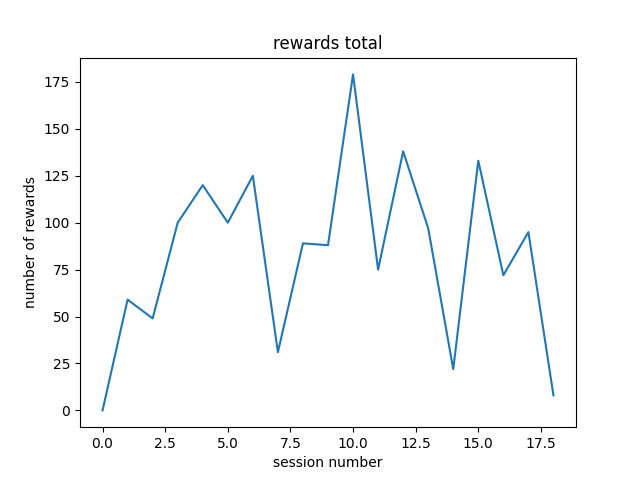

Text(0.5, 1.0, 'rewards total')

In [81]:
plt.figure()
plt.plot(trials_numSuccess__111)
plt.xlabel('session number')
plt.ylabel('number of rewards');
plt.title('rewards total')

Plot duration of successful trials over sessions as a histogram

In [82]:
trials_duration_time__success_111 = [trials_duration_nowTime[sn][trials_success[sn] * trials_type_111[sn]] * 24*60*60 for sn in range(len(trials_duration_nowTime))]

edges = np.linspace(0,20, num=41, endpoint=True)
trials_durationHist_time__success_111 = np.array([np.histogram(t, bins=edges)[0] for t in trials_duration_time__success_111]).T

<IPython.core.display.Javascript object>


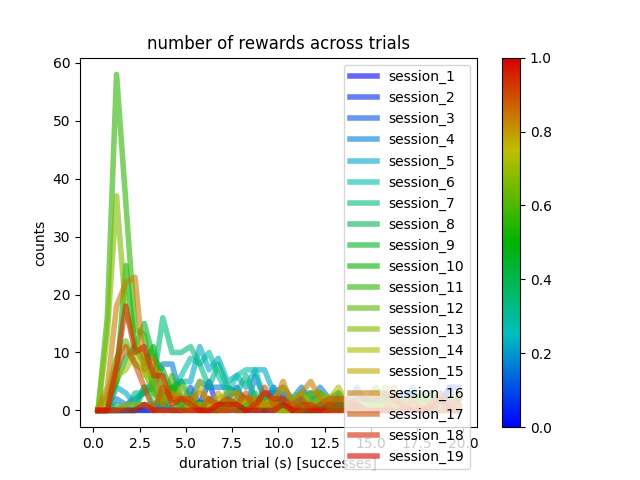

In [83]:
%matplotlib notebook

cmap = bnpm.plotting_helpers.simple_cmap(colors=[[0.0, 0.0, 1.0], [0.0, 0.75, 0.75], [0.0, 0.7, 0.0], [0.75, 0.75, 0], [0.85, 0.0, 0.0]])

plt.figure()
for ii,trace in enumerate(trials_durationHist_time__success_111.T):
    plt.plot(
        (edges[1:] +edges[:-1])/2, 
        trace, 
        color=cmap(ii/(n_sessions-1)), 
        linewidth=4,
        alpha=0.6,
    )
    
# [plt.stairs(t[0], t[1], color=colors[ii], linewidth=4) for ii,t in enumerate(trials_durationHist_time__success_111)];
plt.xlabel('duration trial (s) [successes]')
plt.ylabel('counts')
plt.title('number of rewards across trials')
plt.legend([f'session_{ii}' for ii in np.arange(n_sessions)+1])
ax = plt.gca()
plt.colorbar(mpl.cm.ScalarMappable(cmap=cmap), ax=ax);

<IPython.core.display.Javascript object>


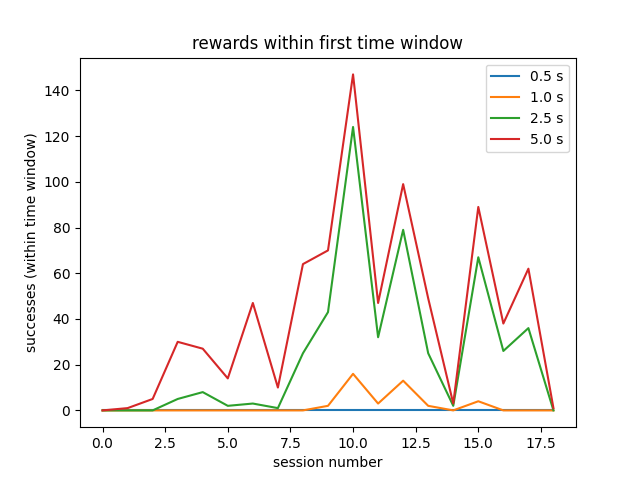

In [84]:
ts = [1,2,5,10]
plt.figure()
[plt.plot(trials_durationHist_time__success_111[:t,:].sum(0)) for t in ts]
plt.xlabel('session number')
plt.ylabel('successes (within time window)')
plt.title('rewards within first time window')
plt.legend([f'{t*0.5} s' for t in ts])

### NOTE:

In earlier experiments use `CE_ITI_successful` and in later experiments use `CE_ITI_withZ`

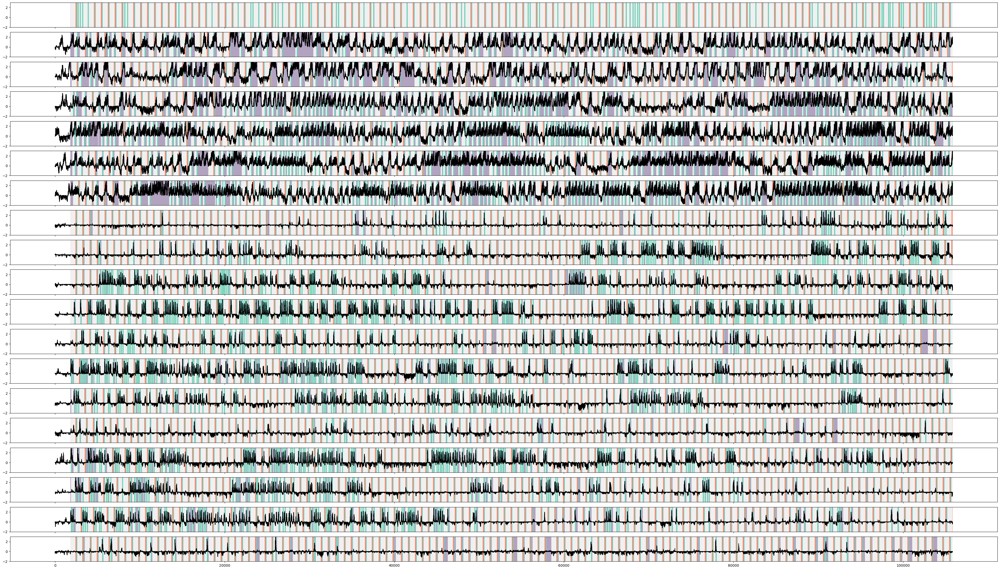

In [85]:
%matplotlib inline

fig, axs = plt.subplots(n_sessions, 1, sharex=True, figsize=(50, n_sessions*1.5))

for i_sesh,date in enumerate(expParams_objs.keys()):

    names_states = expParams_objs[date]['loggerNames']['timeSeries']

    names_toPlot = [
        'CE_trial',
        'CE_rewardToneHold',
        'CE_rewardDelivery',
        'CE_ITI_withZ',
        'CE_waitForBaseline',
        'CE_timeout'
    ]
    idx_toPlot = np.isin(names_states, names_toPlot)

    n_samples = logger_objs[date]['timeSeries'].shape[0]

    colors = {
        'CE_trial': (0.9, 0.9, 0.9),
        'CE_rewardToneHold': (0.0, 0.7, 0.0),
        'CE_rewardDelivery': (0.0, 0.7, 0.2),
        'CE_ITI_withZ': (0.0, 0.7, 0.6),
        'CE_waitForBaseline': (0.5, 0.4, 0.6),
        'CE_timeout': (1.0, 0.2, 0.0),
    }

    assert all([n_c == n_tp for n_c, n_tp in zip(list(colors.keys()), names_toPlot)])

    for name in names_toPlot:
        axs[i_sesh].fill_between(
            x=np.arange(n_samples),
            y1=logger_objs[date]['timeSeries'][:, np.isin(names_states, name)][:,0] * 10 - 5,
            y2=-5,
            alpha=0.6,
            color=colors[name],
            linewidth=0
        )
    axs[i_sesh].plot(logger_objs[date]['decoder'][:, np.array(expParams_objs[date]['loggerNames']['decoder']) == 'cursor_brain'], 'k')
    axs[i_sesh].set_ylim(-2,3)

## Analyze alignment

In [88]:
path_roicat = bnpm.path_helpers.find_paths(r'/media/rich/bigSSD/analysis_data/ROICaT/ROI_tracking/mouse_0322R/', reMatch='tracking')[0]
display(path_roicat)
roicat_out = bnpm.file_helpers.pickle_load(path_roicat)

'/media/rich/bigSSD/analysis_data/ROICaT/ROI_tracking/mouse_0322R/mouse_0322R.ROICaT.tracking.results.PARTIAL.pkl'

In [89]:
len(roicat_out['UCIDs_bySession'])

18

In [90]:
dir_save_data

'/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R'

In [241]:
path_iscell = str(Path(dir_save_data).resolve() / 'iscell_NN_tqm_factor_1.pkl')
# path_iscell = bnpm.path_helpers.find_paths(dir_save_data, reMatch='weights_day0')[0]
tqm = bnpm.file_helpers.pickle_load(path_iscell)
iscell = tqm['iscell_classifier_matching_tqm'][-1]
# iscell = np.load(path_iscell, allow_pickle=True)[()]['iscell_custom']

## import spike_prob

In [122]:
[len(l) for l in roicat_out['UCIDs_bySession']]

[2413,
 2431,
 2576,
 2464,
 2297,
 2314,
 2603,
 2785,
 2659,
 2774,
 2382,
 2380,
 2406,
 2538,
 2237,
 2464,
 2241,
 2455]

In [123]:
iscell.shape

(2464,)

In [124]:
roicat_out['input_data']

{'paths_stat': ['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230419/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230420/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230424/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230425/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230426/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230427/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230428/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230429/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230430/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230501/stat.npy',
  '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230502/stat.npy',
  '/media/rich/bigSSD/downloa

In [128]:
ucids_decoderVector = roicat_out['UCIDs_bySession'][3][iscell]

In [129]:
# ucids_decoderVector = roicat_out['UCIDs_bySession'][0]

In [130]:
len(roicat_out['UCIDs_bySession'])

18

In [132]:
ucids_byDate = {re.search('\d{8}', roicat_out['input_data']['paths_stat'][ii]).group(): roicat_out['UCIDs_bySession'][ii] for ii in range(len(roicat_out['UCIDs_bySession']))}

In [134]:
## find indices in each session that match with UCID in the ucids_decoderVector array
### the (val>=0) bit is to make sure the -1 values are excluded

idx_matching_decoderVector_raw = {date: [np.where((ucids_byDate[date] == val) * (val>=0))[0] for val in ucids_decoderVector] for date in tqdm(ucids_byDate.keys())};

100%|██████████████████████████████████████████| 18/18 [00:00<00:00, 534.35it/s]


In [135]:
## turn into list of arrays
idx_matching_decoderVector = {date: np.array([val[0] if len(val)==1 else -1 for val in arr], dtype=np.int64) for date, arr in idx_matching_decoderVector_raw.items()}

In [371]:
## check to make sure there aren't any duplicates
assert all([all([len(idx)<=1 for idx in idx_raw]) for idx_raw in idx_matching_decoderVector_raw])

In [137]:
rois_matched = [rois[idx] for rois,idx in zip(roicat_out['ROIs']['ROIs_aligned'], idx_matching_decoderVector.values())]

In [138]:
import bnpm.ca2p_preprocessing

In [139]:
import torch

In [140]:
dFoF = {date: bnpm.ca2p_preprocessing.make_dFoF(
    F=F,
    Fneu=Fneu,
    neuropil_fraction=0.7,
    percentile_baseline=30,
    channelOffset_correction=0,
    rolling_percentile_window=30*60*10,
    multicore_pref=True,
    verbose=True,
)[0] for (date,F),(date,Fneu) in zip(F_objs.items(), Fneu_objs.items())}

100%|███████████████████████████████████████████| 36/36 [00:17<00:00,  2.02it/s]


Calculated dFoF. Total elapsed time: 21.58 seconds


100%|███████████████████████████████████████████| 36/36 [00:18<00:00,  1.96it/s]


Calculated dFoF. Total elapsed time: 22.34 seconds


100%|███████████████████████████████████████████| 36/36 [00:18<00:00,  1.93it/s]


Calculated dFoF. Total elapsed time: 22.93 seconds


100%|███████████████████████████████████████████| 36/36 [00:19<00:00,  1.87it/s]


Calculated dFoF. Total elapsed time: 24.02 seconds


100%|███████████████████████████████████████████| 36/36 [00:20<00:00,  1.72it/s]


Calculated dFoF. Total elapsed time: 26.27 seconds


100%|███████████████████████████████████████████| 36/36 [00:19<00:00,  1.83it/s]


Calculated dFoF. Total elapsed time: 25.16 seconds


100%|███████████████████████████████████████████| 36/36 [00:20<00:00,  1.76it/s]


Calculated dFoF. Total elapsed time: 26.43 seconds


100%|███████████████████████████████████████████| 36/36 [00:18<00:00,  1.95it/s]


Calculated dFoF. Total elapsed time: 24.44 seconds


100%|███████████████████████████████████████████| 36/36 [00:18<00:00,  1.95it/s]


Calculated dFoF. Total elapsed time: 24.75 seconds


100%|███████████████████████████████████████████| 36/36 [00:19<00:00,  1.86it/s]


Calculated dFoF. Total elapsed time: 26.13 seconds


100%|███████████████████████████████████████████| 36/36 [00:17<00:00,  2.09it/s]


Calculated dFoF. Total elapsed time: 24.01 seconds


100%|███████████████████████████████████████████| 36/36 [00:19<00:00,  1.83it/s]


Calculated dFoF. Total elapsed time: 26.94 seconds


100%|███████████████████████████████████████████| 36/36 [00:18<00:00,  1.99it/s]


Calculated dFoF. Total elapsed time: 25.41 seconds


100%|███████████████████████████████████████████| 36/36 [00:19<00:00,  1.83it/s]


Calculated dFoF. Total elapsed time: 27.5 seconds


In [480]:
keys_toUse = set(dFoF.keys()).intersection(set(ucids_byDate.keys()))
dFoF_matched = roicat.util.match_arrays_with_ucids([dFoF[key] for key in keys_toUse], [ucids_byDate[key] for key in keys_toUse], squeeze=False)
dFoF_matched = {key: d for key, d in zip(keys_toUse, dFoF_matched)}

In [482]:
[dFoF_matched[key].shape for key in dFoF_matched.keys()]

[(4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000),
 (4956, 108000)]

In [483]:
factor_weights_matched = roicat.util.match_arrays_with_ucids(
    arrays=factor_weights,
    ucids=[ucids_byDate['20230425']]
)[0]

In [496]:
n_rows = dFoF_matched[list(dFoF_matched.keys())[0]].shape[0]
factor_weights_matched = np.concatenate((factor_weights_matched, np.ones((n_rows - factor_weights_matched.shape[0], factor_weights_matched.shape[1]), dtype=factor_weights_matched.dtype)), axis=0)

In [497]:
factor_weights_matched.shape

(4956, 5)

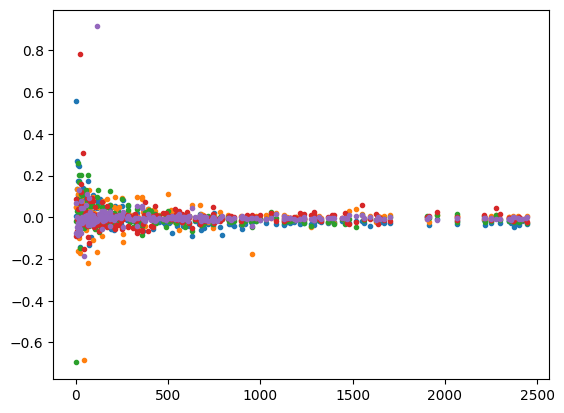

In [498]:
plt.figure()
plt.plot(factor_weights, '.');

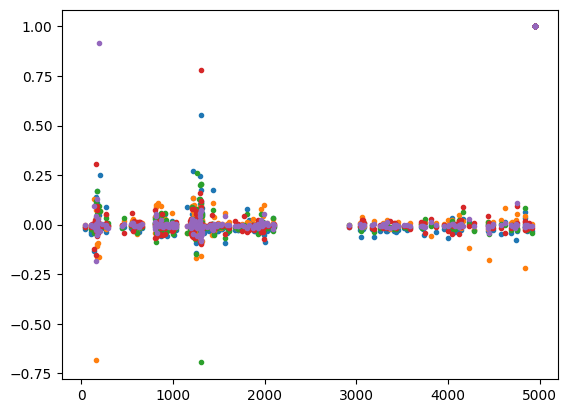

In [499]:
plt.figure()
plt.plot(factor_weights_matched, '.');

In [500]:
factor_weights_matched.shape

(4956, 5)

In [501]:
test = factor_weights_matched[:,0]

In [502]:
dFoF_matched['20230425'].shape

(4956, 108000)

In [503]:
(factor_weights_matched[:,0][None,:] @ dFoF_matched['20230425']).shape

(1, 108000)

In [504]:
 dFoF_matched['20230425'].shape

(4956, 108000)

In [505]:
factor_weights_matched[:,0].shape

(4956,)

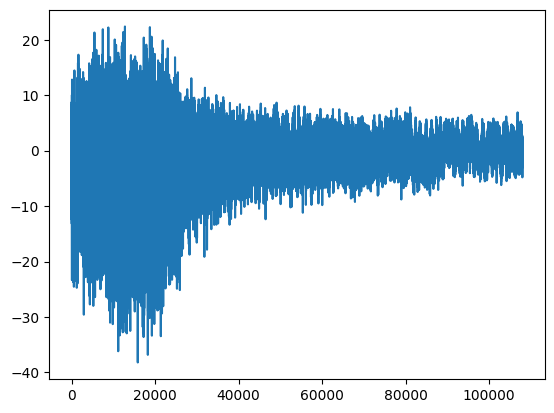

In [517]:
plt.figure()
plt.plot(np.nansum(dFoF_matched['20230504'] * factor_weights_matched[:,0][:,None], axis=0))

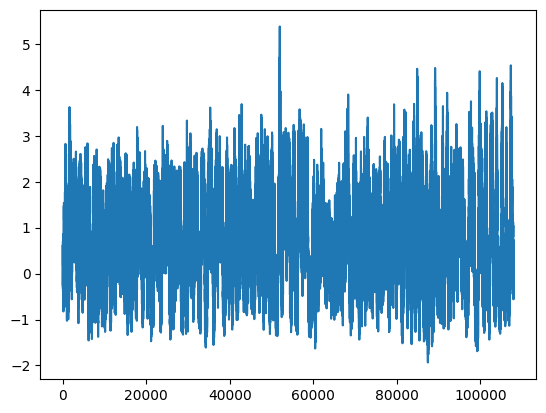

In [515]:
plt.figure()
plt.plot(np.nansum(dFoF_matched['20230506'] * factor_weights_matched[:,0][:,None], axis=0))

In [404]:
logger_dfs['20230425']

{'decoder':         cursor_brain  cursor_brain_raw  cursor_output  freqToOutput  \
 0                NaN               NaN            NaN           NaN   
 1                NaN               NaN            NaN           NaN   
 2                NaN               NaN            NaN           NaN   
 3                NaN               NaN            NaN           NaN   
 4                NaN               NaN            NaN           NaN   
 ...              ...               ...            ...           ...   
 107995           NaN               NaN            NaN           NaN   
 107996           NaN               NaN            NaN           NaN   
 107997           NaN               NaN            NaN           NaN   
 107998           NaN               NaN            NaN           NaN   
 107999           NaN               NaN            NaN           NaN   
 
         voltage_cursorCurrentPos  decoder_angles  avgVec_angle  
 0                            NaN             NaN        

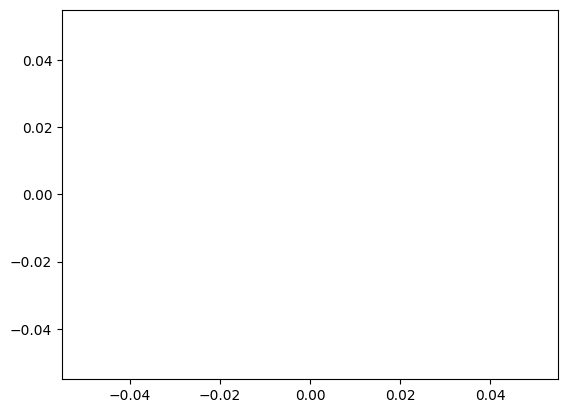

In [397]:
plt.figure()
plt.plot((factor_weights_matched[:,0][None,:] @ dFoF_matched['20230425'])[0])

In [154]:
logger_dfs['20230426']['trials'].keys()

Index(['trialNum_trialStart', 'time_now_trialStart', 'frameNum_trialStart',
       'trialType_cursorOn', 'trialType_feedbackLinked', 'trialType_rewardOn',
       'blockNum', 'factor_to_use', 'trialNum_trialEnd', 'time_now_trialEnd',
       'frameNum_trialEnd', 'success_outcome'],
      dtype='object')

In [156]:
def get_frames_111_success(logger):
    frames_trialEnds   = logger['trials']['frameNum_trialEnd'].to_numpy()
    frames_trialStarts = logger['trials']['frameNum_trialStart'].to_numpy()
    
#     frames_trialEnds = np.where(np.diff(logger['timeSeries']['CE_trial'].to_numpy(), append=0) < -0.5)[0]

    type_111_success = (logger['trials']['trialType_cursorOn'] * logger['trials']['trialType_feedbackLinked'] * logger['trials']['trialType_rewardOn'] * logger['trials']['success_outcome']).to_numpy()
    framesEnd_111_success = frames_trialEnds[type_111_success[:len(frames_trialEnds)].astype(bool)]
    framesStart_111_success = frames_trialStarts[type_111_success[:len(frames_trialStarts)].astype(bool)]
    
    out = {
        'trialNum': logger['trials']['trialNum_trialStart'],
        'frames_start': framesStart_111_success,
        'frames_end': framesEnd_111_success,
        'duration': logger['trials']['frameNum_trialEnd'] - logger['trials']['frameNum_trialStart'],
    }
    
    return out

trials_111_success = {date: get_frames_111_success(logger) for date, logger in logger_dfs.items()}

In [157]:
def cosine_similarity(v1, v2):
    
    v1 = v1[:,None] if v1.ndim==1 else v1
    v2 = v2[:,None] if v2.ndim==1 else v2
    
#     idx_notNaN = np.logical_not(np.isnan(v1.mean(1))) * np.logical_not(np.isnan(v2.mean(1)))
    idx_notNaN = np.logical_not(np.isnan(np.nanmean(v1, axis=1))) * np.logical_not(np.isnan(np.nanmean(v2, axis=1)))

    v1 = v1[idx_notNaN]
    v2 = v2[idx_notNaN]

    return (v1.T @ v2) / (np.linalg.norm(v1, axis=0) * np.linalg.norm(v2, axis=0))[:,None]

In [158]:
def projection_magnitude(v1, v2):
    '''
    magnitude of v1 projected onto v2
    '''
    v1 = v1[:,None] if v1.ndim==1 else v1
    v2 = v2[:,None] if v2.ndim==1 else v2
    
#     idx_notNaN = np.logical_not(np.isnan(v1.mean(1))) * np.logical_not(np.isnan(v2.mean(1)))
    idx_notNaN = np.logical_not(np.isnan(np.nanmean(v1, axis=1))) * np.logical_not(np.isnan(np.nanmean(v2, axis=1)))

    v1 = v1[idx_notNaN]
    v2 = v2[idx_notNaN]

    return (v1.T @ v2) / np.linalg.norm(v2, axis=0)

In [176]:
import xxhash

def get_unique_decoders(decoders):
    hashes_unique, idx, inv = np.unique([xxhash.xxh3_64_hexdigest(np.ascontiguousarray(d)) for d in decoders], return_index=True, return_inverse=True)
    idx_argsort = np.argsort(idx)
    decoders_unique_sorted = np.array(decoders)[idx][idx_argsort]
    return decoders_unique_sorted, idx, idx_argsort[inv]

In [180]:
# decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse)
decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['factor_space'] for d in dates_toUse[:-1]])
decoder_dates = {date: i for i,date in zip(inv, dates_toUse)}

/tmp/ipykernel_242730/2086938915.py:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  decoders_unique_sorted = np.array(decoders)[idx][idx_argsort]


In [181]:
decoder_session_divisions = np.concatenate([[np.where(np.array(list(decoder_dates.values())) == d)[0][0] for d in np.unique(list(decoder_dates.values()))], [len(decoder_dates)]])

Plots of projections

In [182]:
%matplotlib inline

In [187]:
decoder_dates

{'20230426': 0,
 '20230427': 0,
 '20230428': 0,
 '20230429': 0,
 '20230430': 0,
 '20230501': 0,
 '20230503': 1,
 '20230504': 1,
 '20230505': 1,
 '20230506': 1,
 '20230507': 1,
 '20230508': 1,
 '20230509': 1,
 '20230511': 1,
 '20230512': 1,
 '20230513': 1,
 '20230514': 1}

In [188]:
decoders[0]

array([[ 0.0600633 , -0.00548063,  0.26108635,  0.0384374 , -0.05624579],
       [-0.04002196, -0.05178326, -0.0311157 ,  0.047019  , -0.02020824],
       [ 0.00377662,  0.04879126, -0.01647696, -0.09211889, -0.07612338],
       ...,
       [-0.0580204 , -0.0332419 , -0.03401265, -0.00226237, -0.00523464],
       [-0.01375768,  0.00833678, -0.03461769, -0.01288989, -0.02015836],
       [-0.01697642, -0.0119998 , -0.01248188, -0.01051873, -0.00620885]])

In [198]:
expParams_objs['20230426']['baselineStuff']['factor_space'].shape

(238, 5)

In [204]:
test = expParams_objs['20230426']['baselineStuff']['factor_space']

In [201]:
expParams_objs['20230506']['baselineStuff']['factor_space'].shape

(597, 8)

In [199]:
iscell.sum()

308

In [202]:
len(iscell)

2464

In [203]:
import roicat

In [207]:
ucids_byDate['20230425'].shape

(2464,)

In [209]:
ucids_byDate['20230425'].max()

4946

In [208]:
test.shape

(238, 5)

In [205]:
roicat.util.match_arrays_with_ucids_inverse(test, ucids=ucids_byDate['20230425'])

IndexError: index 836 is out of bounds for axis 0 with size 238

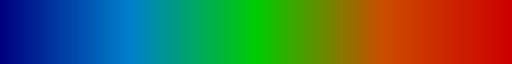

/tmp/ipykernel_242730/1082979607.py:7: RuntimeWarning: Mean of empty slice
  idx_notNaN = np.logical_not(np.isnan(np.nanmean(v1, axis=1))) * np.logical_not(np.isnan(np.nanmean(v2, axis=1)))


ValueError: operands could not be broadcast together with shapes (308,) (597,) 

In [200]:
dir_save_results = r'/home/rich/Desktop/analysis_vectorSimilarity/'

# mouse = 'mouse_g1'

vecs_decoder = {
#     'decoder_1': decoders[0][:,0],
    'decoder_2': decoders[1][:,1],
#     'decoder_3': expParams_objs[dates_toUse[-1]]['baselineStuff']['ROIs']['cellWeightings'],
#     'avgVector': np.ones(len(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings'])),
}

reductions = {
    'mean': np.nanmean,
#     'std': np.nanstd,
}

projectionTypes = {
    'cosSim': cosine_similarity,
    'projMag': projection_magnitude,
}

params = [
    vecs_decoder,
    reductions,
    projectionTypes
]

win_bounds = [-30*8, 30*8]
cmap = bnpm.plotting_helpers.simple_cmap([[0,0,0.5], [0,0.5,0.8], [0,0.8,0], [0.8,0.3,0], [0.8,0,0]])
display(cmap)
colors = cmap(np.linspace(0,0.999, len(dates_toUse)))

results_end, results_start = {}, {}
for vec_decoder, reduction, projectionType in itertools.product(*[d.items() for d in params]):
    et_traces_end_reduced  = []
    et_traces_start_reduced  = []
    for date in dates_toUse:
#         traces = sp_matched[date]
        traces = dFoF_matched[date]
#         traces = dFoF_F_matched[date]
#         traces = dFoF_Fneu_matched[date]*0.7
#         traces = loggerVals_rollZ[date].astype(np.float32)

        et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
            arr=projectionType[1](traces, vec_decoder[1]).squeeze(),  
#             arr=projectionType[1](traces, expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings']).squeeze(),
            dim=-1,
            idx_triggers=trials_111_success[date]['frames_end'],
            win_bounds=win_bounds,
            verbose=1,
        )
        et_traces_end_reduced.append(reduction[1](et_traces, axis=0))
    
        et_traces_end = et_traces.copy()
        et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
            arr=projectionType[1](traces, vec_decoder[1]).squeeze(),  
#             arr=projectionType[1](traces, expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings']).squeeze(),
            dim=-1,
            idx_triggers=trials_111_success[date]['frames_start'],
            win_bounds=win_bounds,
            verbose=1,
        )
        et_traces_start_reduced.append(reduction[1](et_traces, axis=0))

    et_traces_end_reduced = np.stack(et_traces_end_reduced, axis=1)
    et_traces_start_reduced = np.stack(et_traces_start_reduced, axis=1)
    
    fig = plt.figure(figsize=(20,5))
    plt.title(f'{vec_decoder[0]}, {reduction[0]}, {projectionType[0]}')
#     [plt.plot(xAxis/Fs, et_traces_reduced[:,ii] - np.nanmean(et_traces_reduced[:50,ii], axis=0), color=c) for ii,c in enumerate(colors)]
    [plt.plot(xAxis/Fs, et_traces_end_reduced[:,ii], color=c) for ii,c in enumerate(colors)]
    plt.plot([0,0], [0,0.25], 'k')
    
    name_results = f'etTraces_{vec_decoder[0]}_{reduction[0]}_{projectionType[0]}__{mouse}'
    print(f'name_results: {name_results}')
    
    results_end.update({name_results: et_traces_end_reduced})
    results_start.update({name_results: et_traces_start_reduced})

#     dict_save = {
#         'et_traces': et_traces_reduced.astype(np.float32).copy(),
#         'axes': {
#             'time (s)': xAxis / Fs,
#             'sessions': dates_toUse,
#         },
#         'date_made': str(datetime.datetime.date(datetime.datetime.now())),
#         'notes': '2D matrix of event triggered traces. Traces are spike probabilities (from CASCADE) projected onto the decoder axis, then the event triggered average is taken across events within a session. \
# The neurons were aligned across sessions using ROICaT, and subselected to only be those that were included in the online decoder. Neurons for which there was not ROICaT match were excluded from the calculation.',
#         'data_type': 'spike_probability, CASCADE',
#         'projection_type': projectionType[0],
#         'reduction': reduction[0],
#         'decoder_ID': vec_decoder[0],
#         'animal_ID': mouse,
#     }

#     path_save = str(Path(dir_save_results) / f'{name_results}.pkl')
#     bnpm.file_helpers.pickle_save(dict_save, path_save, mkdir=True, allow_overwrite=False)


#     fig_saver = bnpm.plotting_helpers.Figure_Saver(dir_save_results, overwrite=True)
#     fig_saver(fig, name_file=name_results)

<IPython.core.display.Javascript object>


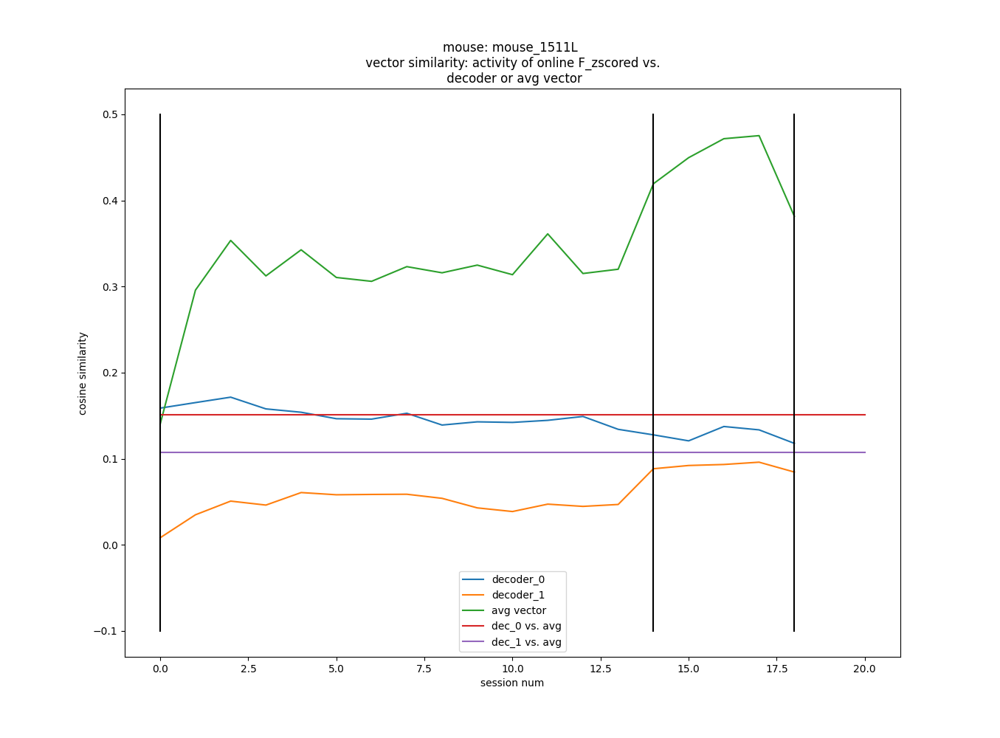

[[<matplotlib.lines.Line2D at 0x7f3e8bd03ee0>],

In [242]:
%matplotlib notebook

import sklearn
k = list(results.keys())

plt.figure()
# [plt.plot(np.nanmean(results[k[ii]][235:240,:], axis=0)) for ii in range(0,len(results),2)]
[plt.plot(np.nanmean(results_end[k[ii]][235:240,:], axis=0) - np.nanmean(results_start[k[ii]][235:240,:], axis=0)) for ii in range(0,len(results),2)]

dec_avg_cs = [sklearn.metrics.pairwise.cosine_similarity(decoders[ii][None,:], np.ones(len(decoders[ii]))[None,:]).squeeze() for ii in range(len(decoders))]
[plt.plot([0,n_sessions], [d, d]) for d in dec_avg_cs]

plt.xlabel('session num')
plt.ylabel('cosine similarity')
plt.title(f'mouse: {mouse} \n vector similarity: activity of online F_zscored vs. \n decoder or avg vector')
plt.legend(['decoder', 'avg vector', 'decoder vs. avg vec'])
plt.legend([f'decoder_{ii}' for ii in range(len(decoders))] + ['avg vector'] + [f'dec_{ii} vs. avg' for ii in range(len(decoders))])

[plt.plot([d,d], [-0.1, 0.5], 'k') for d in decoder_session_divisions]

Make dimensionality plot

In [175]:
import bnpm.torch_helpers

In [267]:
win_bounds = [-30*8, 30*8]

dims = []
for date in tqdm(dates_toUse):
    arr = sp_matched[date]
#     arr = loggerVals_rollZ[date]
#     arr = bnpm.torch_helpers.zscore(torch.as_tensor(arr), dim=1, nan_policy='omit').numpy()
    et_traces_end, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
#         arr=np.nan_to_num(loggerVals_rollZ[date]),
        idx_triggers=trials_111_success[date]['frames_end'],
        win_bounds=win_bounds,
        dim=-1,
    )
    et_traces_start, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
#         arr=np.nan_to_num(loggerVals_rollZ[date]),
        idx_triggers=trials_111_success[date]['frames_start'][~np.isnan(trials_111_success[date]['frames_end'])],
        win_bounds=win_bounds,
        dim=-1,
    )
#     et_traces = bnpm.timeSeries.convolve_along_axis(et_traces, bnpm.math_functions.gaussian(sig=10), axis=-1, multicore_pref=True)
#     et_traces = bnpm.timeSeries.convolve_torch(et_traces.transpose(2,0,1), bnpm.math_functions.gaussian(sig=10), padding='same').numpy().transpose(1,2,0)
    
#     plt.figure()
#     plt.imshow(np.nan_to_num(et_traces[:,:,230].T), aspect='auto', vmin=0, vmax=0.2)

#     dim = bnpm.decomposition.dimensionality_pca(np.nan_to_num(et_traces[:,:,165:225]).mean(2).T, ev=bnpm.math_functions.bounded_logspace(0.05, 0.99, 10), device='cpu')
#     rate_at_thresh = (et_traces[:,:,195:200]).mean(2)
    rate_at_thresh = np.nanmean(et_traces_end[:,:,235:240], axis=2) - np.nanmean(et_traces_start[:,:,235:240], axis=2)
    dim = bnpm.decomposition.dimensionality_pca(np.nan_to_num(rate_at_thresh).T, ev=bnpm.math_functions.bounded_logspace(0.03, 0.99, 20), device='cpu', zscore=False)
    dims.append(dim)

dims = np.stack(dims, axis=0)

  0%|                                                    | 0/19 [00:00<?, ?it/s]/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/tmp/ipykernel_216506/3951934555.py:30: RuntimeWarning: Mean of empty slice
  rate_at_thresh = np.nanmean(et_traces_end[:,:,235:240], axis=2) - np.nanmean(et_traces_start[:,:,235:240], axis=2)
100%|███████████████████████████████████████████| 19/19 [00:31<00:00,  1.64s/it]


In [268]:
bnpm.math_functions.bounded_logspace(0.03, 0.99, 20),

(array([0.03      , 0.03606144, 0.04334758, 0.05210587, 0.06263375,
        0.07528877, 0.09050071, 0.10878619, 0.13076621, 0.15718726,
        0.18894662, 0.22712289, 0.2730126 , 0.32817423, 0.39448116,
        0.47418526, 0.56999341, 0.6851594 , 0.82359444, 0.99      ]),)

<IPython.core.display.Javascript object>


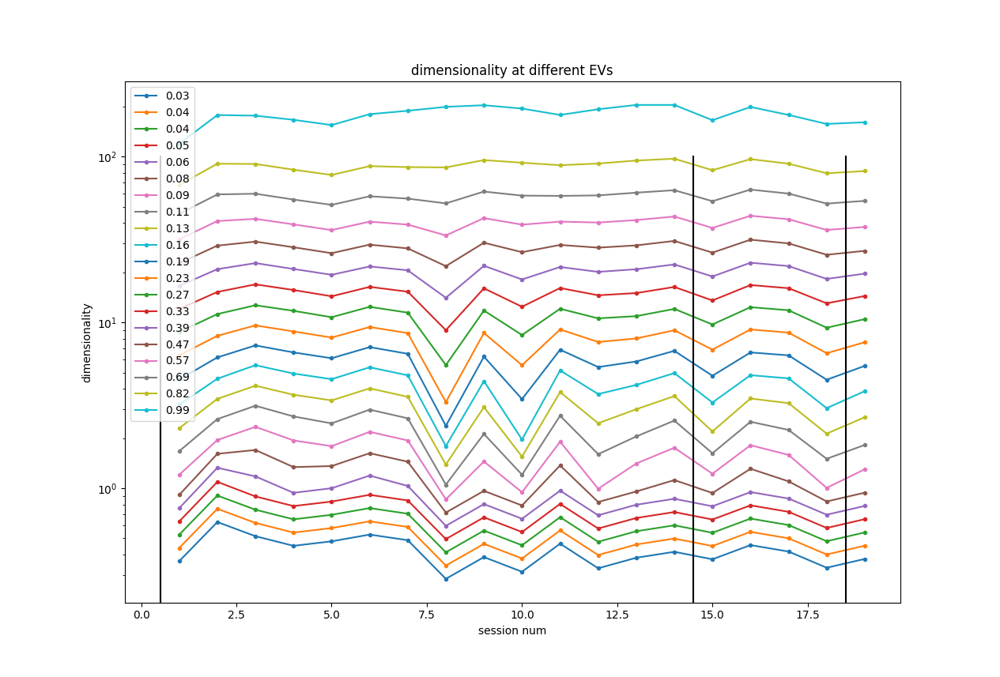

[[<matplotlib.lines.Line2D at 0x7f3e8c680220>],

In [269]:
plt.figure()
plt.plot(np.arange(dims.shape[0])+1, dims, '.-')
plt.yscale('log');
plt.xlabel('session num')
plt.ylabel('dimensionality')
plt.title('dimensionality at different EVs')

# [plt.plot([n+0.5,n+0.5], [0,dims.max()], 'k') for n in decoder_session_divisions];
plt.legend(np.round(bnpm.math_functions.bounded_logspace(0.03, 0.99, 20), decimals=2))
[plt.plot([d,d], [0, 100], 'k') for d in decoder_session_divisions+0.5]

<IPython.core.display.Javascript object>


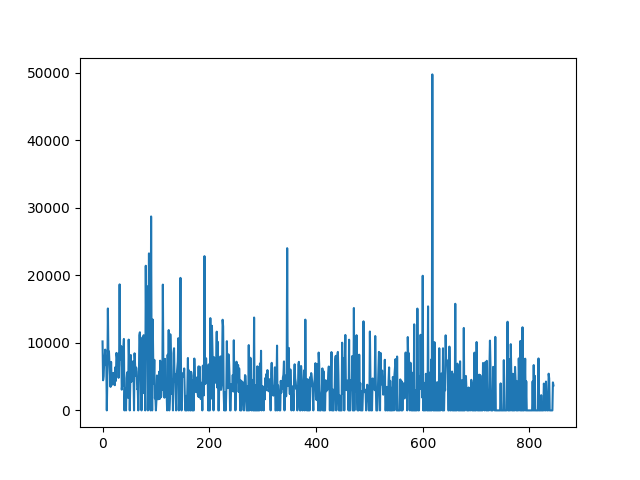

In [179]:
plt.figure()
plt.plot(np.nansum(sp_matched['20230113'], axis=1))

<IPython.core.display.Javascript object>


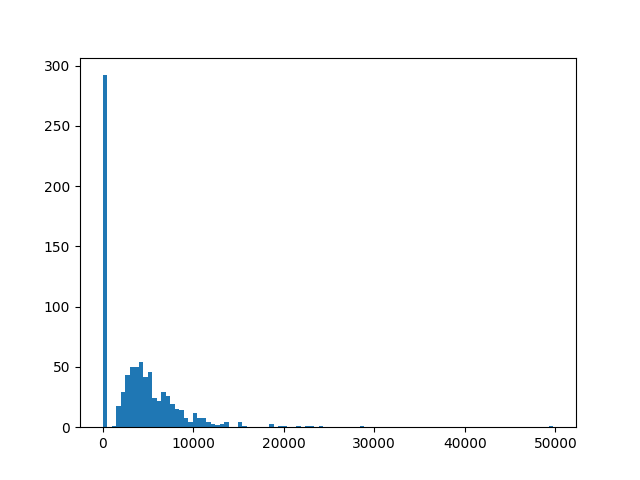

In [181]:
plt.figure()
plt.hist(np.nansum(sp_matched['20230113'], axis=1), 100);

<IPython.core.display.Javascript object>


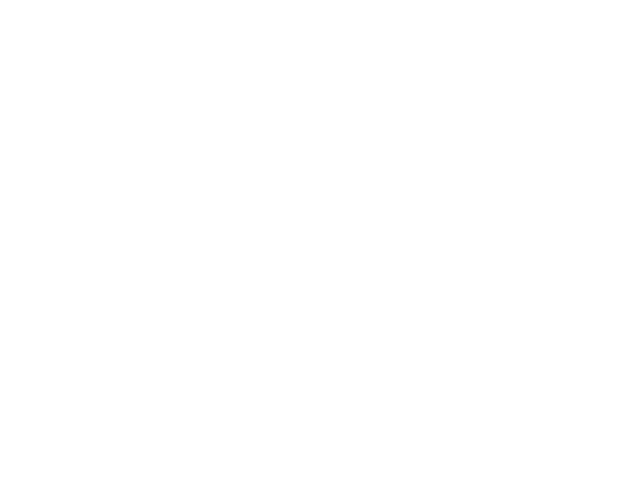

IndexError: index 1813 is out of bounds for axis 0 with size 846

In [182]:
plt.figure()
plt.plot(sp_matched['20230113'][1813])
plt.plot(dFoF_matched['20230113'][1813])

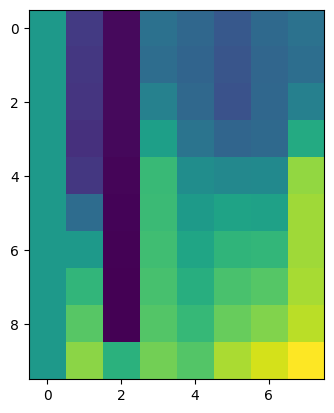

In [337]:
plt.figure()
plt.imshow((dims / dims[0][None,:]).T)

single neurons analysis

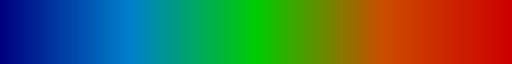

In [338]:
cmap = bnpm.plotting_helpers.simple_cmap([[0,0,0.5], [0,0.5,0.8], [0,0.8,0], [0.8,0.3,0], [0.8,0,0]])
display(cmap)
colors = cmap(np.linspace(0,0.999, len(dates_toUse)))

In [117]:
# win_bounds = [-30*4, 30*4]
idx_decoder_toUse = 0

idx = np.where([v==idx_decoder_toUse for v in decoder_dates.values()])[0]

preThresh_bounds = [110, 120]

et_traces_all, et_fanos, et_means, et_vars, et_dmeans, et_dvars = [], [], [], [], [], []
# plt.figure()
for ii,date in enumerate(dates_toUse):
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=sp_matched[date][np.argsort(decoders[idx_decoder_toUse])[::-1]],
#         arr=np.nan_to_num(loggerVals_rollZ[date][np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(F_matched[date][np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num((F_matched[date] - Fneu_matched[date]*0.7)[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(lva[date].T[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(loggerValsAligned_objs[date].T[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(loggerVals_rollZ[date][np.argsort(decoders[idx_decoder_toUse])[::-1]]),
#         arr=np.nan_to_num(lva_rollZ[date].T[np.argsort(decoders[idx_decoder_toUse])[::-1]]),
        idx_triggers=trials_111_success[date]['frames_end'],
        win_bounds=win_bounds,
#         trigger_signal_is_idx=True
    )
    
    et_traces_all.append(et_traces)

    et_mean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
    et_var  = np.nanvar( np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
    
    et_dmean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1) - np.nanmean(np.nanmean(et_traces[:,:,:50], axis=2), axis=1)
    et_dvar  = np.nanvar( np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1) - np.nanvar( np.nanmean(et_traces[:,:,:50], axis=2), axis=1)

    et_fano = np.abs(et_var / et_mean)
    
    et_fanos.append(et_fano)
    et_means.append(et_mean)
    et_vars.append(et_var)
    et_dmeans.append(et_dmean)
    et_dvars.append(et_dvar)

et_fanos = np.stack(et_fanos, axis=0)
et_means = np.stack(et_means, axis=0)
et_vars = np.stack(et_vars, axis=0)
et_dmeans = np.stack(et_dmeans, axis=0)
et_dvars = np.stack(et_dvars, axis=0)

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:329: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/tmp/ipykernel_3162970/2620790633.py:27: RuntimeWarning: Mean of empty slice
  et_mean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
/tmp/ipykernel_3162970/2620790633.py:28: RuntimeWarning: Degrees of freedom <= 0 for slice.
  et_var  = np.nanvar( np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1)
/tmp/ipykernel_3162970/2620790633.py:30: RuntimeWarning: Mean of empty slice
  et_dmean = np.nanmean(np.nanmean(et_traces[:,:,preThresh_bounds[0]:preThresh_bounds[1]], axis=2), axis=1) - np.nanmean(np.nanmean(et_traces[:,:,:50], axis=2), axis=1)
/tmp/ipykernel_3162970/2620790633.py:31: RuntimeWarning: Degrees of freedom <= 0 f

<IPython.core.display.Javascript object>


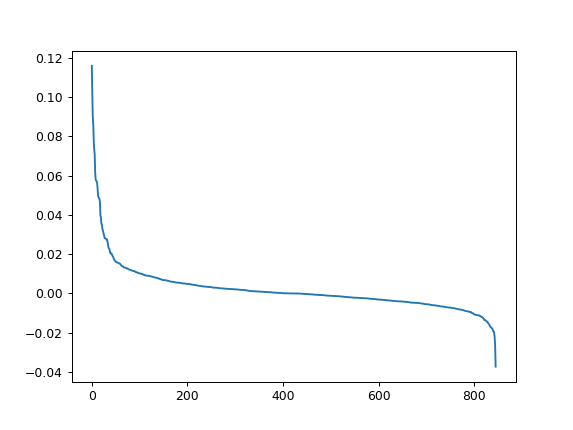

In [118]:
plt.figure()
plt.plot(decoders[idx_decoder_toUse][np.argsort(decoders[idx_decoder_toUse])[::-1]])

<IPython.core.display.Javascript object>


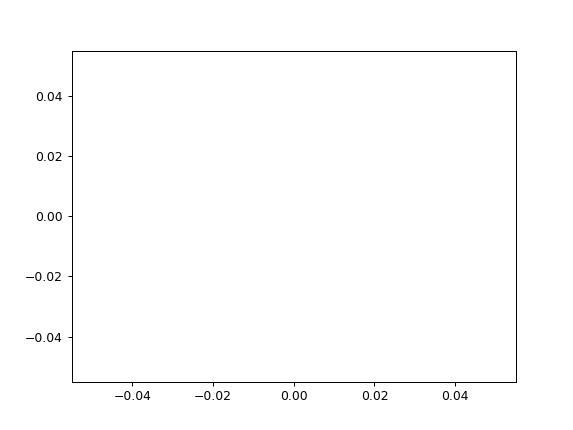

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/plotting_helpers.py:184: RuntimeWarning: Mean of empty slice
  y_center = reduction_center(data, axis=1)
/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


<AxesSubplot:>

In [119]:
val = et_dmeans.copy()

%matplotlib notebook
plt.figure()
bnpm.plotting_helpers.shaded_error_bar(val[idx,:30])
# bnpm.plotting_helpers.shaded_error_bar(val[idx,:100])
# bnpm.plotting_helpers.shaded_error_bar(val[idx,100:-100])
# bnpm.plotting_helpers.shaded_error_bar(val[idx,-5:])
# plt.ylim([0,1])

In [72]:
import bnpm.similarity

In [73]:
# lva = {date: bnpm.similarity.pairwise_orthogonalization(np.nan_to_num(np.array(loggerValsAligned_objs[date], dtype=np.float32)), np.nan_to_num(F_matched[date].T))[0] for date in dates_toUse}

In [ ]:
# wlen = Fs * 60 * 15

# lva_rollZ = {date: zscore_rolling(l, wlen=wlen, X_denom=loggerValsAligned_objs[date]) for date,l in tqdm(lva.items())}

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/plotting_helpers.py:184: RuntimeWarning: Mean of empty slice
  y_center = reduction_center(data, axis=1)
/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


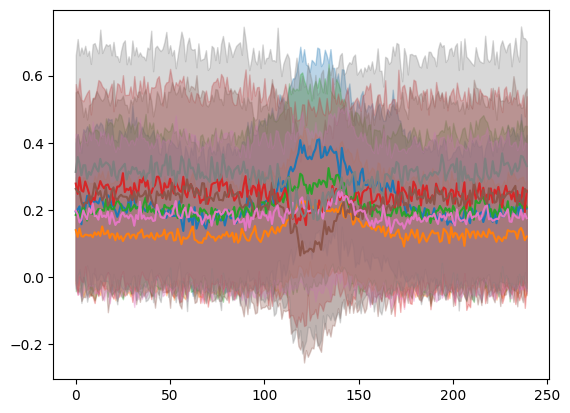

In [351]:
idx_decoder_toUse = 0

plt.figure()
for date in dates_toUse:
    arr = dFoF_matched[date][np.argsort(decoders[idx_decoder_toUse])[::-1]][10]
#     arr = sp_matched[date][30]
    # date = '20221021'
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
#         arr=sp_matched[date].T @ expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings'],
#         arr=sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True),
        arr=arr,
    #     arr=loggerAligned_dfs[date]['decoder']['cursor_brain_raw'].to_numpy(),
    #     arr=sp_matched[date].mean(0),
        trigger_signal=trials_111_success[date]['frames_end'],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        trigger_signal_is_idx=True,
#         show_plot=True
    )

#     out_mean = et_traces.mean(1)
#     out_mean = out_mean[np.logical_not(np.isnan(out_mean.mean(1)))]
    
#     plt.figure()
# #     plt.imshow(np.nan_to_num(et_traces).mean(1), clim=[-0.02,0.06], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
#     plt.imshow(out_mean, clim=[-0.02,0.15], aspect='auto', extent=(xAxis[0], xAxis[-1], out_mean.shape[0], 0))
#     plt.plot([0,0], [0, out_mean.shape[0]], 'r')
# #     break
    bnpm.plotting_helpers.shaded_error_bar(et_traces.T)

In [296]:
et_traces.shape

(846, 128, 240)

<IPython.core.display.Javascript object>


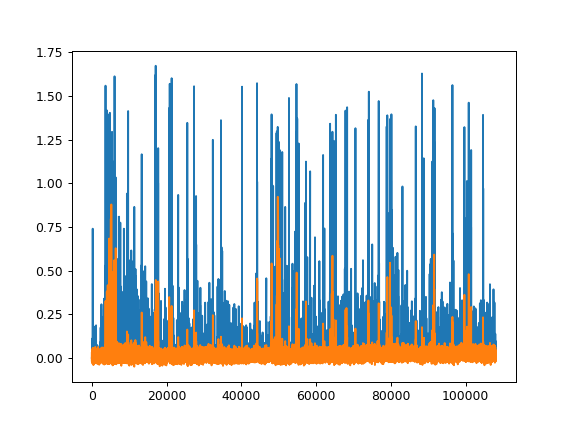

In [310]:
plt.figure()
plt.plot(sp_matched['20230119'][123])
plt.plot(dFoF_matched['20230119'][123]/10)

In [302]:
%matplotlib notebook
actVecs = {}
trajs = {}
# for date in dates_toUse:
for date in tqdm(dates_toUse[:]):
#     arr = loggerVals_rollZ[date]
    arr = sp_matched[date]
#     arr = sp_raw[date]
#     arr = F_matched[date]
#     arr = dFoF_matched[date]
#     arr = arr[np.argsort(decoders[idx_decoder_toUse])[::-1]]
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
        idx_triggers=trials_111_success[date]['frames_end'],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        dim=-1,
#         trigger_signal_is_idx=True,
#         show_plot=True
    )
    et_traces[np.abs(et_traces) > 5] = np.nan
    et_traces = np.nan_to_num(et_traces)
    et_traces_end = et_traces.copy()
    
    et_traces, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
        idx_triggers=trials_111_success[date]['frames_start'][~np.isnan(trials_111_success[date]['frames_end'])],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        dim=-1,
#         trigger_signal_is_idx=True,
#         show_plot=True
    )
    et_traces[np.abs(et_traces) > 5] = np.nan
    et_traces = np.nan_to_num(et_traces)
    et_traces_start = et_traces.copy()
    
    out_traj = et_traces[:,:,:120] - et_traces[:,:,:50].mean(2, keepdims=True)
    trajs.update({date: out_traj})

#     out_mean = np.nanmean(et_traces, axis=1)
#     out_mean = np.nanmean(et_traces[:,:,105:120], axis=2) - np.nanmean(et_traces[:,:,:50], axis=2)
    out_mean = np.nanmean(et_traces_end[:,:,115:120], axis=2) - np.nanmean(et_traces_start[:,:,115:120], axis=2)
#     out_mean = out_mean[np.logical_not(np.isnan(out_mean.mean(1)))]
    out_mean = np.nan_to_num(out_mean)
    
#     out_mean = out_mean[np.argsort(decoders[idx_decoder_toUse])[::-1]]
    
    actVecs.update({date: out_mean})
    
#     plt.figure()
# #     plt.imshow(np.nan_to_num(et_traces).mean(1), clim=[-0.02,0.06], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
#     plt.imshow(
#         out_mean.T, 
#         clim=[-0.02,2.15],
#         aspect='auto', 
# #         extent=(xAxis[0], xAxis[-1], out_mean.shape[0], 0)
#     )
# #     plt.plot([0,0], [0, out_mean.shape[0]], 'r')
# #     break

100%|███████████████████████████████████████████| 19/19 [00:23<00:00,  1.26s/it]


In [303]:
date

'20230130'

In [304]:
import scipy.stats

<IPython.core.display.Javascript object>


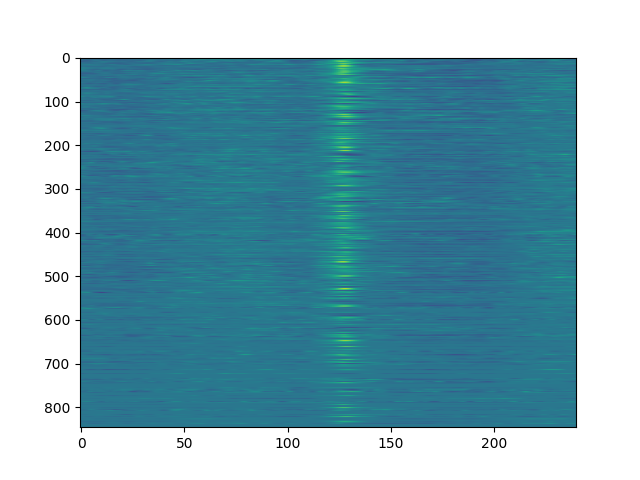

In [305]:
plt.figure()
plt.imshow(np.nan_to_num(scipy.stats.zscore(np.nanmean(et_traces, axis=1), axis=1, nan_policy='omit')), aspect='auto')

In [312]:
et_traces.shape

(846, 179, 240)

In [307]:
actVecs_cat = np.concatenate([v for v in actVecs.values()], axis=1) 
actVecs_cc = np.corrcoef(actVecs_cat.T)

In [308]:
traj_cat = np.concatenate([v for v in trajs.values()], axis=1) 

In [309]:
traj_cat.shape

(846, 3873, 120)

In [310]:
actVecs_cc_rolling = np.stack([np.pad(np.diag(actVecs_cc, k=ii), pad_width=(ii,0), mode='constant', constant_values=np.nan) for ii in range(1,300)], axis=1)

In [311]:
trial_num_cumsum = np.concatenate(([0], np.cumsum([l.shape[1] for l in actVecs.values()])[:]))

<IPython.core.display.Javascript object>


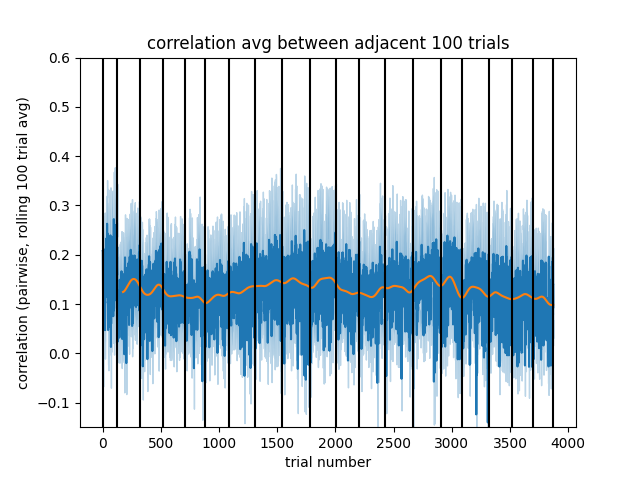

/tmp/ipykernel_216506/17491170.py:3: RuntimeWarning: Mean of empty slice
  plt.plot(bnpm.timeSeries.simple_smooth(np.nanmean(actVecs_cc_rolling, axis=1), sig=50))


(-0.15, 0.6)

In [313]:
plt.figure()
bnpm.plotting_helpers.shaded_error_bar(actVecs_cc_rolling)
plt.plot(bnpm.timeSeries.simple_smooth(np.nanmean(actVecs_cc_rolling, axis=1), sig=50))

[plt.plot([n,n], [-0.15, 0.6], 'k') for n in trial_num_cumsum]

plt.xlabel('trial number')
plt.ylabel('correlation (pairwise, rolling 100 trial avg)')
plt.title('correlation avg between adjacent 100 trials')
plt.ylim([-0.15, 0.6])

In [314]:
actVecs_cc_seshMean = np.array([np.triu(actVecs_cc[idx1:idx2]).mean() for idx1,idx2 in zip(trial_num_cumsum[:-1], trial_num_cumsum[1:])])
actVecs_cc_seshStd = np.array([np.triu(actVecs_cc[idx1:idx2]).std() for idx1,idx2 in zip(trial_num_cumsum[:-1], trial_num_cumsum[1:])])
actVecs_cc_seshSem = actVecs_cc_seshStd / np.sqrt(trial_num_cumsum[1:])

<IPython.core.display.Javascript object>


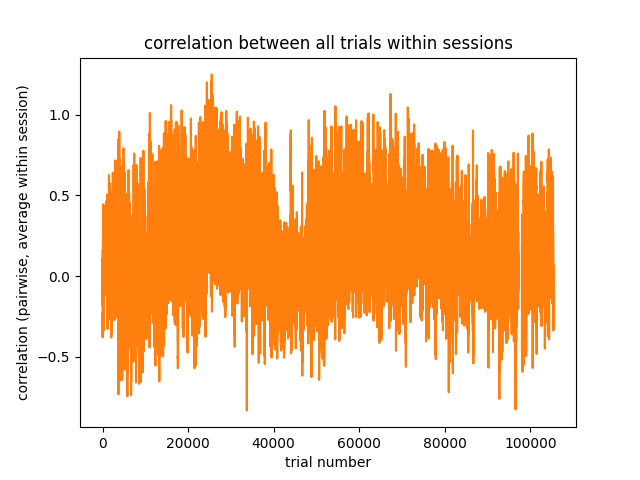

[[<matplotlib.lines.Line2D at 0x7f3e8acf10a0>],

In [322]:
plt.figure()
plt.plot(np.arange(len(actVecs_cc_seshMean)), actVecs_cc_seshMean)
plt.fill_between(np.arange(len(actVecs_cc_seshMean)), actVecs_cc_seshMean - actVecs_cc_seshStd, actVecs_cc_seshMean + actVecs_cc_seshStd, alpha=0.3)

plt.xlabel('trial number')
plt.ylabel('correlation (pairwise, average within session)')
plt.title('correlation between all trials within sessions')

[plt.plot([d,d], [0.05, 0.15], 'k') for d in decoder_session_divisions]

<IPython.core.display.Javascript object>


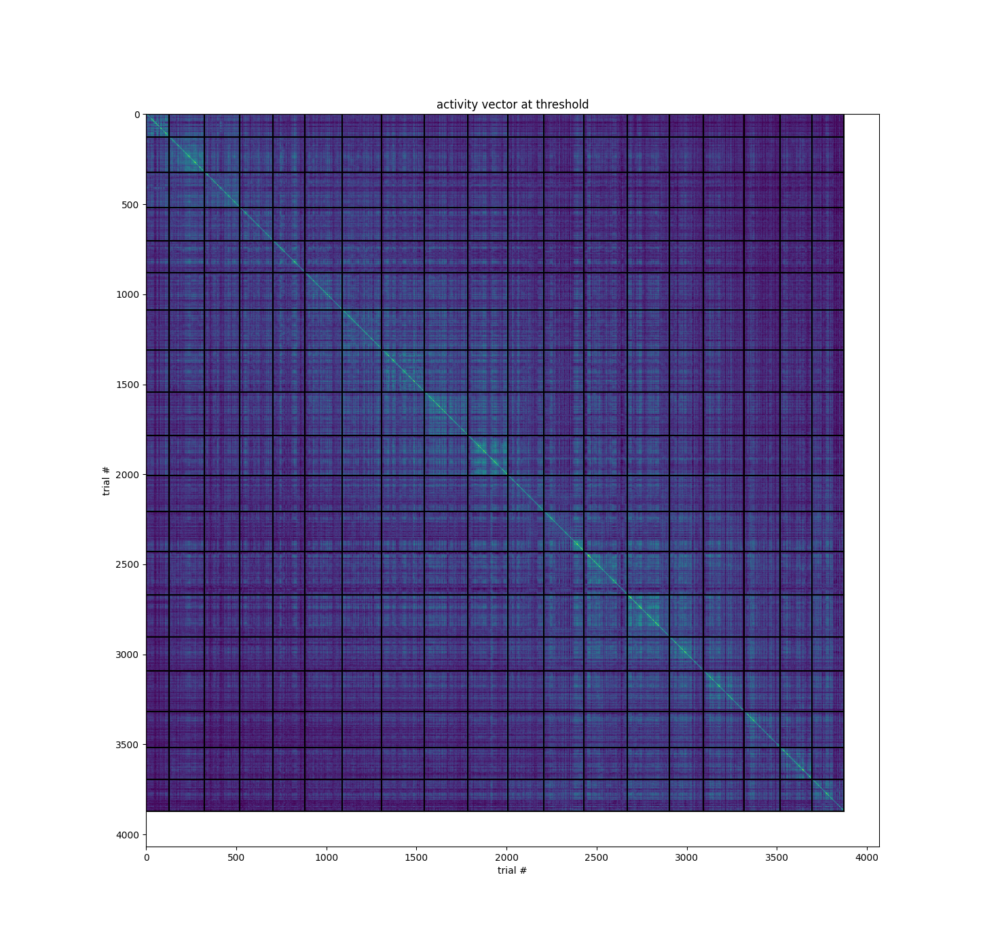

In [316]:
plt.figure()
plt.imshow(actVecs_cc, clim=[-0.0, 0.6])
plt.xlabel('trial #')
plt.ylabel('trial #')
plt.title('activity vector at threshold')
[plt.plot([n,n],[0,trial_num_cumsum[-1]], 'k') for n in trial_num_cumsum]
[plt.plot([0,trial_num_cumsum[-1]], [n,n], 'k') for n in trial_num_cumsum];

In [249]:
import tensorly as tl

In [250]:
tl.set_backend('pytorch')

In [366]:
tca = tl.decomposition.CP_NN_HALS(
    rank=4,
    n_iter_max=100,
    init='svd',
    svd='truncated_svd',
    tol=1e-08,
    sparsity_coefficients=None,
    fixed_modes=None,
    nn_modes='all',
    exact=False,
    verbose=True,
    normalize_factors=True,
    cvg_criterion='abs_rec_error',
    random_state=None,
)

# comps = tca.fit_transform(torch.as_tensor(np.nan_to_num(traj_cat[:,:,:120]), dtype=torch.float32, device='cuda:0'))
comps = tca.fit_transform(torch.as_tensor(np.nan_to_num(actVecs_cat), dtype=torch.float32, device='cuda:0'))

/media/rich/OS/Users/Richard/Linux_stuff_on_OS/conda_envs/envs/ROICaT/lib/python3.9/site-packages/tensorly/backend/pytorch_backend.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(


reconstruction error=0.8988085985183716
iteration 1, reconstruction error: 0.8968163132667542, decrease = 0.0019922852516174316
iteration 2, reconstruction error: 0.8961344361305237, decrease = 0.0006818771362304688
iteration 3, reconstruction error: 0.8958242535591125, decrease = 0.0003101825714111328
iteration 4, reconstruction error: 0.8956522941589355, decrease = 0.00017195940017700195
iteration 5, reconstruction error: 0.8955457210540771, decrease = 0.00010657310485839844
iteration 6, reconstruction error: 0.8954741358757019, decrease = 7.158517837524414e-05
iteration 7, reconstruction error: 0.8954242467880249, decrease = 4.988908767700195e-05
iteration 8, reconstruction error: 0.8953887224197388, decrease = 3.552436828613281e-05
iteration 9, reconstruction error: 0.8953630328178406, decrease = 2.568960189819336e-05
iteration 10, reconstruction error: 0.8953443169593811, decrease = 1.8715858459472656e-05
iteration 11, reconstruction error: 0.8953306078910828, decrease = 1.3709068

In [264]:
comps = tl.decomposition.non_negative_parafac_hals(
#     tensor=torch.as_tensor(np.nan_to_num(actVecs_cat), dtype=torch.float32, device='cuda:0'),
    tensor=torch.as_tensor(np.nan_to_num(traj_cat[:,:,:120]), dtype=torch.float32, device='cuda:0'),
    rank=4,
    
    n_iter_max=1000,
    init='svd',
    svd='truncated_svd',
    tol=1e-08,
    random_state=None,
    sparsity_coefficients=[10,1,1],
    fixed_modes=None,
    nn_modes='all',
    exact=False,
    normalize_factors=True,
    verbose=True,
    return_errors=False,
    cvg_criterion='abs_rec_error',
    
#     n_iter_max=100,
#     init='svd',
#     svd='truncated_svd',
#     tol=1e-06,
#     random_state=None,
#     verbose=0,
#     normalize_factors=False,
#     return_errors=False,
#     mask=None,
#     cvg_criterion='abs_rec_error',
#     fixed_modes=None,
)

reconstruction error=0.9865286350250244
iteration 1, reconstruction error: 0.9848664402961731, decrease = 0.0016621947288513184
iteration 2, reconstruction error: 0.9845442771911621, decrease = 0.00032216310501098633
iteration 3, reconstruction error: 0.9842420816421509, decrease = 0.00030219554901123047
iteration 4, reconstruction error: 0.9840381145477295, decrease = 0.00020396709442138672
iteration 5, reconstruction error: 0.9839561581611633, decrease = 8.195638656616211e-05
iteration 6, reconstruction error: 0.9839246869087219, decrease = 3.147125244140625e-05
iteration 7, reconstruction error: 0.9839088916778564, decrease = 1.5795230865478516e-05
iteration 8, reconstruction error: 0.9838984608650208, decrease = 1.043081283569336e-05
iteration 9, reconstruction error: 0.9838902354240417, decrease = 8.225440979003906e-06
iteration 10, reconstruction error: 0.9838830828666687, decrease = 7.152557373046875e-06
iteration 11, reconstruction error: 0.9838762283325195, decrease = 6.854534

<IPython.core.display.Javascript object>


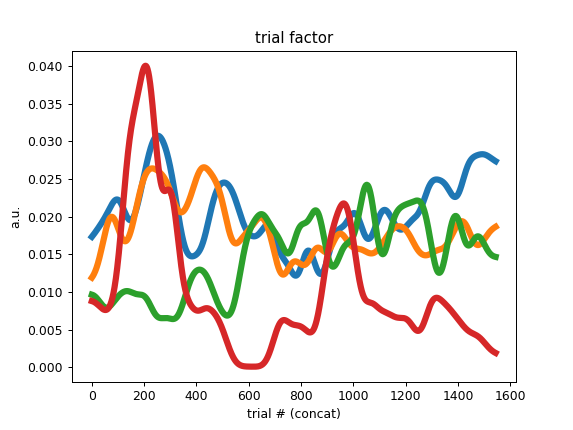

100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 32961.13it/s]


Text(0.5, 1.0, 'trial factor')

In [265]:
plt.figure()
# plt.plot(comps.factors[1])
plt.plot(bnpm.timeSeries.simple_smooth(comps.factors[1].cpu().numpy(), sig=40), linewidth=5);
plt.xlabel('trial # (concat)')
plt.ylabel('a.u.')
plt.title('trial factor')

<IPython.core.display.Javascript object>


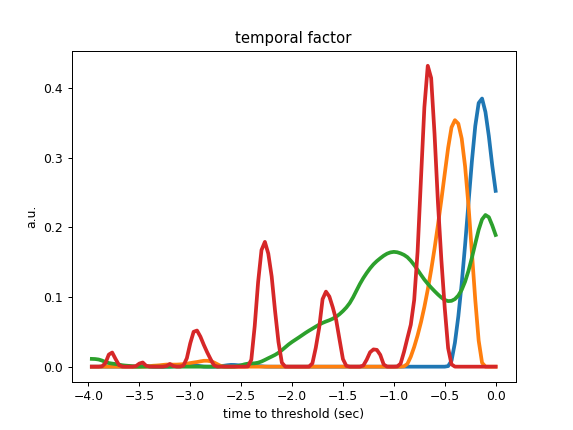

100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 61455.00it/s]


Text(0.5, 1.0, 'temporal factor')

In [266]:
plt.figure()
# plt.plot(comps.factors[1])
plt.plot(-np.arange(comps.factors[2].shape[0])[::-1]/Fs, bnpm.timeSeries.simple_smooth(comps.factors[2].cpu().numpy(), sig=1), linewidth=3);
plt.xlabel('time to threshold (sec)')
plt.ylabel('a.u.')
plt.title('temporal factor')

<IPython.core.display.Javascript object>


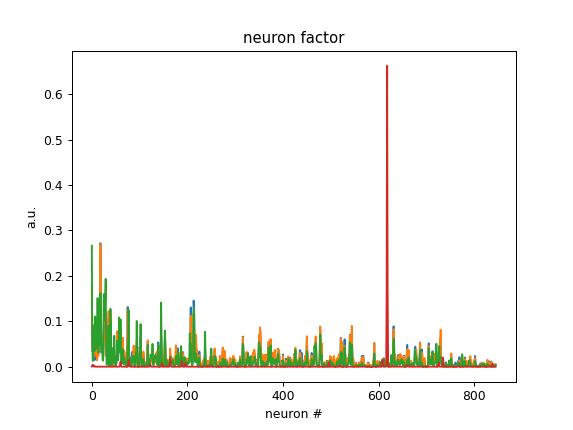

100%|█████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 74565.40it/s]


Text(0.5, 1.0, 'neuron factor')

In [267]:
plt.figure()
# plt.plot(comps.factors[1])
plt.plot(bnpm.timeSeries.simple_smooth(comps.factors[0].cpu().numpy(), sig=1));
plt.xlabel('neuron #')
plt.ylabel('a.u.')
plt.title('neuron factor')

In [268]:
import sklearn

In [269]:
test2 = sklearn.metrics.pairwise.cosine_similarity(comps.factors[0].cpu().numpy().T, Y=decoders, dense_output=True)

<IPython.core.display.Javascript object>


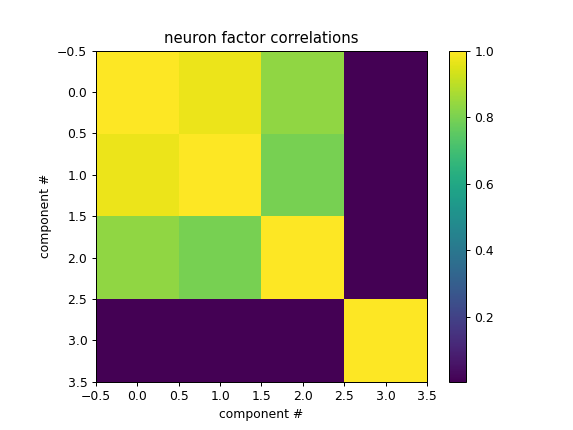

In [270]:
test = sklearn.metrics.pairwise.cosine_similarity(comps.factors[0].cpu().numpy().T, dense_output=True)

plt.figure()
plt.imshow(test)
plt.xlabel('component #')
plt.ylabel('component #')
plt.title('neuron factor correlations')
plt.colorbar()

In [271]:
test = sklearn.metrics.pairwise.cosine_similarity(comps.factors[0].cpu().numpy().T, Y=actVecs_cat.T, dense_output=True)

<IPython.core.display.Javascript object>


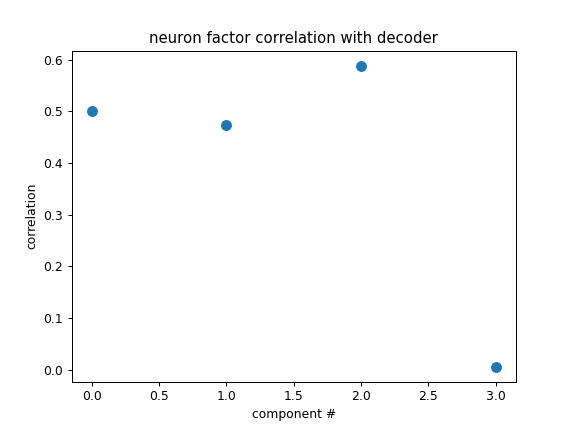

Text(0.5, 1.0, 'neuron factor correlation with decoder')

In [272]:
plt.figure()
plt.scatter(np.arange(len(test2)), test2, s=60)
plt.xlabel('component #')
plt.ylabel('correlation')
plt.title('neuron factor correlation with decoder')

In [844]:
arr.shape

(846, 108000)

In [864]:
peaks.shape

(846,)

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np

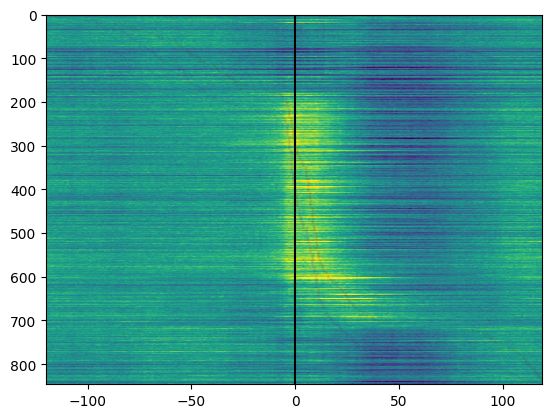

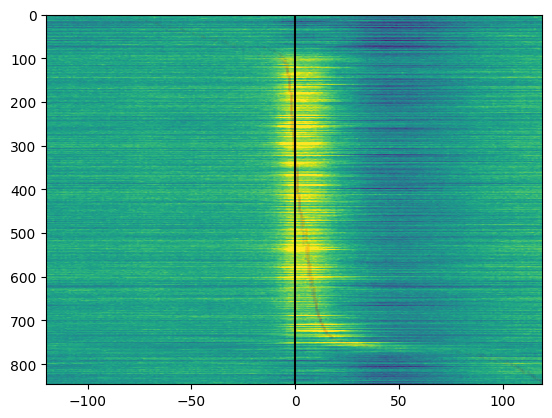

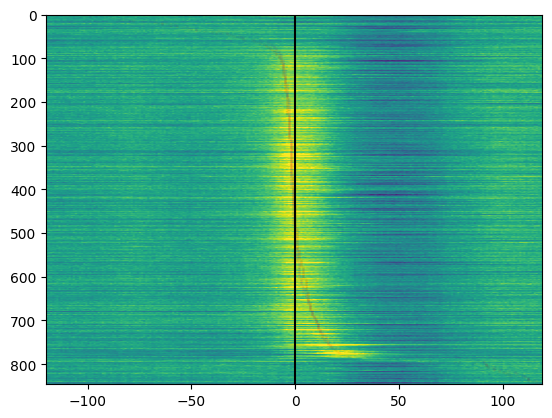

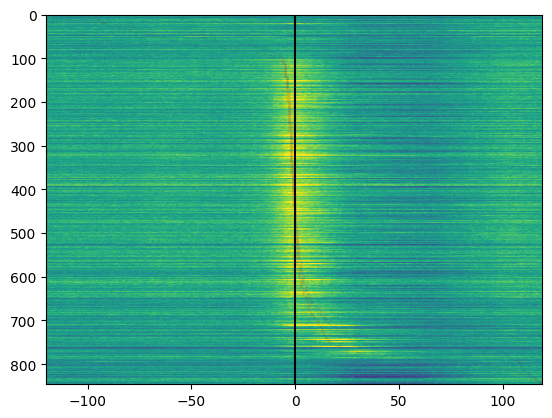

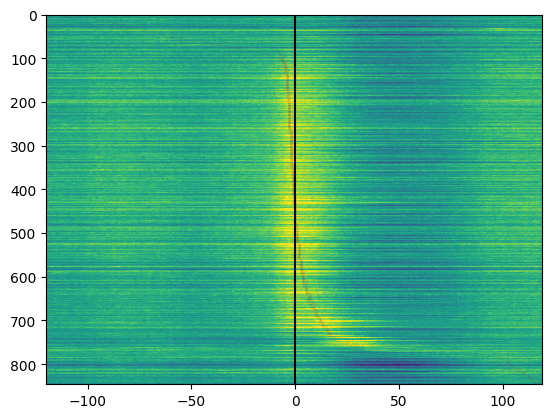

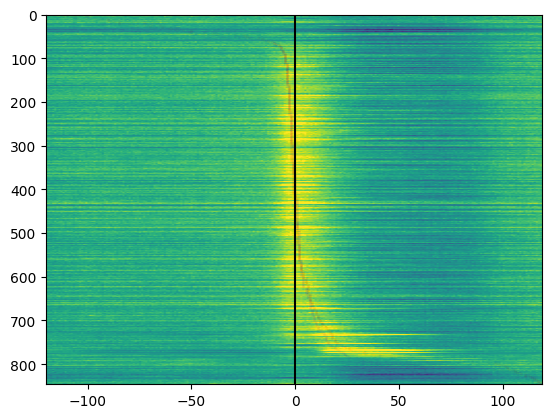

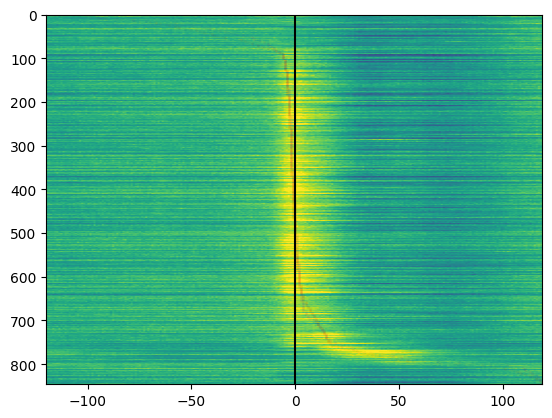

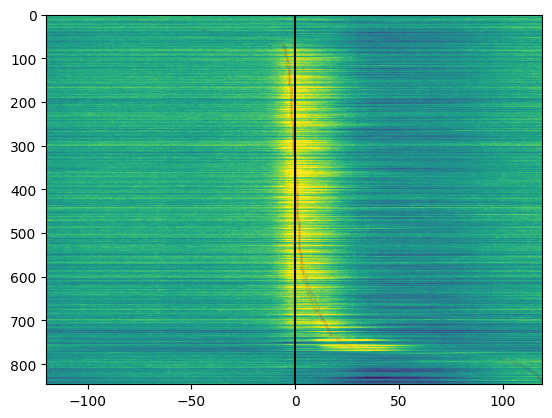

In [890]:
# for date in dates_toUse:
for date in dates_toUse[:]:
#     arr = sp_matched[date] - np.mean(sp_matched[date], axis=1, keepdims=True)
#     arr = sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True)
#     arr = dFoF_matched[date] - np.mean(dFoF_matched[date], axis=1, keepdims=True)
    arr = np.array(loggerVals_rollZ[date], dtype=np.float32)
    # date = '20221021'
    mean_traces_sorted, peaks_train_sorted, peaks_test_sorted, cv_idx, et_traces, xAxis, windows = bnpm.timeSeries.make_sorted_event_triggered_average(
#         arr=sp_matched[date].T @ expParams_objs[date]['baselineStuff']['ROIs']['cellWeightings'],
#         arr=sp_raw[date] - np.mean(sp_raw[date], axis=1, keepdims=True),
        arr=arr,
    #     arr=loggerAligned_dfs[date]['decoder']['cursor_brain_raw'].to_numpy(),
    #     arr=sp_matched[date].mean(0),
        idx_triggers=trials_111_success[date]['frames_end'],
    #     trigger_signal=t[:],
        win_bounds=[-30*4, 30*4],
        dim=-1,
#         trigger_signal_is_idx=True,
#         show_plot=True
    )

    plt.figure()
#     plt.imshow(mean_traces_sorted, clim=[-0.1, 0.2], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
    plt.imshow(mean_traces_sorted, clim=[-1.0, 1.0], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
    plt.plot([0,0], [0, mean_traces_sorted.shape[0]], 'k')
    plt.scatter(xAxis[peaks_train_sorted], np.arange(len(peaks_train_sorted)), c='r', s=2, alpha=0.01)
    plt.scatter(xAxis[peaks_test_sorted], np.arange(len(peaks_test_sorted)), c='m', s=2, alpha=0.01)
#     break

In [25]:
import ScanImageTiffReader

In [26]:
import bnpm.video

In [27]:
paths_videos = bnpm.path_helpers.find_paths('/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119', reMatch='exp_00001_')[:]

display(paths_videos)

['/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00001.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00002.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00003.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00004.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00005.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00006.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00007.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00008.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00009.tif',
 '/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_1511L/tmp_scanimage/20230119/exp_00001_00

In [32]:
triggers_start = trials_111_success['20230119']['frames_start']
triggers_end = trials_111_success['20230119']['frames_end']

In [33]:
frames_trs = np.cumsum([0] + [1000 for t in paths_videos])

In [34]:
xShifts = np.nan_to_num(loggerAligned_dfs['20230119']['motionCorrection']['xShift'].to_numpy()).astype(int)
yShifts = np.nan_to_num(loggerAligned_dfs['20230119']['motionCorrection']['yShift'].to_numpy()).astype(int)

xShifts_blocks = list(bnpm.indexing.make_batches(xShifts, batch_size=1000))
yShifts_blocks = list(bnpm.indexing.make_batches(yShifts, batch_size=1000))

In [35]:
import gc

In [36]:
from functools import partial

In [37]:
def get_frames(path, xs=None, ys=None):
    tr = ScanImageTiffReader.ScanImageTiffReader(path)
#     if xs is not None:
#         f = bnpm.image_processing.apply_shifts_along_axis(tr.data(), xShifts=xs, yShifts=ys, workers=1)
#     else:
    f = tr.data()
    tr.close()
    del tr
    gc.collect()
    gc.collect()
#     return f
    return bnpm.image_processing.bin_array(f, [1,2,2], function=partial(np.mean, dtype=f.dtype))
frames = bnpm.parallel_helpers.map_parallel(get_frames, [paths_videos[:75], xShifts_blocks[:75], yShifts_blocks[:75]], workers=16, method='multithreading')
# frames = []
# for ii, (tr,x,y) in tqdm(enumerate(zip(paths_videos, xShifts_blocks, yShifts_blocks)), total=len(paths_videos)):
#     frames.append(get_frames(tr, x, y))
#     if ii >= 75:
#         break

100%|██████████████████████████████████████████████████████████████████████████████| 75/75 [03:24<00:00,  2.72s/it]


In [38]:
import torch

In [39]:
frames_cat = torch.cat([torch.as_tensor(f, dtype=torch.int16) for f in frames[:]], dim=0)

In [40]:
et_traces_end = bnpm.timeSeries.event_triggered_traces_torch(frames_cat, triggers_end[:184], win_bounds=[-10,0], dim=0)[0].numpy().mean(-1).astype(np.int16)
et_traces_start = bnpm.timeSeries.event_triggered_traces_torch(frames_cat, triggers_start[:184], win_bounds=[-10,0], dim=0)[0].numpy().mean(-1).astype(np.int16)
et_traces_delta = et_traces_end - et_traces_start

<IPython.core.display.Javascript object>


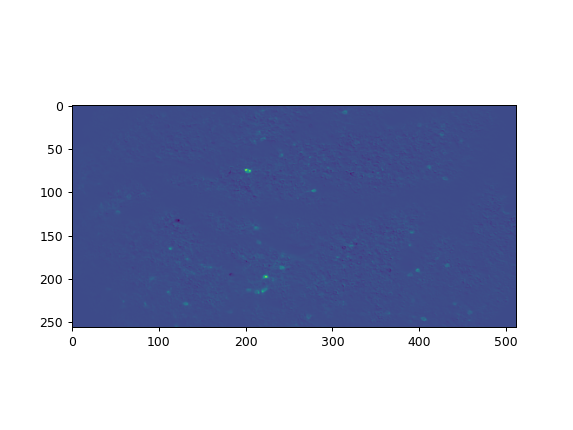

In [306]:
plt.figure()
plt.imshow(et_traces_delta.mean(-1))

In [307]:
et_traces_delta.shape

(256, 512, 184)

In [311]:
frames_cat.shape

torch.Size([75000, 256, 512])

In [ ]:
test = bnpm.timeSeries.rolling_percentile_rq_multicore(et_traces_start[:,:,0], window=7, ptile=50)

<IPython.core.display.Javascript object>


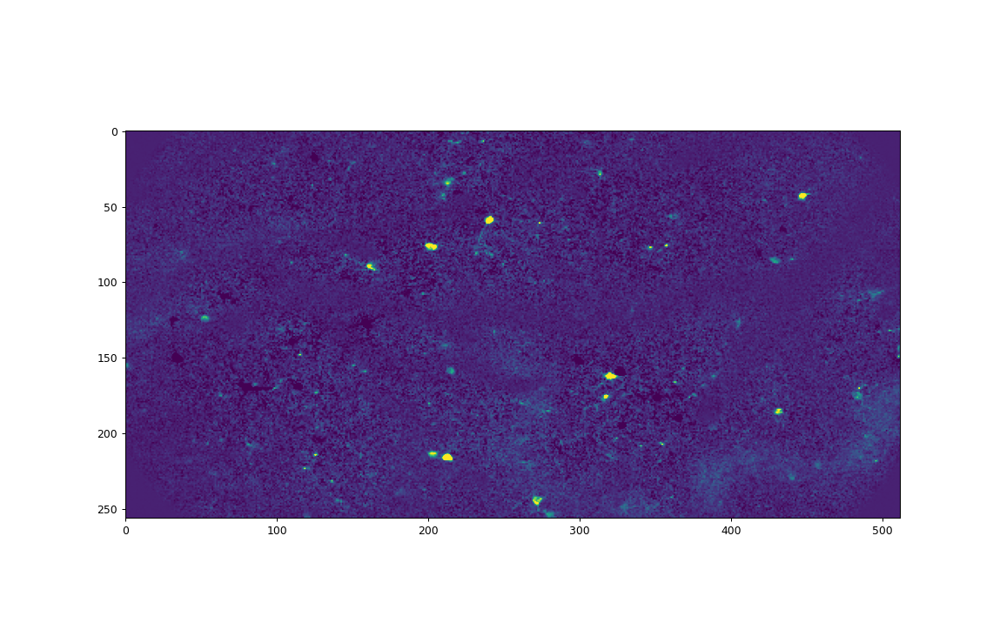

interactive(children=(IntSlider(value=0, description='i_frame', max=183), Output()), _dom_classes=('widget-int…

In [309]:
bnpm.plotting_helpers.display_toggle_image_stack(et_traces_delta.transpose(2,0,1), clim=[-100,1000])

In [69]:
from bnpm.video import play_video_cv2

In [136]:
et_traces_ms = et_traces.type(torch.float32) - et_traces[:,:,:,:10].type(torch.float32).mean(-1, keepdims=True)

In [137]:
et_traces.shape

torch.Size([256, 512, 184, 90])

In [258]:
vid = (et_traces_ms.type(torch.float32).median(-2)[0] * 2**8 / 2**16).permute(2,0,1)

In [ ]:
vid.numpy().astype(np.uint8).shape

In [260]:
play_video_cv2(vid.numpy().astype(np.uint8)*50 + 50, frameRate=30)

100%|██████████████████████████████████████████████████████████████████████████████| 90/90 [00:03<00:00, 27.21it/s]


<IPython.core.display.Javascript object>


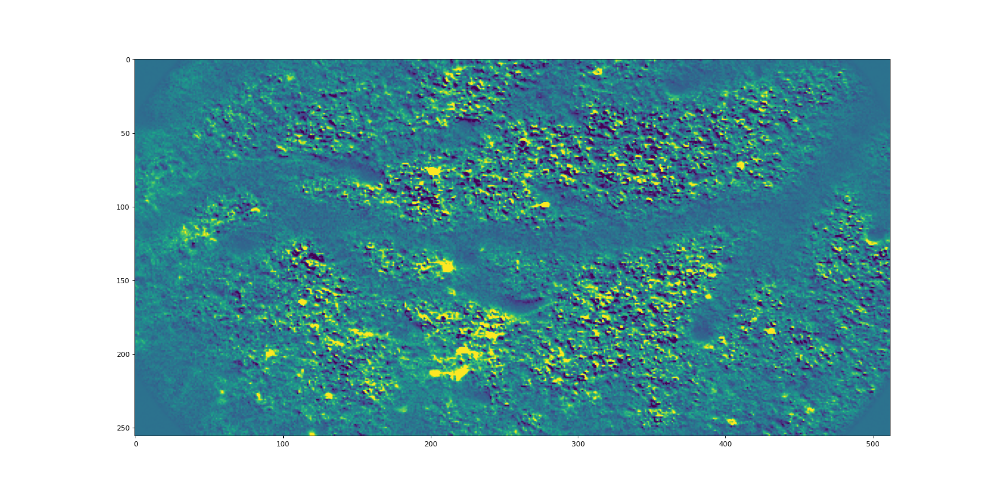

In [264]:
plt.figure()
plt.imshow(vid[-1], clim=[-0.3, 0.5])

In [148]:
trials = et_traces_ms[...,-25:].mean(-1).permute(2,0,1).reshape(et_traces.shape[2], -1)

In [149]:
trials.shape

torch.Size([184, 131072])

In [150]:
trials_cc = torch.corrcoef(trials[:,:])

<IPython.core.display.Javascript object>


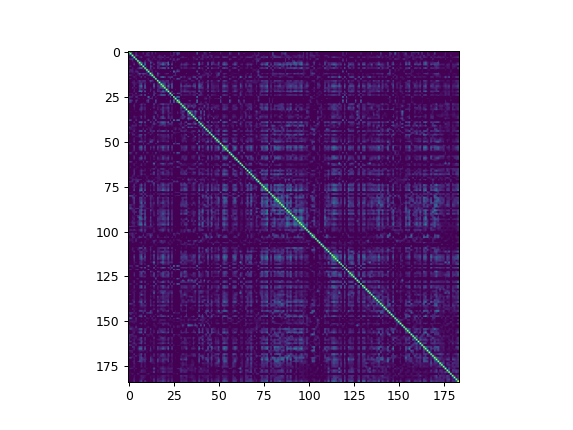

In [151]:
plt.figure()
plt.imshow(trials_cc, clim=[0,1])

In [291]:
trials_111_success['20230112']['frames_start']

array([  3995.,   5028.,   5188.,   5378.,   6823.,   7069.,   7335.,
         7607.,   7981.,   8148.,   8356.,   8546.,   9051.,   9225.,
        20369.,  21153.,  21322.,  21475.,  21657.,  21864.,  23015.,
        24059.,  25158.,  26288.,  29033.,  30053.,  30477.,  37152.,
        37481.,  37988.,  38154.,  38359.,  38688.,  39007.,  39169.,
        39754.,  39948.,  40172.,  41167.,  41351.,  41531.,  41687.,
        41876.,  42140.,  42486.,  42648.,  42832.,  43078.,  43326.,
        43532.,  43707.,  44084.,  44295.,  44636.,  44860.,  45067.,
        45236.,  45854.,  46025.,  46262.,  46443.,  46716.,  55722.,
        56071.,  56562.,  56865.,  57072.,  58106.,  58303.,  58516.,
        58767.,  59016.,  59196.,  59371.,  60775.,  61274.,  61799.,
        62099.,  62616.,  62821.,  64046.,  64356.,  64541.,  64732.,
        64937.,  65283.,  65438.,  65652.,  65887.,  66297.,  67287.,
        67576.,  72163.,  72544.,  78143.,  78721.,  78953.,  79115.,
        79328.,  796

In [170]:
import roicat

In [191]:
np.round(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings']*1000).astype(np.int64).shape

(846,)

In [194]:
roicat_out['ROIs']['ROIs_aligned'][0][iscell].shape

(846, 524288)

In [196]:
len(np.round(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings']*1000).astype(np.int64))

846

In [198]:
FOV_test = roicat.visualization.compute_colored_FOV(
    spatialFootprints=[roicat_out['ROIs']['ROIs_aligned'][0][iscell]],
    FOV_height=roicat_out['ROIs']['frame_height'],
    FOV_width=roicat_out['ROIs']['frame_width'],
    labels=[np.round(expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings']*1000).astype(np.int64)],
    cmap=bnpm.plotting_helpers.simple_cmap([[0,0,0],[1,1,1]]),
)

<IPython.core.display.Javascript object>


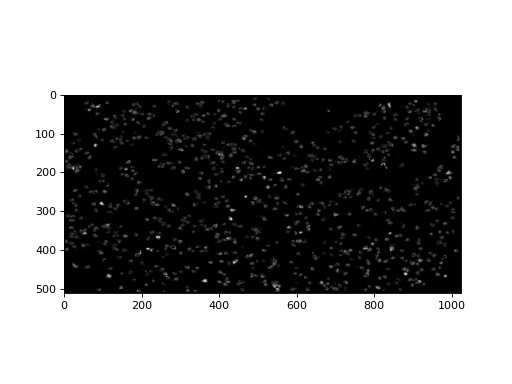

In [201]:
plt.figure()
plt.imshow(FOV_test[0])

In [211]:
mask = expParams_objs[dates_toUse[1]]['baselineStuff']['ROIs']['cellWeightings'][:,None]
hi = roicat_out['ROIs']['ROIs_aligned'][0][iscell].multiply(mask).max(0).toarray().reshape(512, 1024)

<IPython.core.display.Javascript object>


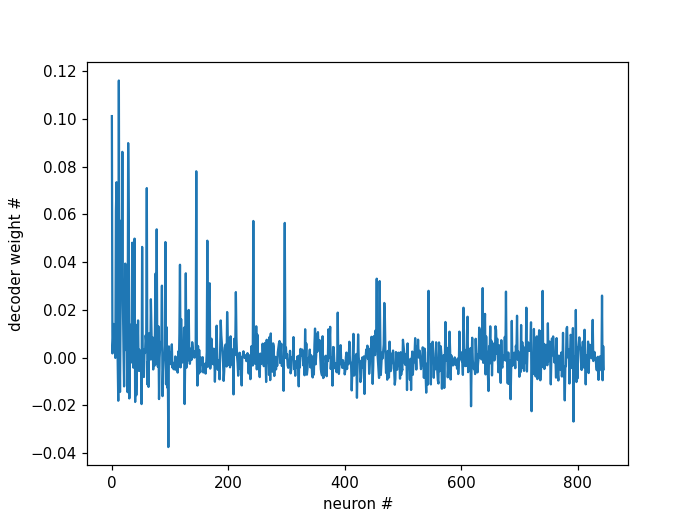

Text(0, 0.5, 'decoder weight #')

In [238]:
plt.figure()
# plt.hist(mask, 200);
plt.plot(mask)
plt.xlabel('neuron #')
plt.ylabel('decoder weight #')

In [212]:
hi.shape

(512, 1024)

<IPython.core.display.Javascript object>


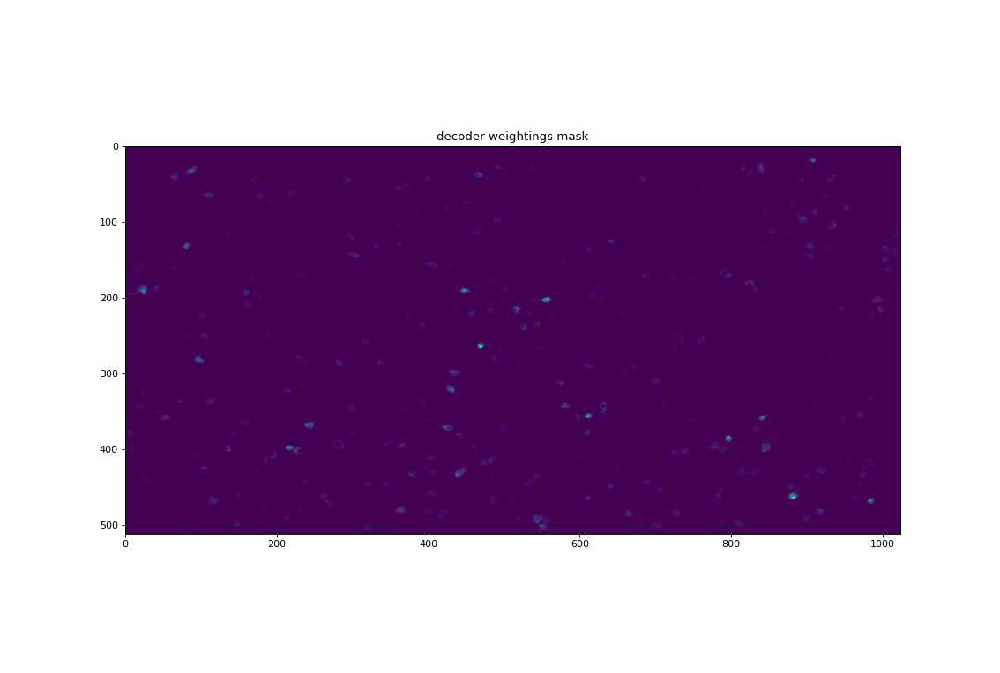

Text(0.5, 1.0, 'decoder weightings mask')

In [214]:
plt.figure()
plt.imshow(hi)
plt.title('decoder weightings mask')

<IPython.core.display.Javascript object>


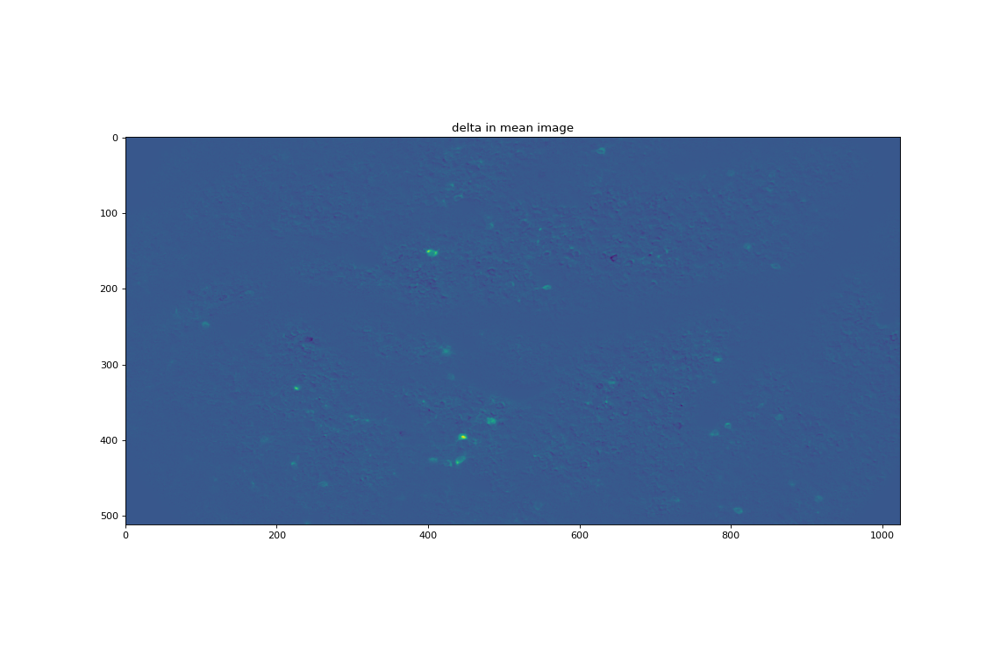

Text(0.5, 1.0, 'delta in mean image')

In [220]:
plt.figure()
plt.imshow(hey3)
plt.title('delta in mean image')

<IPython.core.display.Javascript object>


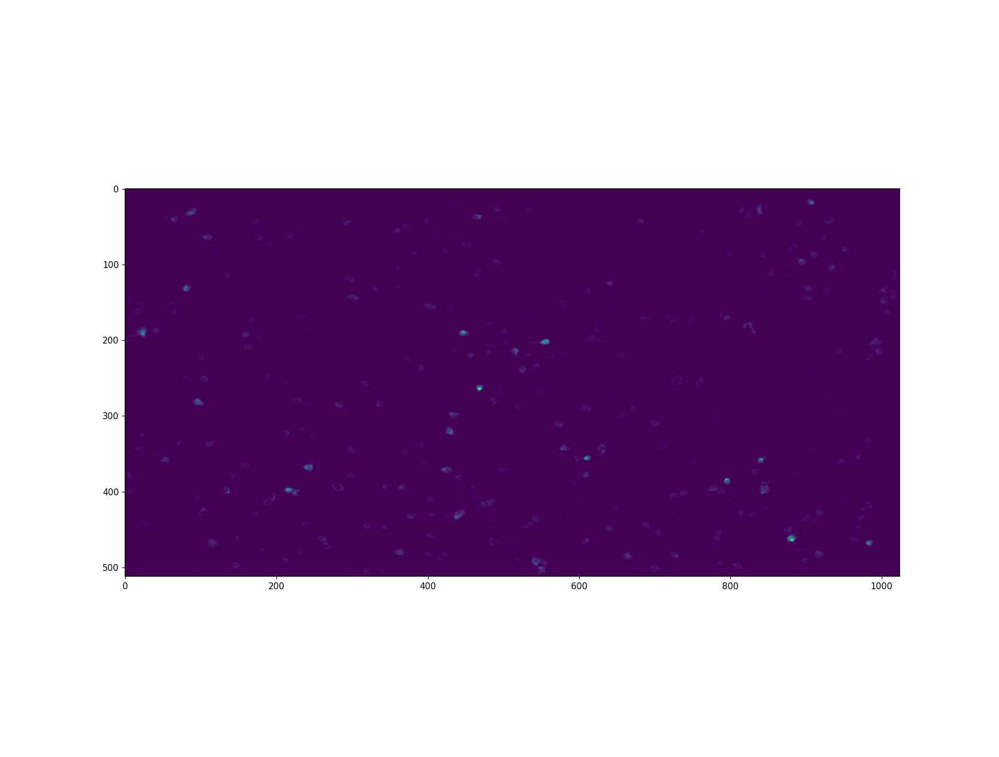

In [228]:
plt.figure()
plt.imshow(bnpm.image_processing.bin_array(hi, bin_widths=[1,1]))

visualize the cells over days

In [301]:
import bnpm.plotting_helpers

In [147]:
import roicat

In [145]:
fovs = roicat.tracking.visualization.compute_colored_FOV(
    spatialFootprints=roicat_out['ROIs']['ROIs_aligned'],
    FOV_height=roicat_out['ROIs']['frame_height'],
    FOV_width=roicat_out['ROIs']['frame_width'],
    labels=roicat_out['UCIDs_bySession'],
)

In [148]:
fovs = roicat.visualization.compute_colored_FOV(
    spatialFootprints=rois_matched,
    FOV_height=roicat_out['ROIs']['frame_height'],
    FOV_width=roicat_out['ROIs']['frame_width'],
    labels=[np.arange(rois_matched[0].shape[0]) for _ in range(len(rois_matched))],
)

<IPython.core.display.Javascript object>


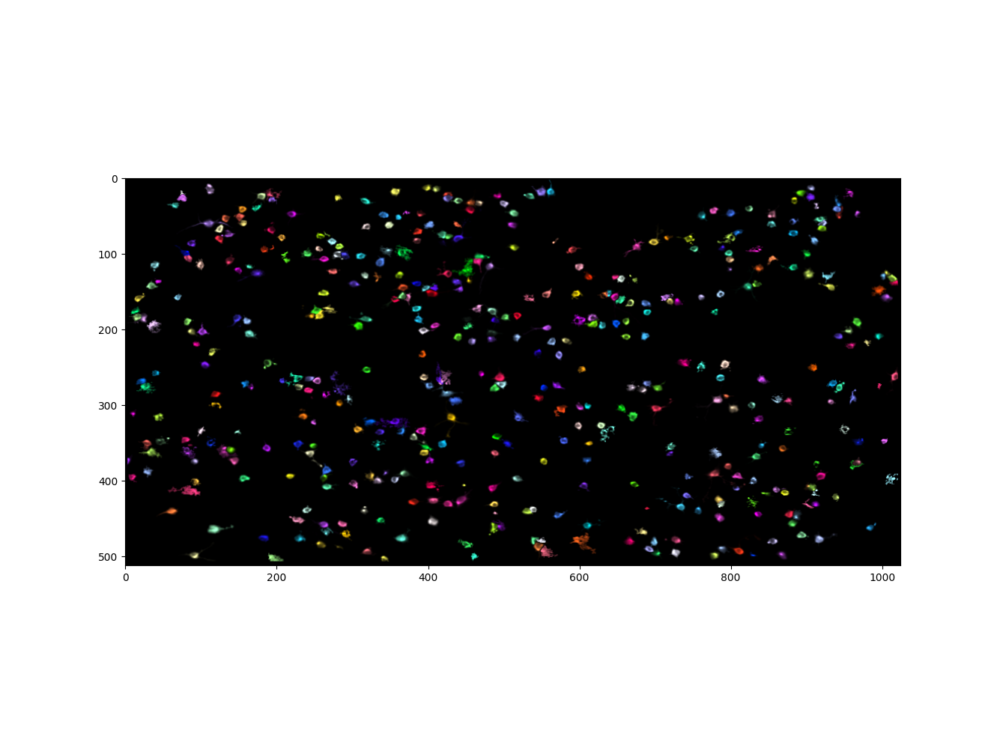

interactive(children=(IntSlider(value=0, description='i_frame', max=19), Output()), _dom_classes=('widget-inte…

In [149]:
%matplotlib notebook

roicat.visualization.display_toggle_image_stack(fovs)

In [44]:
import xxhash

def get_unique_decoders(decoders):
    hashes_unique, idx, inv = np.unique([xxhash.xxh3_64_hexdigest(d) for d in decoders], return_index=True, return_inverse=True)
    idx_argsort = np.argsort(idx)
    decoders_unique_sorted = np.array(decoders)[idx][idx_argsort]
    return decoders_unique_sorted, idx, idx_argsort[inv]

In [45]:
# decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse)
decoders, idx, inv = get_unique_decoders([expParams_objs[d]['baselineStuff']['ROIs']['cellWeightings'] for d in dates_toUse[:-1]])
decoder_dates = {date: i for i,date in zip(inv, dates_toUse)}

In [46]:
decoder_session_divisions = np.concatenate([[np.where(np.array(list(decoder_dates.values())) == d)[0][0] for d in np.unique(list(decoder_dates.values()))], [len(decoder_dates)]])

In [47]:
def get_frames_111_success(logger):
    frames_trialEnds   = logger['trials']['counter_frameNum_trialEnd'].to_numpy()
    frames_trialStarts = logger['trials']['counter_frameNum_trialStart'].to_numpy()

    type_111_success = (logger['trials']['trialType_cursorOn'] * logger['trials']['trialType_feedbackLinked'] * logger['trials']['trialType_rewardOn'] * logger['trials']['success_outcome']).to_numpy()
    framesEnd_111_success = frames_trialEnds[type_111_success[:len(frames_trialEnds)].astype(bool)]
    framesStart_111_success = frames_trialStarts[type_111_success[:len(frames_trialStarts)].astype(bool)]
    
    out = {
        'trialNum': logger['trials']['trialNum_trialStart'],
        'frames_start': framesStart_111_success,
        'frames_end': framesEnd_111_success,
        'duration': logger['trials']['counter_frameNum_trialEnd'] - logger['trials']['counter_frameNum_trialStart'],
    }
    
    return out

trials_111_success = {date: get_frames_111_success(logger) for date, logger in loggerAligned_dfs.items()}

In [51]:
et_traces_start = bnpm.timeSeries.event_triggered_traces(loggerVals_rollZ['20230112'], triggers_start[:], win_bounds=[-10,0], dim=0)[0].mean(-1).astype(np.int16)
et_traces_end   = bnpm.timeSeries.event_triggered_traces(loggerVals_rollZ['20230112'], triggers_end[:], win_bounds=[-10,0], dim=0)[0].mean(-1).astype(np.int16)

/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")


In [101]:
%matplotlib notebook
actVecs = {}
trajs = {}
for date in tqdm(dates_toUse[:]):
    triggers_start = trials_111_success[date]['frames_start']
    triggers_end = trials_111_success[date]['frames_end']
    
    arr = loggerVals_rollZ[date]
#     arr = sp_matched[date]
#     arr = sp_raw[date]
#     arr = F_matched[date]
#     arr = dFoF_matched[date]
#     arr = arr[np.argsort(decoders[idx_decoder_toUse])[::-1]]

    et_traces_start, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
        idx_triggers=triggers_start,
        win_bounds=[-0,1],
        dim=-1,
    )
    et_traces_end, xAxis, windows = bnpm.timeSeries.event_triggered_traces(
        arr=arr,
        idx_triggers=triggers_end,
        win_bounds=[-0,1],
        dim=-1,
    )

#     et_traces[np.abs(et_traces) > 5] = np.nan
    
#     et_traces = np.nan_to_num(et_traces)
    
    mean_start   = np.nanmean(et_traces_start, axis=2)
    mean_end   = np.nanmean(et_traces_end, axis=2)
    
    actVecs.update({date: mean_end})
    
    
#     out_mean = out_mean[np.argsort(decoders[idx_decoder_toUse])[::-1]]
    
#     actVecs.update({date: out_mean})
    
#     plt.figure()
# #     plt.imshow(np.nan_to_num(et_traces).mean(1), clim=[-0.02,0.06], aspect='auto', extent=(xAxis[0], xAxis[-1], mean_traces_sorted.shape[0], 0))
#     plt.imshow(
#         out_mean.T, 
#         clim=[-0.02,2.15],
#         aspect='auto', 
# #         extent=(xAxis[0], xAxis[-1], out_mean.shape[0], 0)
#     )
# #     plt.plot([0,0], [0, out_mean.shape[0]], 'r')
# #     break

  0%|                                                     | 0/8 [00:00<?, ?it/s]/media/rich/Home_Linux_partition/github_repos/basic_neural_processing_modules/bnpm/timeSeries.py:328: UserWarning: idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.
  warn("idx_triggers is np.ndarray but not integer dtype. Converting to torch.long dtype.")
100%|████████████████████████████████████████████| 8/8 [00:00<00:00, 185.70it/s]


In [102]:
et_traces.shape

(846, 237, 480)

In [103]:
mean_start.shape

(846, 237)

In [104]:
decoders[0].shape

(846,)

<IPython.core.display.Javascript object>


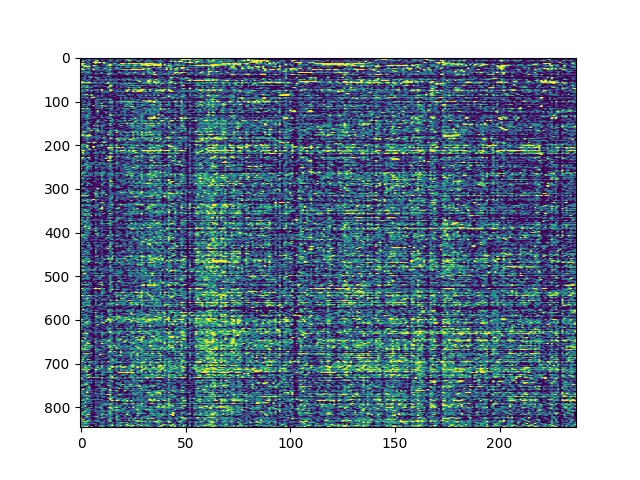

In [105]:
plt.figure()
plt.imshow(mean_end, aspect='auto', clim=[0,2])

In [109]:
mean_end_dec = {date: a * decoders[0][:,None] for date,a in actVecs.items()}
[print(f'{mean_end_dec.shape = }') for mean_end_dec in mean_end_dec.values()];

mean_end_dec.shape = (846, 128)
mean_end_dec.shape = (846, 196)
mean_end_dec.shape = (846, 195)
mean_end_dec.shape = (846, 186)
mean_end_dec.shape = (846, 174)
mean_end_dec.shape = (846, 207)
mean_end_dec.shape = (846, 222)
mean_end_dec.shape = (846, 237)


In [115]:
mean_end_dec_norm = {date: m / np.nansum(m, axis=0) for date,m in mean_end_dec.items()}

<IPython.core.display.Javascript object>


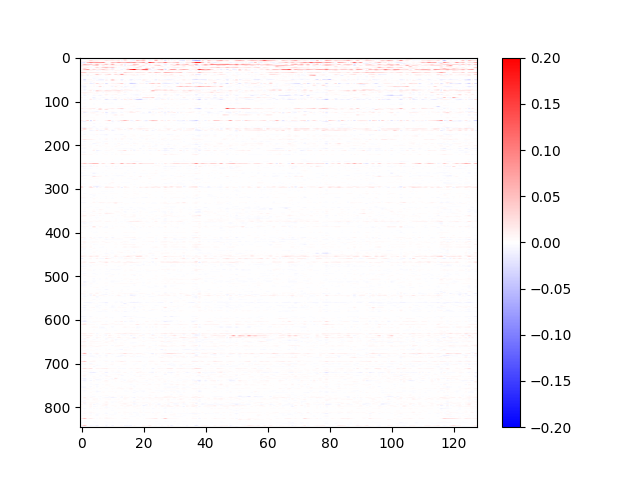

In [117]:
plt.figure()
plt.imshow(mean_end_dec_norm[dates_toUse[0]], aspect='auto', clim=[-0.2,0.2], cmap='bwr')
plt.colorbar()

<IPython.core.display.Javascript object>


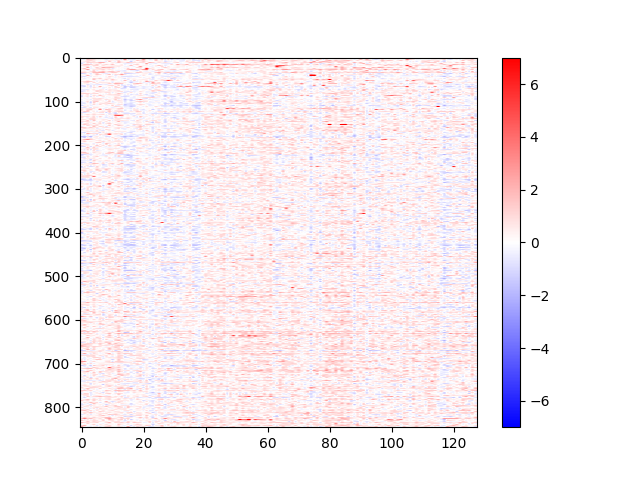

In [120]:
plt.figure()
plt.imshow(actVecs[dates_toUse[0]], aspect='auto', clim=[-7,7], cmap='bwr')
plt.colorbar()

Is the activity vector more closely aligned with modulating the average or the decoder?
decoder vs average
activity vs decoder
activity vs average

In [65]:
import sklearn

In [66]:
comps_pca, scores_pca, singVals, EVR = bnpm.decomposition.torch_pca(mean_end_dec_norm.T, rank=None, device='cpu', mean_sub=True, zscore=False, return_numpy=True)

In [67]:
comps_pca.shape

(846, 237)

In [68]:
decoders[0].shape

(846,)

<IPython.core.display.Javascript object>


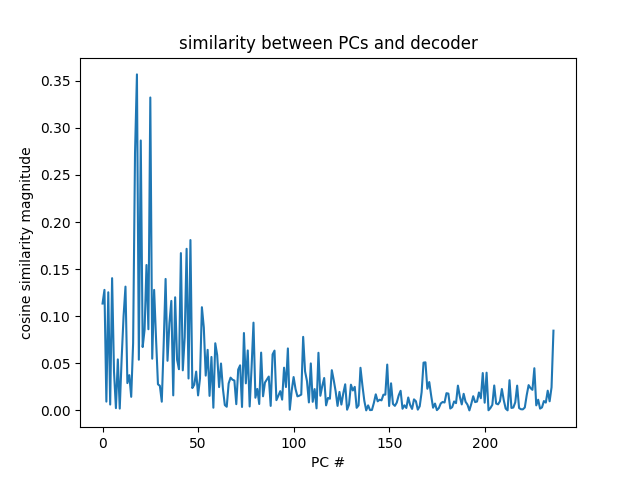

Text(0.5, 1.0, 'similarity between PCs and decoder')

In [69]:
comps_pca_decSim = sklearn.metrics.pairwise.cosine_similarity(comps_pca.T, decoders[0][None,:])

%matplotlib notebook
plt.figure()
plt.plot(np.abs(comps_pca_decSim))
plt.xlabel('PC #')
plt.ylabel('cosine similarity magnitude')
plt.title('similarity between PCs and decoder')
# plt.xlim([-0.5, 6])

In [71]:
import tensorly as tl

In [147]:
cps = {date: tl.decomposition.CP(
    rank=7,
    n_iter_max=100,
    init='svd',
    svd='truncated_svd',
    normalize_factors=False,
    orthogonalise=False,
    tol=1e-9,
    random_state=None,
    verbose=2,
    sparsity=None,
    l2_reg=0,
    mask=None,
    cvg_criterion='abs_rec_error',
    fixed_modes=None,
    svd_mask_repeats=5,
    linesearch=False,
    callback=None,
) for date in dates_toUse}
factors_cp = {date: cp.fit_transform(tensor=mean_end_dec_norm[date]) for date,cp in cps.items()}
comps_cp = {date: f.factors[0] for date,f in factors_cp.items()}
scores_cp = {date: f.factors[1] for date,f in factors_cp.items()}

Starting iteration 1
Mode 0 of 2
Mode 1 of 2
reconstruction error=0.5573248396776092
Starting iteration 2
Mode 0 of 2
Mode 1 of 2
iteration 1, reconstruction error: 0.557324938882719, decrease = -9.920510979366526e-08, unnormalized = 1.9954384988040579
Starting iteration 3
Mode 0 of 2
Mode 1 of 2
iteration 2, reconstruction error: 0.557324938882719, decrease = 0.0, unnormalized = 1.9954384988040579
PARAFAC converged after 2 iterations
Starting iteration 1
Mode 0 of 2
Mode 1 of 2
reconstruction error=0.5550130555021624
Starting iteration 2
Mode 0 of 2
Mode 1 of 2
iteration 1, reconstruction error: 0.5550130555021624, decrease = 0.0, unnormalized = 2.3361603714112773
PARAFAC converged after 1 iterations
Starting iteration 1
Mode 0 of 2
Mode 1 of 2
reconstruction error=0.5662404237320606
Starting iteration 2
Mode 0 of 2
Mode 1 of 2
iteration 1, reconstruction error: 0.5662404237320606, decrease = 0.0, unnormalized = 2.49749386844968
PARAFAC converged after 1 iterations
Starting iteration 

In [122]:
tensors_by_rank = {date: [tl.tenalg.outer(k) for k in bnpm.indexing.cp_to_kruskal(f.factors)] for date,f in factors_cp.items()}

In [123]:
def tensor_EVR(y_pred, y_true):
    return 1 - ( tl.norm(y_true - y_pred, order=2) / tl.norm(y_true, order=2) )

In [129]:
EVRs = {date: [tensor_EVR(y_pred=t, y_true=mean_end_dec_norm[date]) for t in tbr] for date,tbr in tensors_by_rank.items()}

<IPython.core.display.Javascript object>


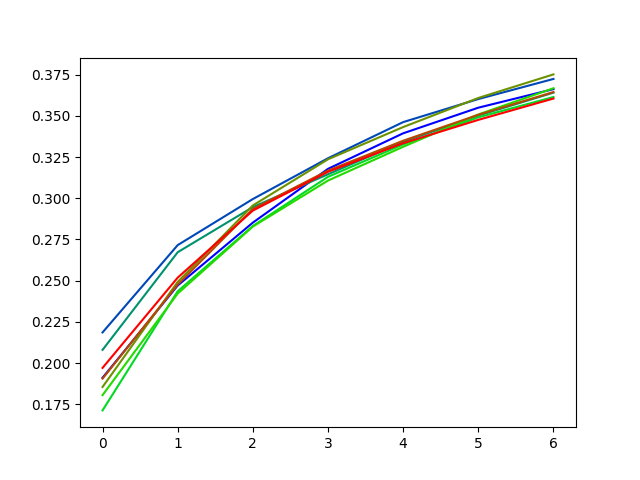

In [136]:
colors = bnpm.plotting_helpers.simple_cmap([[0,0,1],[0,1,0],[1,0,0]])(np.linspace(0.,1., len(EVRs)))
plt.figure()
[plt.plot(np.cumsum(e), c=c) for e,c in zip(EVRs.values(), colors)];

<IPython.core.display.Javascript object>


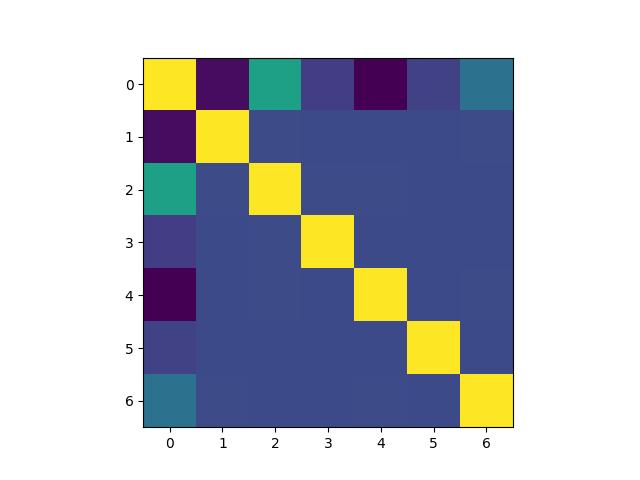

In [135]:
plt.figure()
plt.imshow(np.corrcoef(scores_cp.T))

In [826]:
import sklearn

nmf = sklearn.decomposition.NMF(
    n_components=7,
    init=None,
    solver='cd',
    beta_loss='frobenius',
    tol=0.0001,
    max_iter=200,
    random_state=None,
    alpha_W=0.0,
    alpha_H='same',
    l1_ratio=0.0,
    verbose=1,
    shuffle=False,
)
comps_nmf = nmf.fit_transform(X=mean_end_dec_norm)

ValueError: Negative values in data passed to NMF (input X)

In [ ]:
import sklearn

fa = sklearn.decomposition.FactorAnalysis(
    n_components=7,
    tol=0.01,
    copy=True,
    max_iter=1000,
    noise_variance_init=None,
    svd_method='randomized',
    iterated_power=3,
    rotation=None,
    random_state=0,
)
scores_fa = fa.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
import sklearn

kpca = sklearn.decomposition.KernelPCA(
    n_components=7,
    kernel='rbf',
    gamma=None,
    degree=3,
    coef0=1,
    kernel_params=None,
    alpha=1.0,
    fit_inverse_transform=False,
    eigen_solver='auto',
    tol=0,
    max_iter=None,
    iterated_power='auto',
    remove_zero_eig=False,
    random_state=None,
    copy_X=True,
    n_jobs=None,
)
scores_kpca = kpca.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
import sklearn

spca = sklearn.decomposition.SparsePCA(
    n_components=4,
    alpha=0.5,
    ridge_alpha=0.01,
    max_iter=1000,
    tol=1e-08,
    method='lars',
    n_jobs=None,
    U_init=None,
    V_init=None,
    verbose=False,
    random_state=None,
)
scores_spca = spca.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
import umap

umap_obj = umap.UMAP(
    n_neighbors=10,
    n_components=2,
    metric='euclidean',
    metric_kwds=None,
    output_metric='euclidean',
    output_metric_kwds=None,
    n_epochs=None,
    learning_rate=1.0,
    init='spectral',
    min_dist=0.1,
    spread=1.0,
    low_memory=True,
    n_jobs=-1,
    set_op_mix_ratio=1.0,
    local_connectivity=1.0,
    repulsion_strength=1.0,
    negative_sample_rate=5,
    transform_queue_size=4.0,
    a=None,
    b=None,
    random_state=None,
    angular_rp_forest=False,
    target_n_neighbors=-1,
    target_metric='categorical',
    target_metric_kwds=None,
    target_weight=0.5,
    transform_seed=42,
    transform_mode='embedding',
    force_approximation_algorithm=False,
    verbose=False,
    tqdm_kwds=None,
    unique=False,
    densmap=False,
    dens_lambda=2.0,
    dens_frac=0.3,
    dens_var_shift=0.1,
    output_dens=False,
    disconnection_distance=None,
    precomputed_knn=(None, None, None),
)

scores_umap = umap_obj.fit_transform(X=mean_end_dec_norm.T)

In [ ]:
scores_umap.shape

<IPython.core.display.Javascript object>


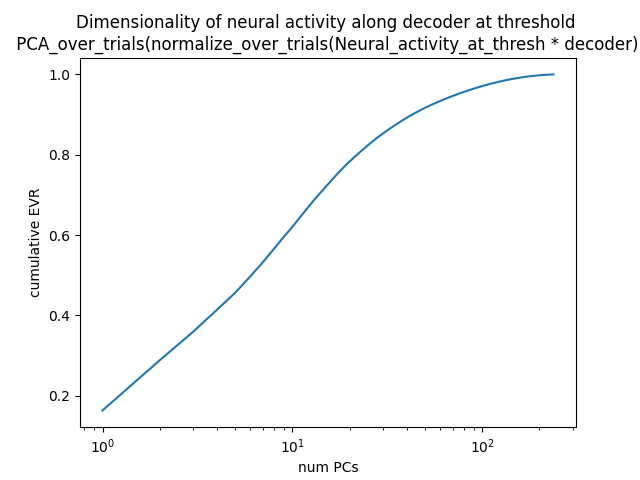

In [827]:
plt.figure()
plt.plot(np.arange(1, len(EVR)+1), np.cumsum(EVR))
plt.xscale('log')
plt.xlabel('num PCs')
plt.ylabel('cumulative EVR')
plt.title('Dimensionality of neural activity along decoder at threshold \n PCA_over_trials(normalize_over_trials(Neural_activity_at_thresh * decoder))');

In [283]:
import itertools

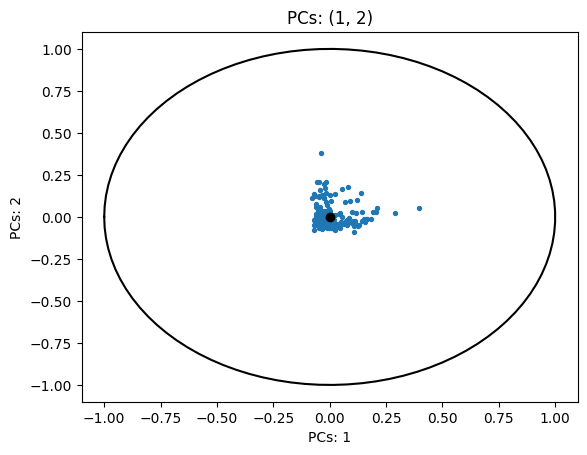

In [160]:
scores = scores_cp[dates_toUse[7]].copy()

%matplotlib inline
for combo in list(itertools.combinations((1,2), 2)):
    plt.figure()
    plt.scatter(scores[:,combo[0]], scores[:,combo[1]], s=8)
    plt.title(f'PCs: {combo}')
    plt.xlabel(f'PCs: {combo[0]}')
    plt.ylabel(f'PCs: {combo[1]}')    
    plt.plot(np.cos(np.linspace(-np.pi, np.pi, num=100)), np.sin(np.linspace(-np.pi, np.pi, num=100)), 'k')
    plt.scatter([0],[0], c='k')

### Save results

Make a nice little dictionary with all the relevant information

In [33]:
name_animal = 'mouse_2_6'

In [63]:
data_output = {
    'name_animal': name_animal,
    'paths_logger': paths_logger,
    'paths_expParams': paths_expParams,
    'dirs_logger': dirs_logger,
    'paths_transfer': paths_transfer,
#     'logger_objs': logger_objs,
#     'expParams_objs': expParams_objs,
#     'logger_dfs': logger_dfs,
    'n_sessions': n_sessions,
    'trials_duration_nowTime': trials_duration_nowTime,
    'trials_success': trials_success,
    'trials_type_111': trials_type_111,
    'trials_numSuccess__111': trials_numSuccess__111,
    'trials_duration_time__success_111': trials_duration_time__success_111,
    'edges': edges,
    'trials_durationHist_time__success_111': trials_durationHist_time__success_111,
    'names_states': names_states,
}

save the analysis outputs and the logger and expParams objects

In [68]:
bnpm.file_helpers.pickle_save(
    obj=data_output,
    path_save=str(Path(r'/media/rich/bigSSD/analysis_data/BMI/analysis_BMI_rewards').resolve() / name_animal / (name_animal + '__analysis_BMI_rewards' + '.pkl')),
    mkdir=True,
)

bnpm.file_helpers.pickle_save(
    obj={
        'logger_dfs': logger_dfs,
        'logger_objs': logger_objs,
        'expParams_objs': expParams_objs,
    },
    path_save=str(Path(r'/media/rich/bigSSD/analysis_data/BMI/analysis_BMI_rewards').resolve() / name_animal / (name_animal + '__logger_expParams' + '.pkl')),
    mkdir=True
)